In [94]:
import matplotlib as mpl
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import uproot3 as uproot
#import uproot4 as uproot
import pandas as pd
import numpy as np
import math
from tqdm import tqdm

import kdar_functions as kdar
import general_functions as utils

import importlib

print(np.__version__)

1.26.4


In [95]:
importlib.reload(kdar)
importlib.reload(utils)

<module 'general_functions' from '/Users/bbogart/Documents/analysisCode/kdar_bdt/general_functions.py'>

In [96]:
single_run = False

In [97]:
def weighted_quantile(data, weights, quantile):
    if not (0 <= quantile <= 1):
        raise ValueError("Quantile must be between 0 and 1.")

    sorted_indices = np.argsort(data)
    sorted_data = data[sorted_indices]
    sorted_weights = weights[sorted_indices]

    cumulative_weights = np.cumsum(sorted_weights)
    total_weight = cumulative_weights[-1]

    target_cumulative_weight = quantile * total_weight
    
    index = np.searchsorted(cumulative_weights, target_cumulative_weight, side='left')

    if index == 0:
        return sorted_data[0]
    elif index == len(sorted_data):
        return sorted_data[-1]

    if cumulative_weights[index - 1] == target_cumulative_weight:
        return (sorted_data[index - 1] + sorted_data[index]) / 2.0
    else:
        return sorted_data[index]


In [77]:
def get_stats(diff,weights=[],verbose=True):

    q=[0,0,0]
    
    if len(weights)!=len(diff): q = np.quantile(diff, [0.16, 0.5, 0.84])
    else: 
        print("Using weights")
        q[0] = weighted_quantile(diff, weights, 0.16)
        q[1] = weighted_quantile(diff, weights, 0.5)
        q[2] = weighted_quantile(diff, weights, 0.84)
            
    mean = np.average(diff, weights=weights)
    std = np.sqrt(np.average((diff - mean)**2, weights=weights))
    iqr = (q[2]-q[0])/2
    rms = np.average(np.sqrt(diff**2), weights=weights)
    
    if verbose:
        print("mean:",mean)
        print("median:",q[1])
        print("std:",std)
        
        print("q1:",q[0])
        print("q3:",q[2])
        print("IQR:",iqr)
        
        print("FWHM:",np.sqrt(q[0]*q[0]+q[2]*q[2])/2)
        print("RMS:",rms)
    
    return mean,q,std,iqr,rms

In [45]:
def plot_res_all(df,query,truth_var,reco_var,
                 xmin1,xmax1,nxbins1,
                 xmin2,xmax2,nxbins2,ymin2,ymax2,nybins2,gamma,
                 xmin3,xmax3,nxbins3,ymin3,ymax3,nybins3,vmin3,vmax3,
                 weight_var="net_weight",
                 axis_label="Muon Kinetic Energy (MeV)",legend_local='',
                 color=['black','red','dodgerblue'],names=['GENIE','NuWro','GiBUU'],line_styles=["-","--","-."],
                 show_2d_quartile = True
):

    all_true = []
    all_reco = []
    all_diff = []
    all_mean = []
    all_q = []
    all_std = []
    all_iqr = []
    all_rms = []
    all_weights = []
    
    for i in range(len(df)):
        
        true = df[i].query(query)[truth_var].to_numpy()
        reco = df[i].query(query)[reco_var].to_numpy()
        weights = df[i].query(query)[weight_var].to_numpy()
        
        diff = true-reco
        
        print(names[i])
        mean,q,std,iqr,rms = get_stats(diff,weights=weights)
        print("")

        all_true.append(true)
        all_reco.append(reco)
        all_diff.append(diff)
        all_mean.append(mean)
        all_q.append(q)
        all_std.append(std)
        all_iqr.append(iqr)
        all_rms.append(rms)
        all_weights.append(weights)
        
    plt.figure()
    for i in range(len(df)): 
        plt.hist(np.clip(all_diff[i],xmin1,xmax1),bins=nxbins1,range=(xmin1,xmax1),label=names[i],histtype='step',color=color[i],lw=2,density=True,weights=all_weights[i],ls=line_styles[i])
        plt.plot([],[],ms=0,lw=0,label=f'Mdn={all_q[i][1]:.2f}, $\mu$={all_mean[i]:.2f}'+'\n'+f'IQR={all_iqr[i]:.1f}, RMS={all_rms[i]:.1f}')
    plt.legend()
    if legend_local != '':plt.legend(loc=legend_local)
    plt.ylabel("Normalized counts")
    plt.xlabel("True - Reconstructed "+axis_label)
    plt.show()
    
    for i in range(len(df)):
        dist, x, y = np.histogram2d(all_true[i],all_reco[i],range=((xmin2,xmax2),(ymin2,ymax2)),bins=(nxbins2,nybins2),weights=all_weights[i])
        sum_dist = np.sum(dist)
        dist = dist/sum_dist
        plt.figure(dpi=150)
        plt.title(names[i])
        c = plt.pcolormesh(x, y, dist.T,cmap='YlOrBr',norm=colors.PowerNorm(gamma=gamma))#, norm=mpl.colors.LogNorm(),vmin=0,vmax=1)
        plt.colorbar(c)
        plt.xlabel("True "+axis_label)
        plt.ylabel("Reconstructed "+axis_label)
        if show_2d_quartile:
            x = np.linspace(xmin2,xmax2,1000)
            plt.plot(x+all_q[i][0],x,ms=0,ls=':',color='dimgray',alpha=0.7)
            plt.plot(x+all_q[i][2],x,ms=0,ls=':',color='dimgray',alpha=0.7)
            plt.plot(x+all_q[i][1],x,ms=0,ls='--',color='black',alpha=0.6)
        plt.xlim(xmin2,xmax2)
        plt.ylim(ymin2,ymax2)
        plt.show()
    
    for i in range(len(df)):
        dist, x, y = np.histogram2d(all_true[i],all_reco[i],range=((xmin3,xmax3),(ymin3,ymax3)),bins=(nxbins3,nybins3),weights=all_weights[i])
        row_sum = dist.sum(axis=1)
        plt.figure(dpi=150)
        plt.title(names[i]+": Column Normalized")
        c = plt.pcolormesh(x, y, (dist).T/row_sum,cmap='YlGnBu',vmin=vmin3,vmax=vmax3)
        plt.colorbar(c)
        plt.xlabel("True "+axis_label)
        plt.ylabel("Reconstructed "+axis_label)
        if show_2d_quartile:
            x = np.linspace(xmin3,xmax3,1000)
            plt.plot(x+all_q[i][0],x,ms=0,ls=':',color='dimgray',alpha=0.6)
            plt.plot(x+all_q[i][2],x,ms=0,ls=':',color='dimgray',alpha=0.6)
            plt.plot(x+all_q[i][1],x,ms=0,ls='--',color='black',alpha=0.6)
        plt.xlim(xmin3,xmax3)
        plt.ylim(ymin3,ymax3)
        plt.show()
    


In [7]:
f_kdar_overlay = uproot.open("/Users/bbogart/Documents/data/KDAR_MCC9.10/prodgenie_UseGroundStateRemnant_kdar_overlay_run4b_train.root")["wcpselection"]
f_kdar_overlay_bdt = f_kdar_overlay["T_BDTvars"].pandas.df(kdar.bdt_vars+kdar.ssm_bdt_vars, flatten=False)
f_kdar_overlay_eval = f_kdar_overlay["T_eval"].pandas.df(kdar.eval_vars+kdar.eval_mc_vars+["weight_spline","weight_cv"], flatten=False)
f_kdar_overlay_pfeval = f_kdar_overlay["T_PFeval"].pandas.df(kdar.pf_eval_vars+kdar.pf_eval_mc_vars, flatten=False)
f_kdar_overlay_kine = f_kdar_overlay["T_KINEvars"].pandas.df(kdar.kine_vars+kdar.kine_mc_vars, flatten=False)
f_kdar_overlay_pot = f_kdar_overlay["T_pot"].pandas.df("pot_tor875good", flatten=False)
kdar_overlay_POT = np.sum(f_kdar_overlay_pot["pot_tor875good"].to_numpy())
kdar_overlay_df = pd.concat([f_kdar_overlay_bdt, f_kdar_overlay_eval, f_kdar_overlay_pfeval, f_kdar_overlay_kine], axis=1, sort=False)

kdar_overlay_df["horncur"] = ["RHC" for i in range(kdar_overlay_df.shape[0])]

del f_kdar_overlay
del f_kdar_overlay_bdt
del f_kdar_overlay_eval
del f_kdar_overlay_pfeval
del f_kdar_overlay_kine

if not single_run: 
    f_kdar_overlay = uproot.open("/Users/bbogart/Documents/data/KDAR_MCC9.10/prodgenie_UseGroundStateRemnant_kdar_overlay_run1_train.root")["wcpselection"]
    f_kdar_overlay_bdt = f_kdar_overlay["T_BDTvars"].pandas.df(kdar.bdt_vars+kdar.ssm_bdt_vars, flatten=False)
    f_kdar_overlay_eval = f_kdar_overlay["T_eval"].pandas.df(kdar.eval_vars+kdar.eval_mc_vars+["weight_spline","weight_cv"], flatten=False)
    f_kdar_overlay_pfeval = f_kdar_overlay["T_PFeval"].pandas.df(kdar.pf_eval_vars+kdar.pf_eval_mc_vars, flatten=False)
    f_kdar_overlay_kine = f_kdar_overlay["T_KINEvars"].pandas.df(kdar.kine_vars+kdar.kine_mc_vars, flatten=False)
    f_kdar_overlay_pot = f_kdar_overlay["T_pot"].pandas.df("pot_tor875good", flatten=False)
    kdar_overlay_POT = np.sum(f_kdar_overlay_pot["pot_tor875good"].to_numpy())
    kdar_overlay_df_2 = pd.concat([f_kdar_overlay_bdt, f_kdar_overlay_eval, f_kdar_overlay_pfeval, f_kdar_overlay_kine], axis=1, sort=False)

    kdar_overlay_df_2["horncur"] = ["FHC" for i in range(kdar_overlay_df_2.shape[0])]
    
    del f_kdar_overlay
    del f_kdar_overlay_bdt
    del f_kdar_overlay_eval
    del f_kdar_overlay_pfeval
    del f_kdar_overlay_kine

    kdar_overlay_df = pd.concat([kdar_overlay_df, kdar_overlay_df_2], sort=False)

kdar_overlay_df = kdar.apply_goodruns(kdar_overlay_df)

kdar_overlay_df["net_weight"] = kdar_overlay_df["weight_cv"].to_numpy()*kdar_overlay_df["weight_spline"].to_numpy()
print("All events",kdar_overlay_df.shape[0],np.sum(kdar_overlay_df["net_weight"].to_numpy()))

kdar_overlay_df["rse_num"] = (kdar_overlay_df["run"].to_numpy() * 100_000_000_000
                         + kdar_overlay_df["subrun"].to_numpy() * 1_000_000
                         + kdar_overlay_df["event"].to_numpy())
kdar_overlay_df = kdar_overlay_df.drop_duplicates(subset=['rse_num'])
print("Duplicates Dropped",kdar_overlay_df.shape[0],np.sum(kdar_overlay_df["net_weight"].to_numpy()))

kdar_overlay_df = kdar_overlay_df.query("truth_vtxInside==1")
print("In FV",kdar_overlay_df.shape[0],np.sum(kdar_overlay_df["net_weight"].to_numpy()))

kdar_overlay_df["isEXT"] = [0 for i in range(kdar_overlay_df.shape[0])]
kdar_overlay_df["isDirt"] = [0 for i in range(kdar_overlay_df.shape[0])]
kdar_overlay_df["WC_file"] = ["numi_kdar_overlay" for i in range(kdar_overlay_df.shape[0])]
kdar_overlay_df["POTscaled"] = [1 for i in range(kdar_overlay_df.shape[0])]
kdar_overlay_df["is_KDAR"] = [1 for i in range(kdar_overlay_df.shape[0])]

All events 90014 91586.64
Duplicates Dropped 90014 91586.64
In FV 84722 86146.2


In [8]:
f_kdar_overlay = uproot.open("/Users/bbogart/Documents/data/KDAR_MCC9.10/prodnuwro_kdar_overlay_run4b_train.root")["wcpselection"]
f_kdar_overlay_bdt = f_kdar_overlay["T_BDTvars"].pandas.df(kdar.bdt_vars+kdar.ssm_bdt_vars, flatten=False)
f_kdar_overlay_eval = f_kdar_overlay["T_eval"].pandas.df(kdar.eval_vars+kdar.eval_mc_vars+["weight_spline","weight_cv"], flatten=False)
f_kdar_overlay_pfeval = f_kdar_overlay["T_PFeval"].pandas.df(kdar.pf_eval_vars+kdar.pf_eval_mc_vars, flatten=False)
f_kdar_overlay_kine = f_kdar_overlay["T_KINEvars"].pandas.df(kdar.kine_vars+kdar.kine_mc_vars, flatten=False)
nuwro_df = pd.concat([f_kdar_overlay_bdt, f_kdar_overlay_eval, f_kdar_overlay_pfeval, f_kdar_overlay_kine], axis=1, sort=False)

nuwro_df["horncur"] = ["RHC" for i in range(nuwro_df.shape[0])]

del f_kdar_overlay
del f_kdar_overlay_bdt
del f_kdar_overlay_eval
del f_kdar_overlay_pfeval
del f_kdar_overlay_kine

if not single_run: 
    f_kdar_overlay = uproot.open("/Users/bbogart/Documents/data/KDAR_MCC9.10/prodnuwro_kdar_overlay_run1_train.root")["wcpselection"]
    f_kdar_overlay_bdt = f_kdar_overlay["T_BDTvars"].pandas.df(kdar.bdt_vars+kdar.ssm_bdt_vars, flatten=False)
    f_kdar_overlay_eval = f_kdar_overlay["T_eval"].pandas.df(kdar.eval_vars+kdar.eval_mc_vars+["weight_spline","weight_cv"], flatten=False)
    f_kdar_overlay_pfeval = f_kdar_overlay["T_PFeval"].pandas.df(kdar.pf_eval_vars+kdar.pf_eval_mc_vars, flatten=False)
    f_kdar_overlay_kine = f_kdar_overlay["T_KINEvars"].pandas.df(kdar.kine_vars+kdar.kine_mc_vars, flatten=False)
    nuwro_df_2 = pd.concat([f_kdar_overlay_bdt, f_kdar_overlay_eval, f_kdar_overlay_pfeval, f_kdar_overlay_kine], axis=1, sort=False)

    nuwro_df_2["horncur"] = ["FHC" for i in range(nuwro_df_2.shape[0])]
    
    del f_kdar_overlay
    del f_kdar_overlay_bdt
    del f_kdar_overlay_eval
    del f_kdar_overlay_pfeval
    del f_kdar_overlay_kine

    nuwro_df = pd.concat([nuwro_df, nuwro_df_2], sort=False)

nuwro_df = kdar.apply_goodruns(nuwro_df)

nuwro_df["net_weight"] = [1 for i in range(nuwro_df.shape[0])]
print("All events",nuwro_df.shape[0],np.sum(nuwro_df["net_weight"].to_numpy()))

nuwro_df["rse_num"] = (nuwro_df["run"].to_numpy() * 100_000_000_000
                         + nuwro_df["subrun"].to_numpy() * 1_000_000
                         + nuwro_df["event"].to_numpy())
nuwro_df = nuwro_df.drop_duplicates(subset=['rse_num'])
print("Duplicates Dropped",nuwro_df.shape[0],np.sum(nuwro_df["net_weight"].to_numpy()))

nuwro_df = nuwro_df.query("truth_vtxInside==1")
print("In FV",nuwro_df.shape[0],np.sum(nuwro_df["net_weight"].to_numpy()))

nuwro_df["isEXT"] = [0 for i in range(nuwro_df.shape[0])]
nuwro_df["isDirt"] = [0 for i in range(nuwro_df.shape[0])]
nuwro_df["WC_file"] = ["numi_kdar_overlay" for i in range(nuwro_df.shape[0])]
nuwro_df["POTscaled"] = [1 for i in range(nuwro_df.shape[0])]
nuwro_df["is_KDAR"] = [1 for i in range(nuwro_df.shape[0])]


All events 91017 91017
Duplicates Dropped 91017 91017
In FV 37514 37514


In [9]:

more_gibuu = True

f_kdar_overlay = uproot.open("/Users/bbogart/Documents/data/KDAR_MCC9.10/prodgibuu_kdar_overlay_run4b_train.root")["wcpselection"]
f_kdar_overlay_bdt = f_kdar_overlay["T_BDTvars"].pandas.df(kdar.bdt_vars+kdar.ssm_bdt_vars, flatten=False)
f_kdar_overlay_eval = f_kdar_overlay["T_eval"].pandas.df(kdar.eval_vars+kdar.eval_mc_vars+["weight_spline","weight_cv"], flatten=False)
f_kdar_overlay_pfeval = f_kdar_overlay["T_PFeval"].pandas.df(kdar.pf_eval_vars+kdar.pf_eval_mc_vars, flatten=False)
f_kdar_overlay_kine = f_kdar_overlay["T_KINEvars"].pandas.df(kdar.kine_vars+kdar.kine_mc_vars, flatten=False)
gibuu_df = pd.concat([f_kdar_overlay_bdt, f_kdar_overlay_eval, f_kdar_overlay_pfeval, f_kdar_overlay_kine], axis=1, sort=False)

gibuu_df["horncur"] = ["RHC" for i in range(gibuu_df.shape[0])]

del f_kdar_overlay
del f_kdar_overlay_bdt
del f_kdar_overlay_eval
del f_kdar_overlay_pfeval
del f_kdar_overlay_kine

if not single_run: 
    f_kdar_overlay = uproot.open("/Users/bbogart/Documents/data/KDAR_MCC9.10/prodgibuu_kdar_overlay_run1_train.root")["wcpselection"]
    f_kdar_overlay_bdt = f_kdar_overlay["T_BDTvars"].pandas.df(kdar.bdt_vars+kdar.ssm_bdt_vars, flatten=False)
    f_kdar_overlay_eval = f_kdar_overlay["T_eval"].pandas.df(kdar.eval_vars+kdar.eval_mc_vars+["weight_spline","weight_cv"], flatten=False)
    f_kdar_overlay_pfeval = f_kdar_overlay["T_PFeval"].pandas.df(kdar.pf_eval_vars+kdar.pf_eval_mc_vars, flatten=False)
    f_kdar_overlay_kine = f_kdar_overlay["T_KINEvars"].pandas.df(kdar.kine_vars+kdar.kine_mc_vars, flatten=False)
    gibuu_df_2 = pd.concat([f_kdar_overlay_bdt, f_kdar_overlay_eval, f_kdar_overlay_pfeval, f_kdar_overlay_kine], axis=1, sort=False)

    gibuu_df_2["horncur"] = ["FHC" for i in range(gibuu_df_2.shape[0])]
    
    del f_kdar_overlay
    del f_kdar_overlay_bdt
    del f_kdar_overlay_eval
    del f_kdar_overlay_pfeval
    del f_kdar_overlay_kine
    
    gibuu_df = pd.concat([gibuu_df, gibuu_df_2], sort=False)

if more_gibuu:
    f_kdar_overlay = uproot.open("/Users/bbogart/Documents/data/KDAR_MCC9.10/prodgibuu_kdar_overlay_run4b_train_add.root")["wcpselection"]
    f_kdar_overlay_bdt = f_kdar_overlay["T_BDTvars"].pandas.df(kdar.bdt_vars+kdar.ssm_bdt_vars, flatten=False)
    f_kdar_overlay_eval = f_kdar_overlay["T_eval"].pandas.df(kdar.eval_vars+kdar.eval_mc_vars+["weight_spline","weight_cv"], flatten=False)
    f_kdar_overlay_pfeval = f_kdar_overlay["T_PFeval"].pandas.df(kdar.pf_eval_vars+kdar.pf_eval_mc_vars, flatten=False)
    f_kdar_overlay_kine = f_kdar_overlay["T_KINEvars"].pandas.df(kdar.kine_vars+kdar.kine_mc_vars, flatten=False)
    gibuu_df_2 = pd.concat([f_kdar_overlay_bdt, f_kdar_overlay_eval, f_kdar_overlay_pfeval, f_kdar_overlay_kine], axis=1, sort=False)
    
    gibuu_df_2["horncur"] = ["RHC" for i in range(gibuu_df_2.shape[0])]
    
    del f_kdar_overlay
    del f_kdar_overlay_bdt
    del f_kdar_overlay_eval
    del f_kdar_overlay_pfeval
    del f_kdar_overlay_kine

    gibuu_df = pd.concat([gibuu_df, gibuu_df_2], sort=False)



gibuu_df = kdar.apply_goodruns(gibuu_df)

gibuu_df["net_weight"] = gibuu_df["truth_nuTime"].to_numpy()
print("All events",gibuu_df.shape[0],np.sum(gibuu_df["net_weight"].to_numpy()))

gibuu_df["rse_num"] = (gibuu_df["run"].to_numpy() * 100_000_000_000
                         + gibuu_df["subrun"].to_numpy() * 1_000_000
                         + gibuu_df["event"].to_numpy())
gibuu_df = gibuu_df.drop_duplicates(subset=['rse_num'])
print("Duplicates Dropped",gibuu_df.shape[0],np.sum(gibuu_df["net_weight"].to_numpy()))

gibuu_df = gibuu_df.query("truth_vtxInside==1")
print("In FV",gibuu_df.shape[0],np.sum(gibuu_df["net_weight"].to_numpy()))

gibuu_df["isEXT"] = [0 for i in range(gibuu_df.shape[0])]
gibuu_df["isDirt"] = [0 for i in range(gibuu_df.shape[0])]
gibuu_df["WC_file"] = ["numi_kdar_overlay" for i in range(gibuu_df.shape[0])]
gibuu_df["POTscaled"] = [1 for i in range(gibuu_df.shape[0])]
gibuu_df["is_KDAR"] = [1 for i in range(gibuu_df.shape[0])]


All events 203065 0.0023433245
Duplicates Dropped 203065 0.0023433245
In FV 191392 0.0022078804


In [10]:

genie_train_event_list = ""
kdar_overlay_df = kdar.label_train(kdar_overlay_df,genie_train_event_list)

nuwro_train_event_list = ""
nuwro_df = kdar.label_train(nuwro_df,nuwro_train_event_list)

gibuu_train_event_list = ""
gibuu_df = kdar.label_train(gibuu_df,gibuu_train_event_list)


In [10]:

kdar_overlay_df = kdar.add_ntrue_nu_angle(kdar_overlay_df)
kdar_overlay_df = kdar.add_truth_muon_info(kdar_overlay_df)
kdar_overlay_df = kdar.add_truth_proton_info(kdar_overlay_df)
kdar_overlay_df = kdar.add_truth_ssm_info(kdar_overlay_df)

nuwro_df = kdar.add_ntrue_nu_angle(nuwro_df)
nuwro_df = kdar.add_truth_muon_info(nuwro_df)
nuwro_df = kdar.add_truth_proton_info(nuwro_df)
nuwro_df = kdar.add_truth_ssm_info(nuwro_df)

gibuu_df = kdar.add_ntrue_nu_angle(gibuu_df)
gibuu_df = kdar.add_truth_muon_info(gibuu_df)
gibuu_df = kdar.add_truth_proton_info(gibuu_df)
gibuu_df = kdar.add_truth_ssm_info(gibuu_df)


 35%|███████████▌                     | 66803/191392 [00:01<00:02, 60006.66it/s]/Users/bbogart/Documents/analysisCode/kdar_bdt/kdar_functions.py:1013: RuntimeWarning: invalid value encountered in arccos
  angle = np.arccos(cos)
100%|████████████████████████████████| 191392/191392 [00:03<00:00, 59021.51it/s]


In [11]:

kdar_overlay_df = kdar.add_ssm_kine_info(kdar_overlay_df)
kdar_overlay_df = kdar.add_ssm_reco_proton_info(kdar_overlay_df)
kdar_overlay_df = kdar.add_reco_proton_muon(kdar_overlay_df)
kdar_overlay_df = kdar.add_ssm_reco_dirt_vars(kdar_overlay_df)

nuwro_df = kdar.add_ssm_kine_info(nuwro_df)
nuwro_df = kdar.add_ssm_reco_proton_info(nuwro_df)
nuwro_df = kdar.add_reco_proton_muon(nuwro_df)
nuwro_df = kdar.add_ssm_reco_dirt_vars(nuwro_df)

gibuu_df = kdar.add_ssm_kine_info(gibuu_df)
gibuu_df = kdar.add_ssm_reco_proton_info(gibuu_df)
gibuu_df = kdar.add_reco_proton_muon(gibuu_df)
gibuu_df = kdar.add_ssm_reco_dirt_vars(gibuu_df)


100%|█████████████████████████████████| 84722/84722 [00:00<00:00, 610933.06it/s]
/Users/bbogart/Documents/analysisCode/kdar_bdt/kdar_functions.py:1227: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["ssm_angle_MuP"] = angle_MuP
/Users/bbogart/Documents/analysisCode/kdar_bdt/kdar_functions.py:1228: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["ssm_angle_MuP_deg"] = np.array(angle_MuP)*180/3.14
100%|█████████████████████████████████| 84722/84722 [00:00<00:00, 161716.85it/s]
/Users/bbogart/Documents/analysisCode/kdar_bdt/kdar

In [74]:

kdar_overlay_df = kdar.add_bdt_scores_cocktail(kdar_overlay_df)
kdar_overlay_df = kdar.add_bdt_scores_genie_only(kdar_overlay_df)

nuwro_df = kdar.add_bdt_scores_cocktail(nuwro_df)
nuwro_df = kdar.add_bdt_scores_genie_only(nuwro_df)

gibuu_df = kdar.add_bdt_scores_cocktail(gibuu_df)
gibuu_df = kdar.add_bdt_scores_genie_only(gibuu_df)


AttributeError: module 'kdar_functions' has no attribute 'add_bdt_scores_cocktail'

GENIE
Using weights
mean: 1.6339281569974233
median: -0.7183132886886625
std: 16.993282819843763
q1: -5.488771033287051
q3: 4.980301189422605
IQR: 5.234536111354828
FWHM: 3.705739042121531
RMS: 8.659483927643643

NuWro
Using weights
mean: 1.6846957034741814
median: -0.2572299957275419
std: 16.509050855739474
q1: -4.99024159908295
q3: 5.617160010337827
IQR: 5.303700804710388
FWHM: 3.7568270454918604
RMS: 8.487923402537902

GiBUU
Using weights
mean: 4.349587605426184
median: 0.456293034553525
std: 16.90823203414903
q1: -2.9071337699890165
q3: 6.122978973388669
IQR: 4.515056371688843
FWHM: 3.3890374099871745
RMS: 7.804247947272613



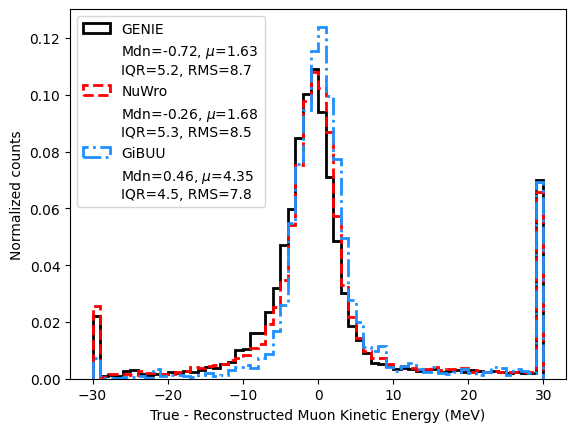

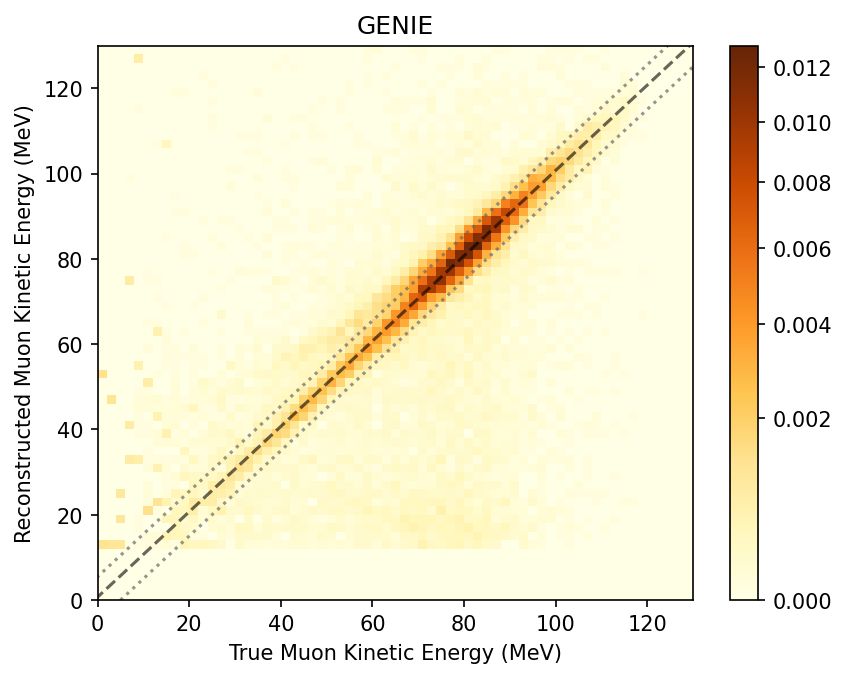

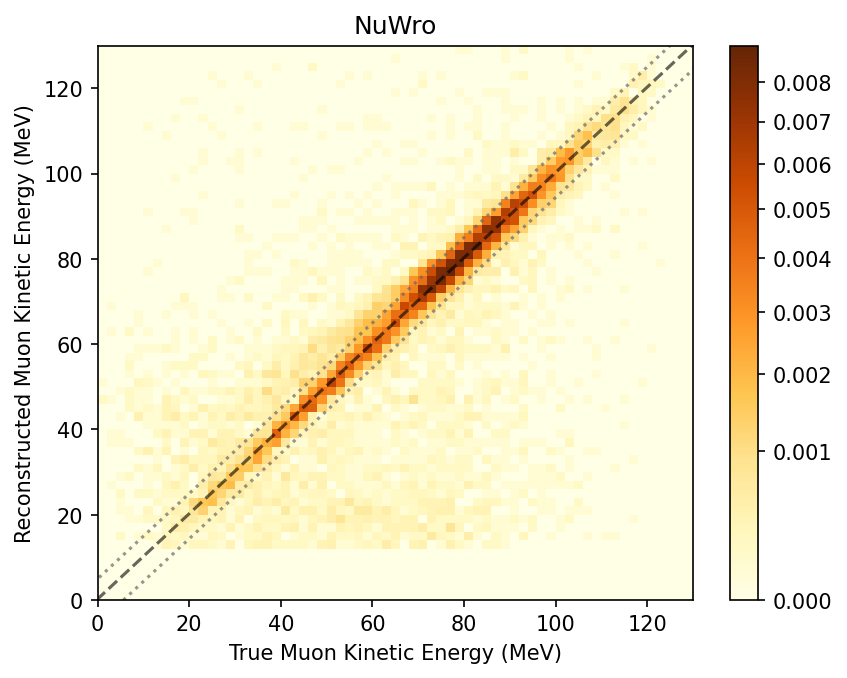

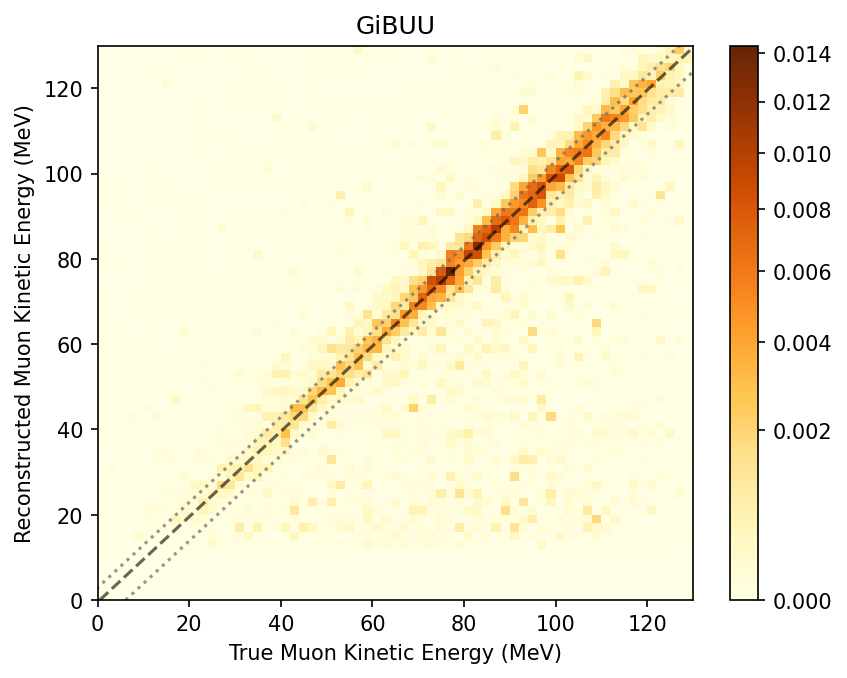

/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_28233/2642220664.py:77: RuntimeWarning: invalid value encountered in divide
  c = plt.pcolormesh(x, y, (dist).T/row_sum,cmap='YlGnBu',vmin=vmin3,vmax=vmax3)


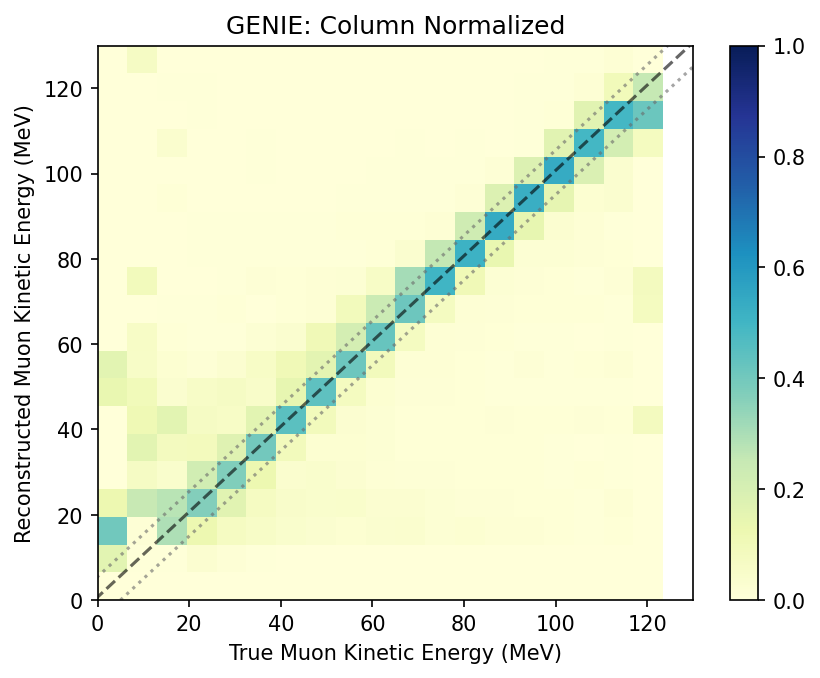

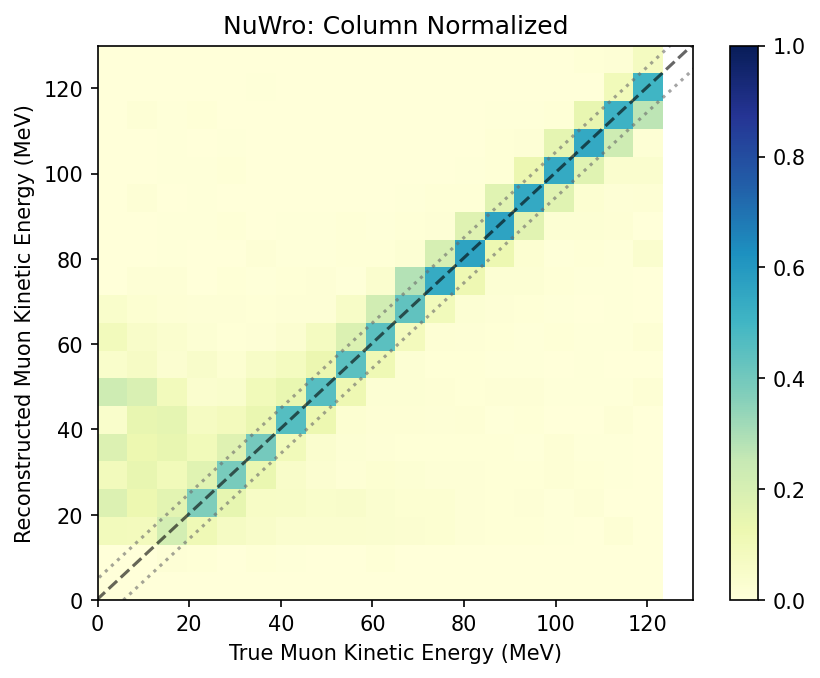

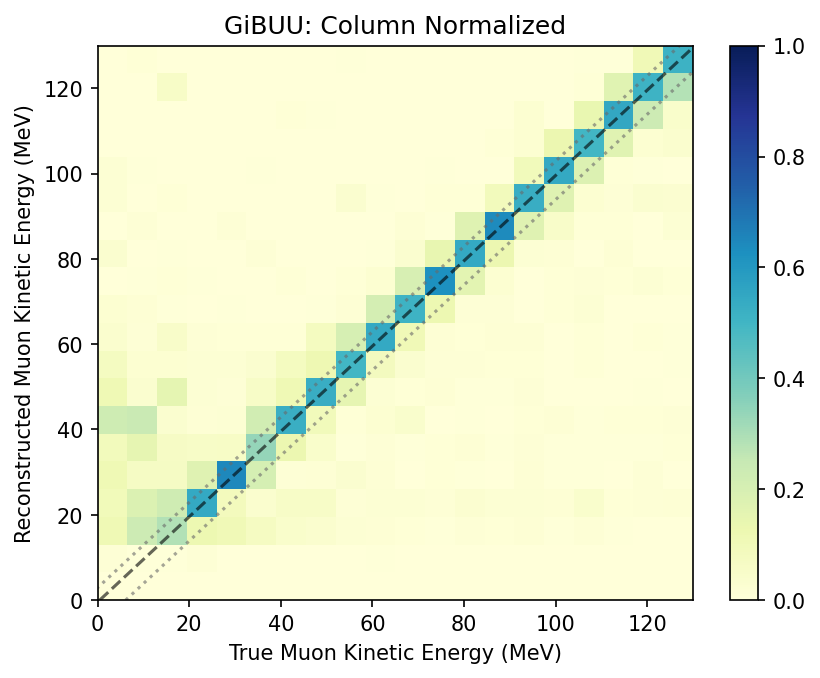

In [79]:
this_query = kdar.presel_query + "and ssm_kine_energy>0 and is_KDAR==1"
plot_res_all([kdar_overlay_df,nuwro_df,gibuu_df],this_query,"truth_Emuon","ssm_kine_energy",
                 -30,30,60,
                 0,130,65,0,130,65,0.6,
                 0,130,20,0,130,20,0,1,
                 axis_label="Muon Kinetic Energy (MeV)",
)


GENIE
mean: 13.756029519253067
median: 0.6089566256324588
std: 102.63297019315166
q1: -11.366150310814078
q3: 21.173875304214846
IQR: 16.270012807514462
FWHM: 12.01584753863058
RMS: 25.781974525890252

NuWro
mean: 16.164627112278488
median: 1.1781273245928503
std: 111.37654900337935
q1: -11.51332151696542
q3: 23.79639128544308
IQR: 17.65485640120425
FWHM: 13.217647394325986
RMS: 28.01806295016519

GiBUU
mean: 16.063952461362515
median: 1.5823387429095135
std: 105.72114592711989
q1: -7.5919717377707485
q3: 18.607140761058275
IQR: 13.099556249414512
FWHM: 10.04818045927901
RMS: 25.06949057979481



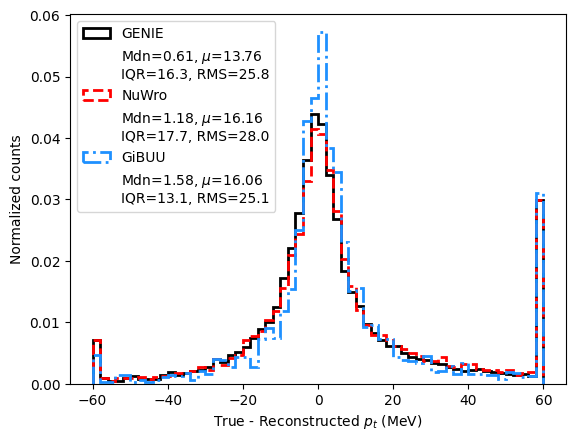

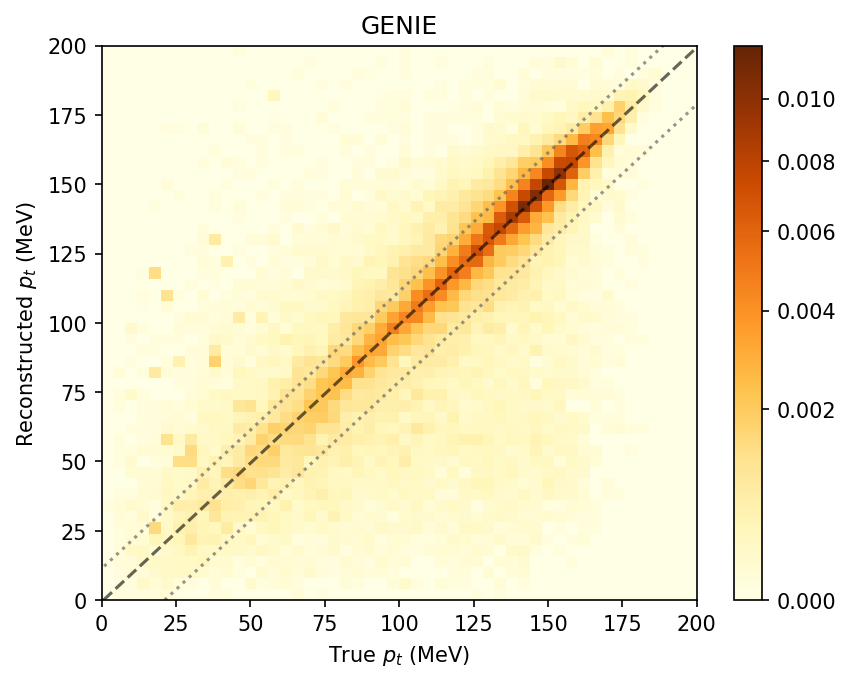

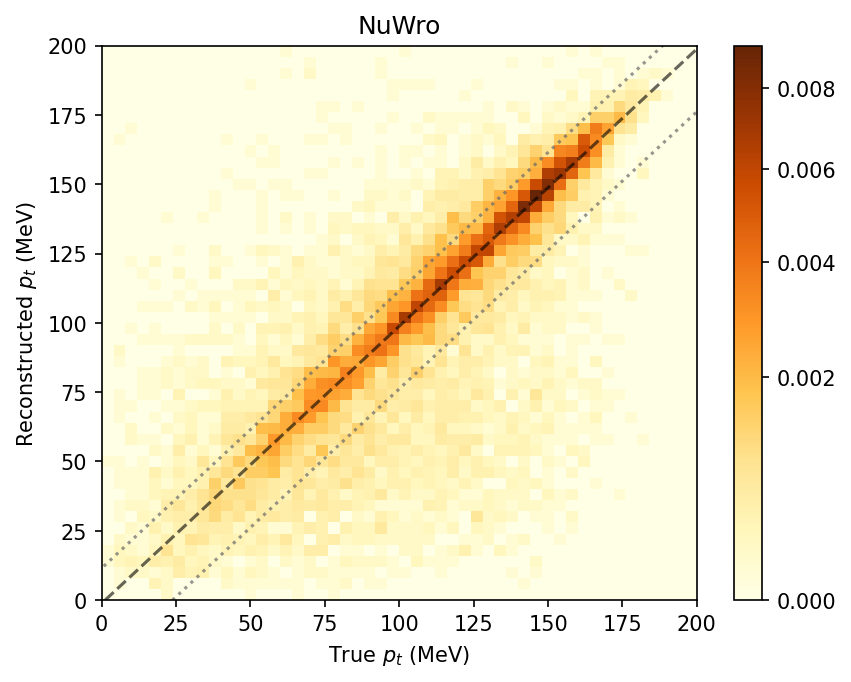

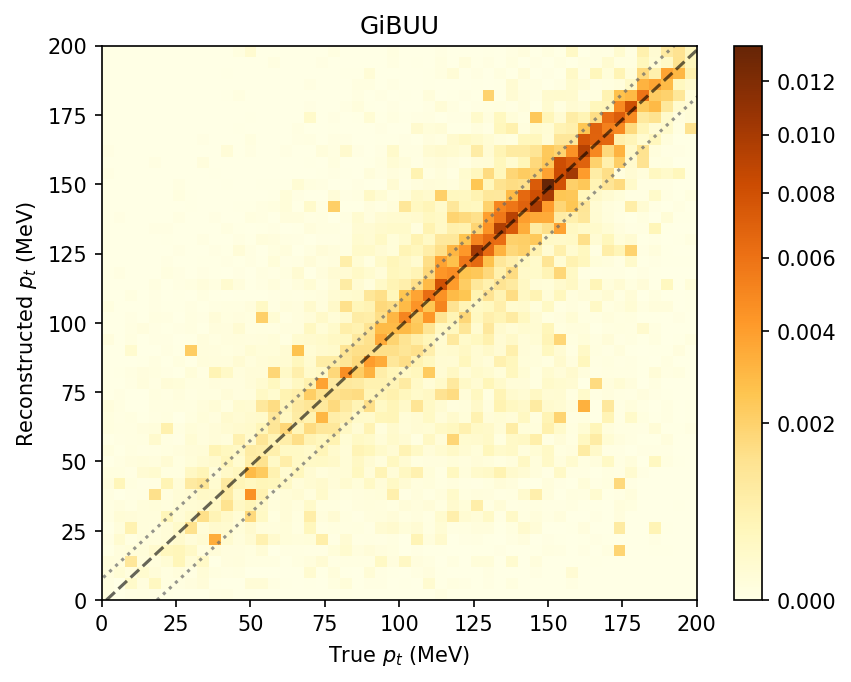

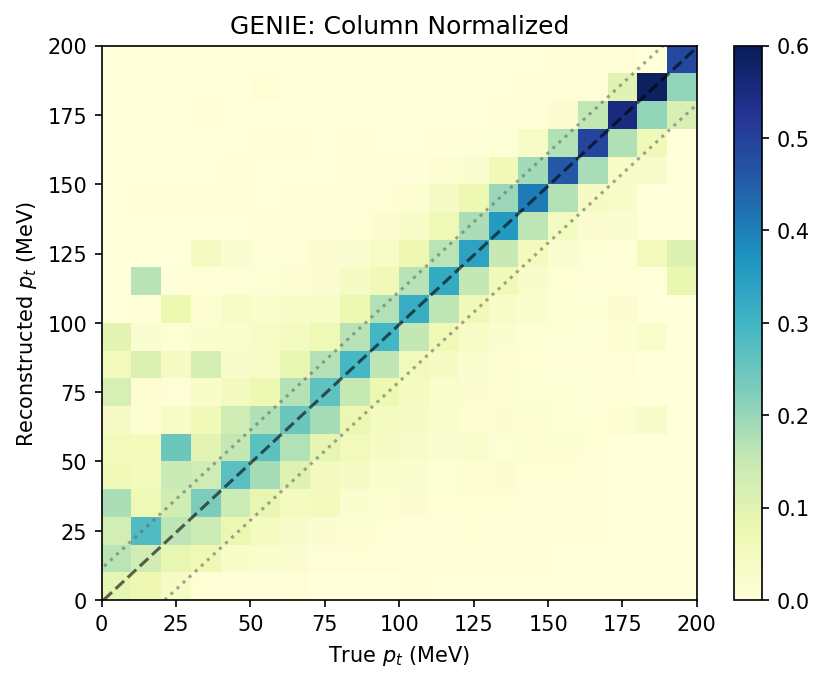

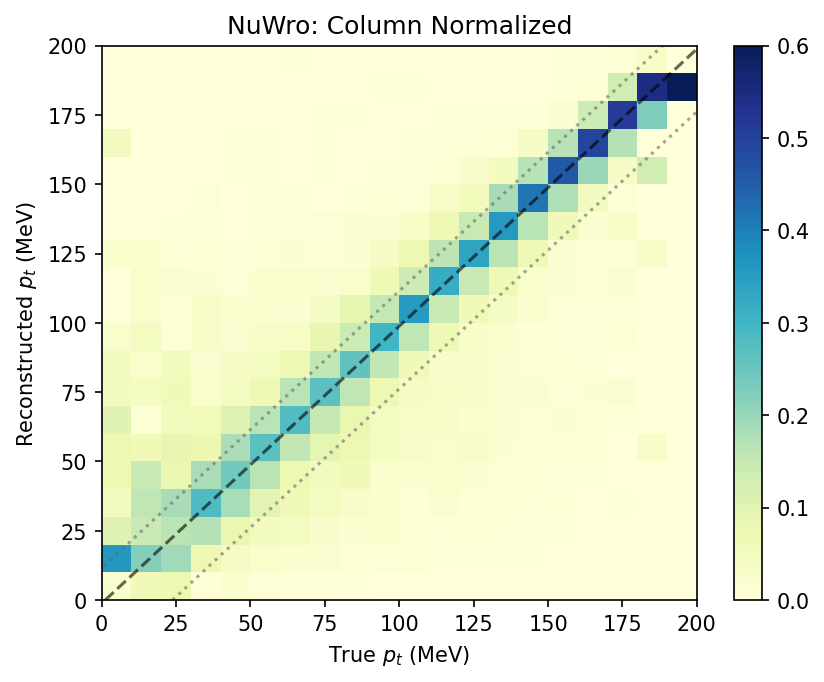

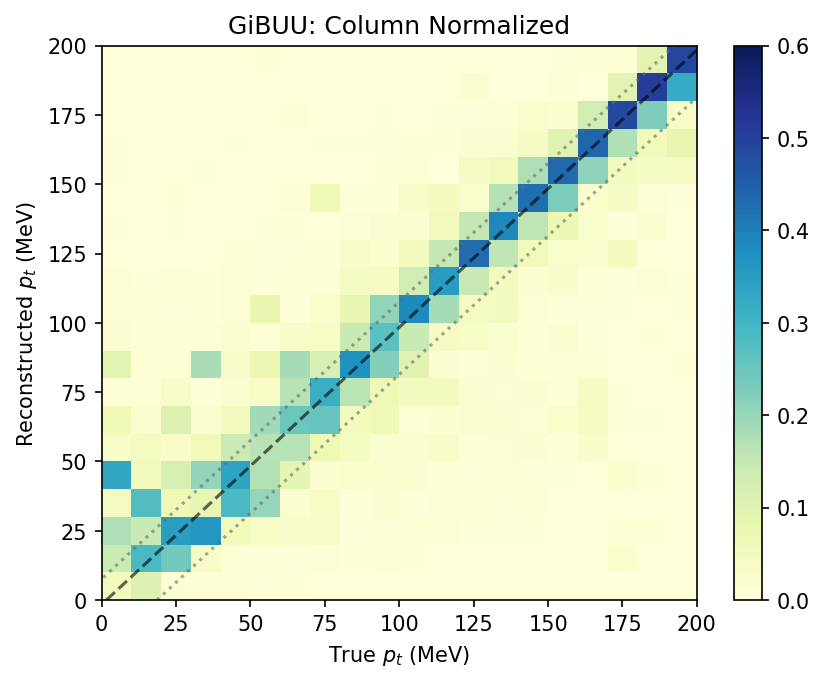

In [50]:
this_query = kdar.presel_query + "and ssm_kine_energy>0 and is_KDAR==1"
plot_res_all([kdar_overlay_df,nuwro_df,gibuu_df],this_query,"true_pt","ssm_pt",
                 -60,60,60,
                 0,200,50,0,200,50,0.6,
                 0,200,20,0,200,20,0,0.6,
                 axis_label=r"$p_t$ (MeV)",
)

GENIE
Using weights
mean: 18.995561506095697
median: 6.342342289606133
std: 119.03927553779624
q1: -18.742094785705504
q3: 49.90244693965497
IQR: 34.32227086268024
FWHM: 26.652956344097408
RMS: 54.110392927302755

NuWro
Using weights
mean: 35.74006436744083
median: 11.07388411594627
std: 137.03251863744396
q1: -12.692952095887705
q3: 89.50317725760598
IQR: 51.098064676746844
FWHM: 45.19936330335566
RMS: 67.19301698266857

GiBUU
Using weights
mean: 22.82471720894778
median: 2.777000194423067
std: 135.79861467521957
q1: -31.58052542120558
q3: 82.1296367025171
IQR: 56.85508106186134
FWHM: 43.99604189801298
RMS: 67.99864847590118



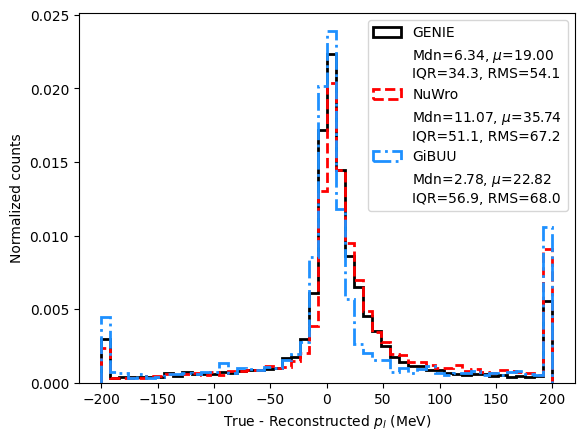

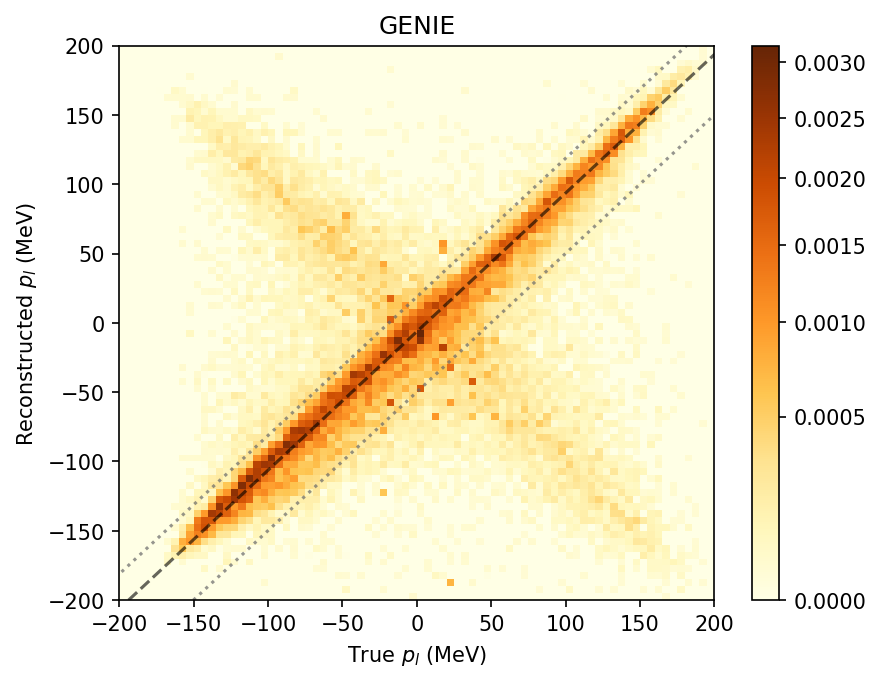

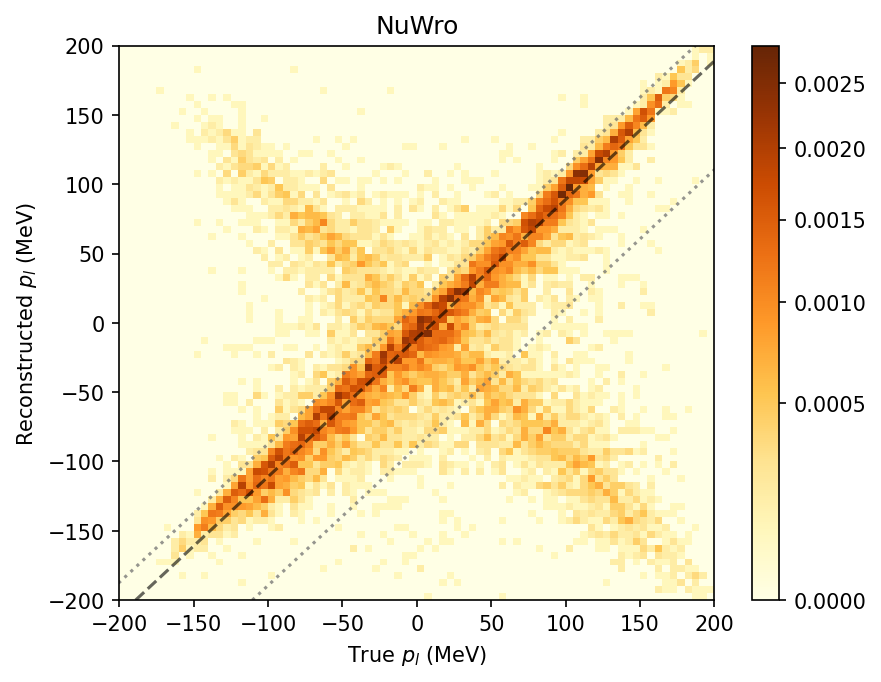

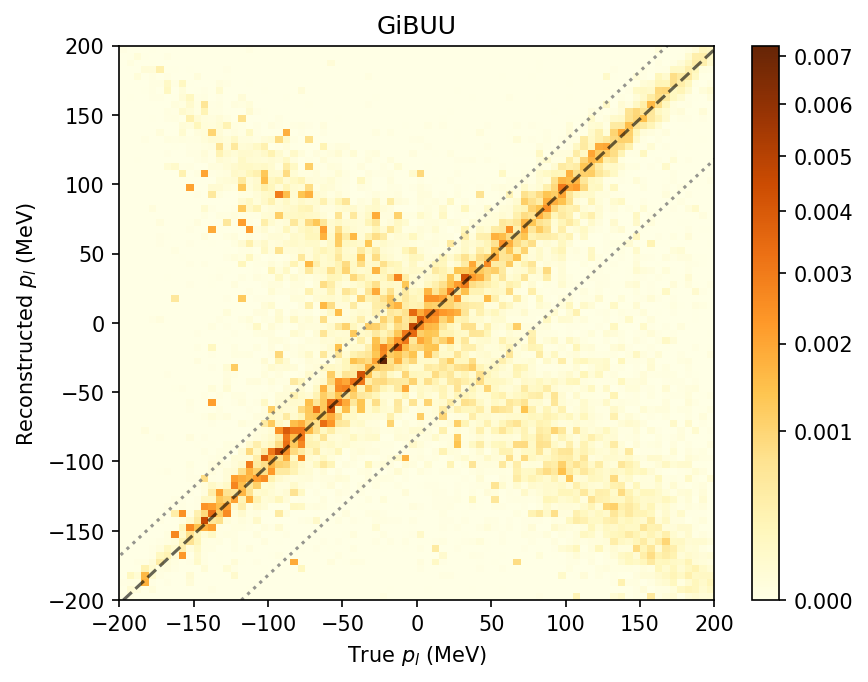

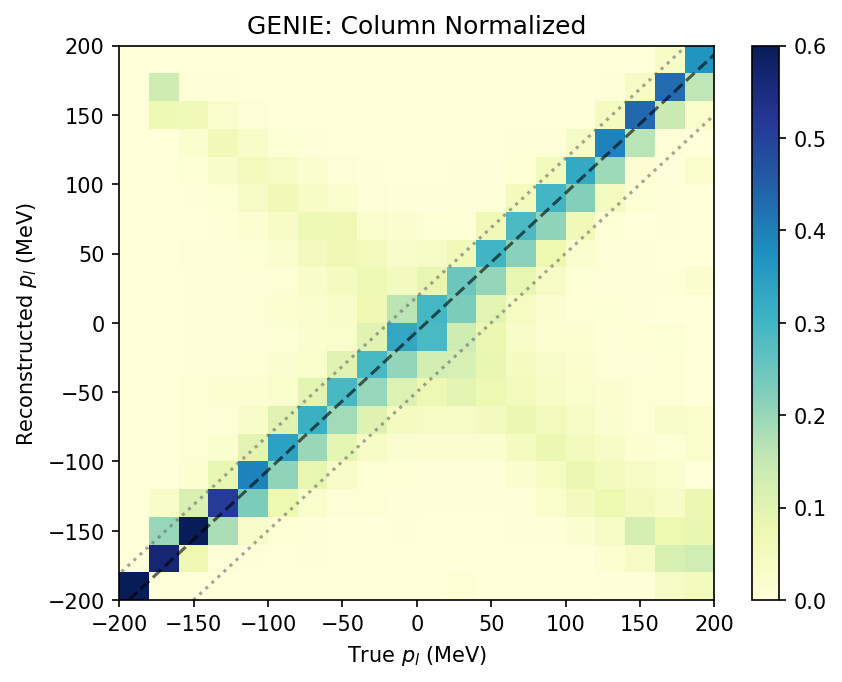

/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_28233/2642220664.py:77: RuntimeWarning: invalid value encountered in divide
  c = plt.pcolormesh(x, y, (dist).T/row_sum,cmap='YlGnBu',vmin=vmin3,vmax=vmax3)


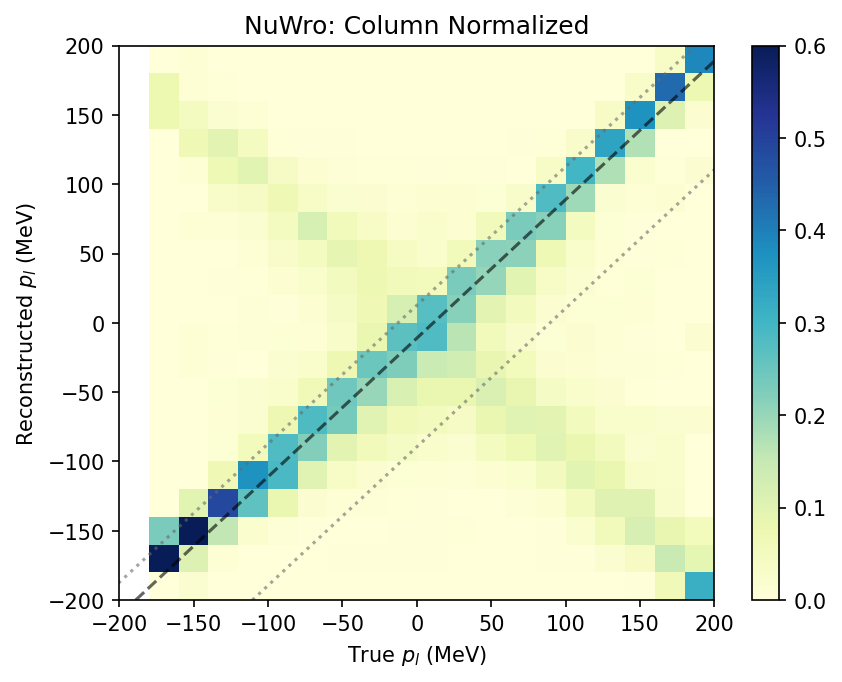

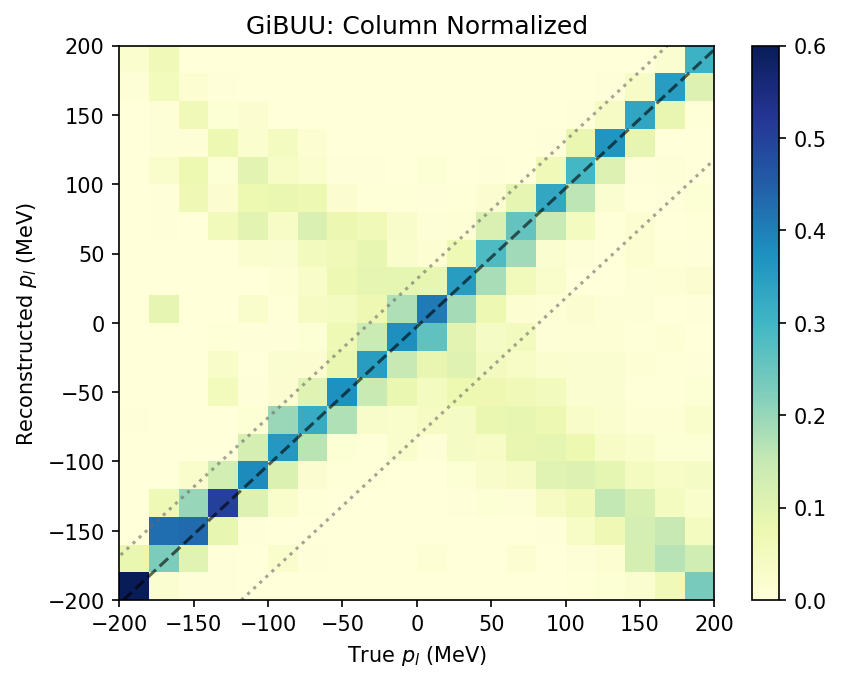

In [80]:
this_query = kdar.presel_query + "and ssm_kine_energy>0 and is_KDAR==1"
plot_res_all([kdar_overlay_df,nuwro_df,gibuu_df],this_query,"true_pl","ssm_pl",
                 -200,200,50,
                 -200,200,80,-200,200,80,0.6,
                 -200,200,20,-200,200,20,0,0.6,
                 axis_label=r"$p_l$ (MeV)",
)

GENIE
mean: 3.8481137828151115
median: -5.197768056238203
std: 144.1474691069175
q1: -40.97544479156258
q3: 22.830177029202645
IQR: 31.902810910382613
FWHM: 23.45316641229455
RMS: 53.431272914873425

NuWro
mean: -7.350061212308778
median: -9.352751947839863
std: 155.38429414482582
q1: -71.3485476811318
q3: 19.57093734983738
IQR: 45.45974251548459
FWHM: 36.99201550658601
RMS: 64.92923265973565

GiBUU
mean: 3.14387203348976
median: -1.2228985987809438
std: 158.8091079936799
q1: -51.98813156328873
q3: 39.630282600159404
IQR: 45.80920708172407
FWHM: 32.68533739465724
RMS: 64.74849378255556



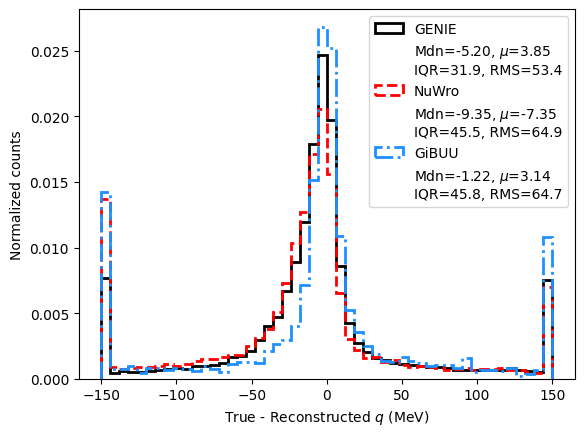

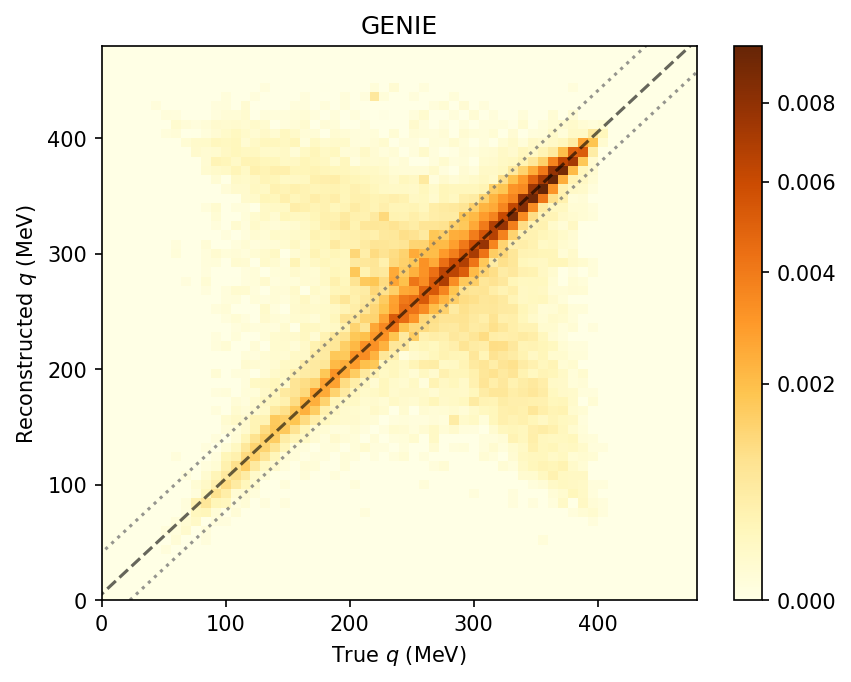

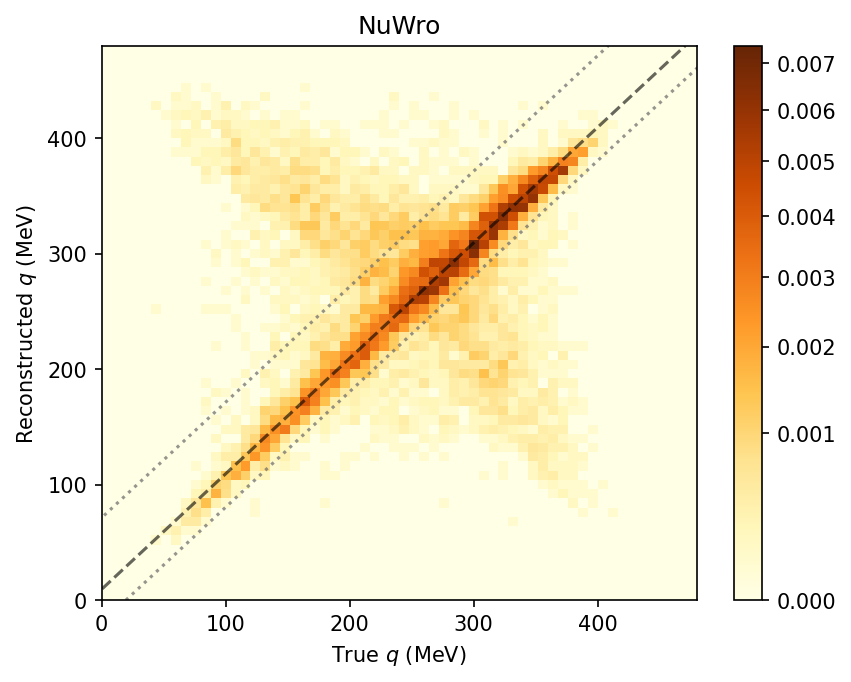

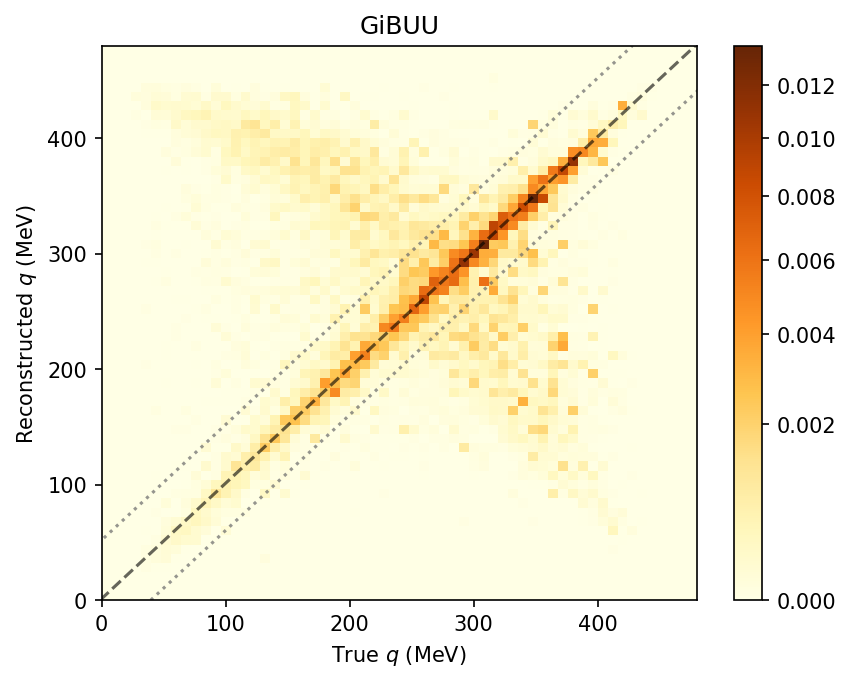

/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_28233/2642220664.py:77: RuntimeWarning: invalid value encountered in divide
  c = plt.pcolormesh(x, y, (dist).T/row_sum,cmap='YlGnBu',vmin=vmin3,vmax=vmax3)


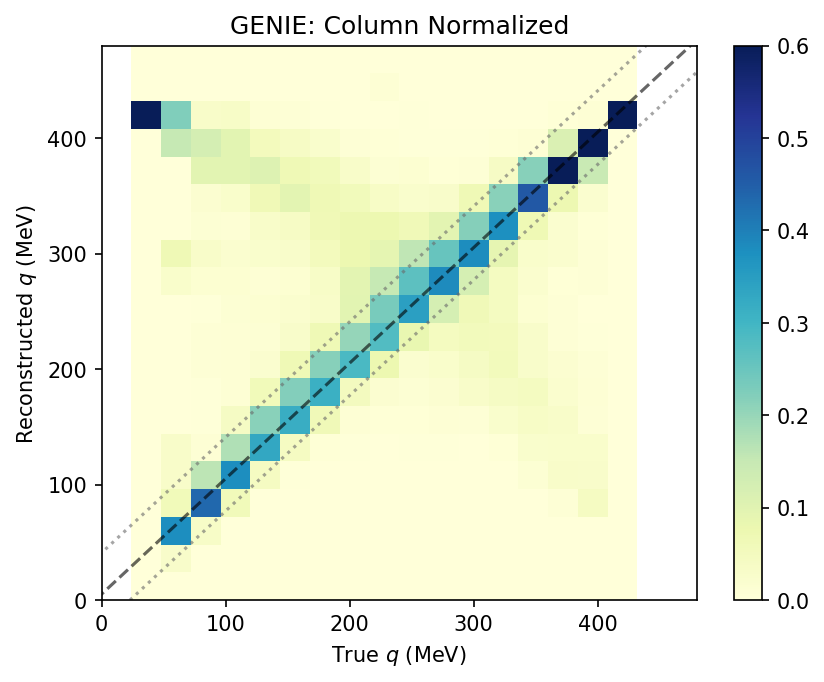

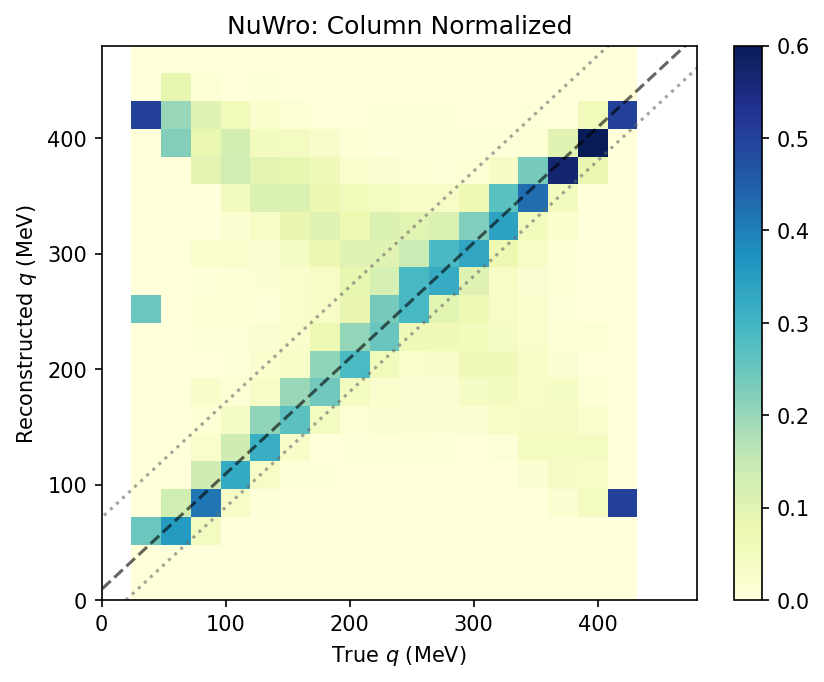

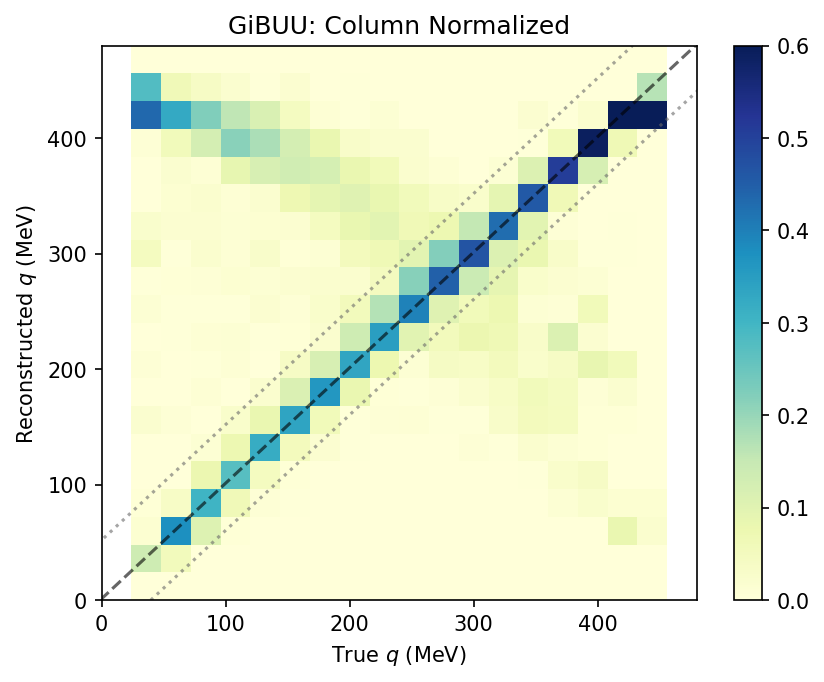

In [57]:
this_query = kdar.presel_query + "and ssm_kine_energy>0 and is_KDAR==1"
plot_res_all([kdar_overlay_df,nuwro_df,gibuu_df],this_query,"true_q","ssm_q",
                 -150,150,50,
                 0,480,60,0,480,60,0.6,
                 0,480,20,0,480,20,0,0.6,
                 axis_label=r"$q$ (MeV)",
)

GENIE
mean: 4.356167499969854
median: -5.427063006745925
std: 145.08629429272597
q1: -42.63356090543812
q3: 27.04289245152148
IQR: 34.8382266784798
FWHM: 25.243506826619093
RMS: 55.58908817704923

NuWro
mean: -7.2108610279093215
median: -9.49170003751641
std: 156.13821063195832
q1: -73.78792250834326
q3: 23.21846384507316
IQR: 48.50319317670821
FWHM: 38.67736602789233
RMS: 67.2363661867414

GiBUU
mean: 4.497662328609789
median: -1.0740454726738449
std: 159.57802891948174
q1: -52.09161370308124
q3: 45.365581611583764
IQR: 48.7285976573325
FWHM: 34.53828387872039
RMS: 66.26269699918679



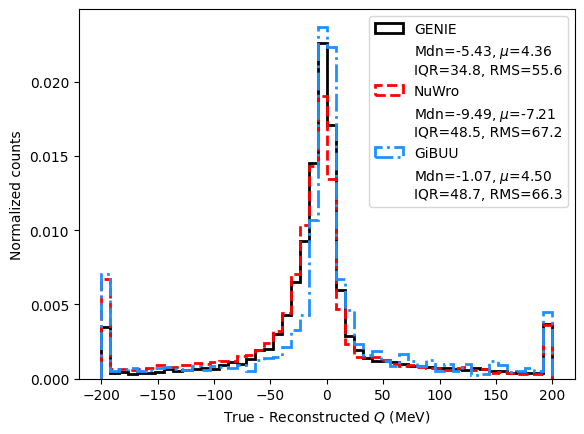

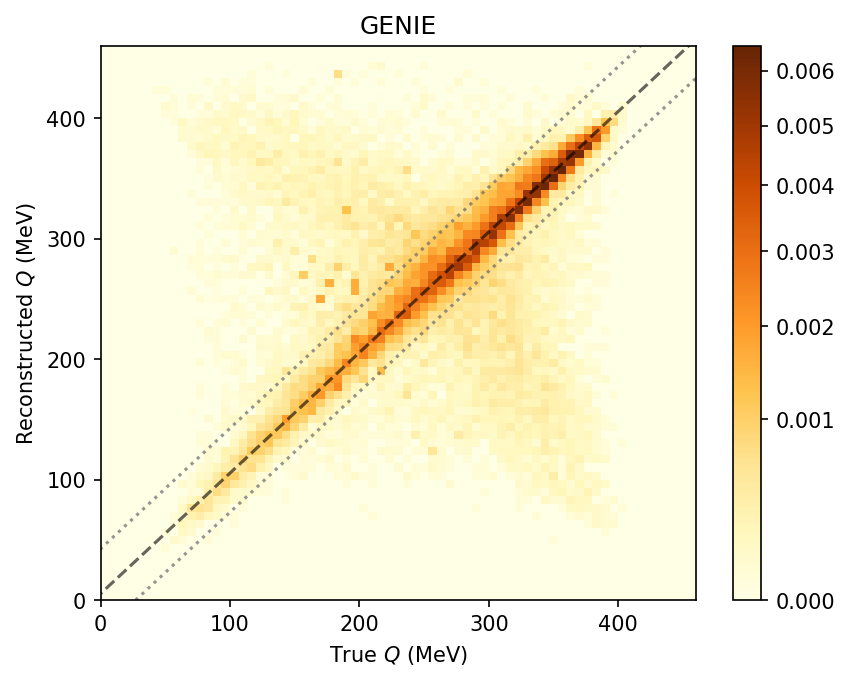

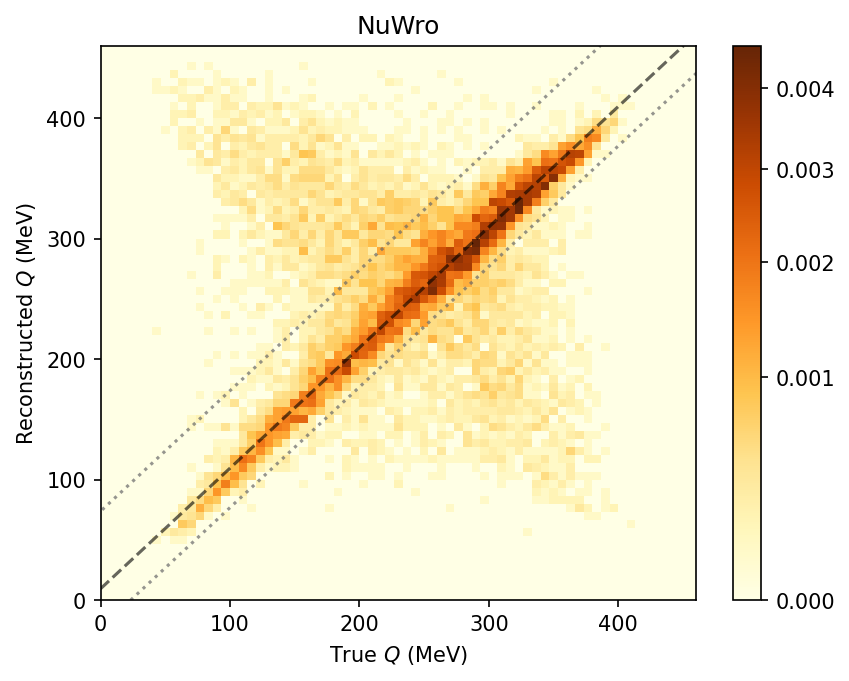

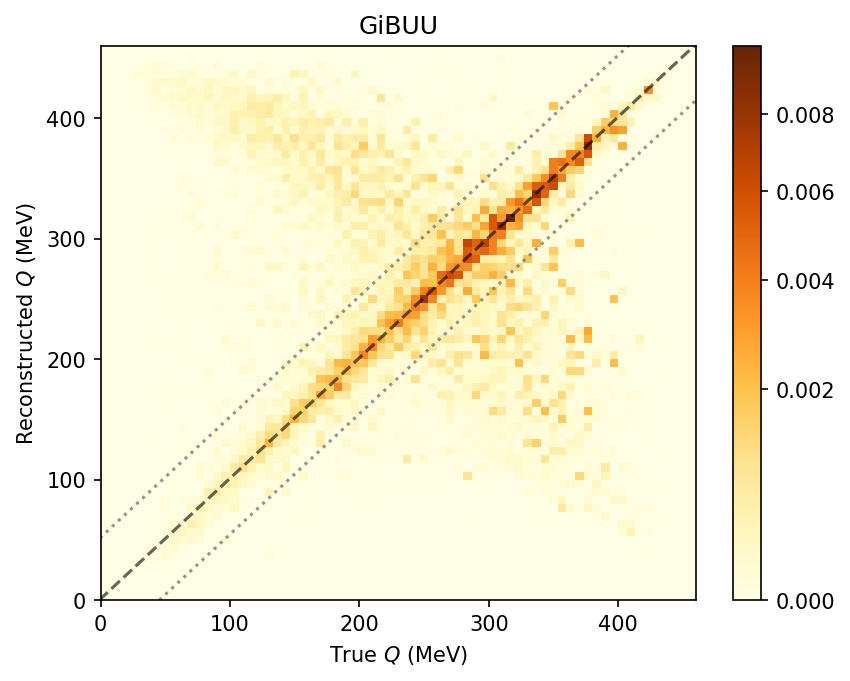

/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_28233/2642220664.py:77: RuntimeWarning: invalid value encountered in divide
  c = plt.pcolormesh(x, y, (dist).T/row_sum,cmap='YlGnBu',vmin=vmin3,vmax=vmax3)


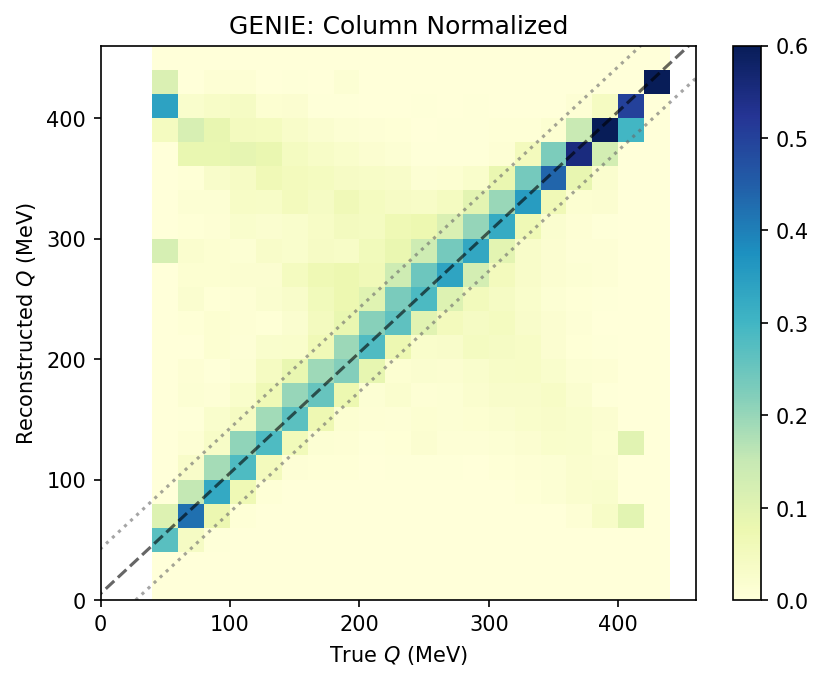

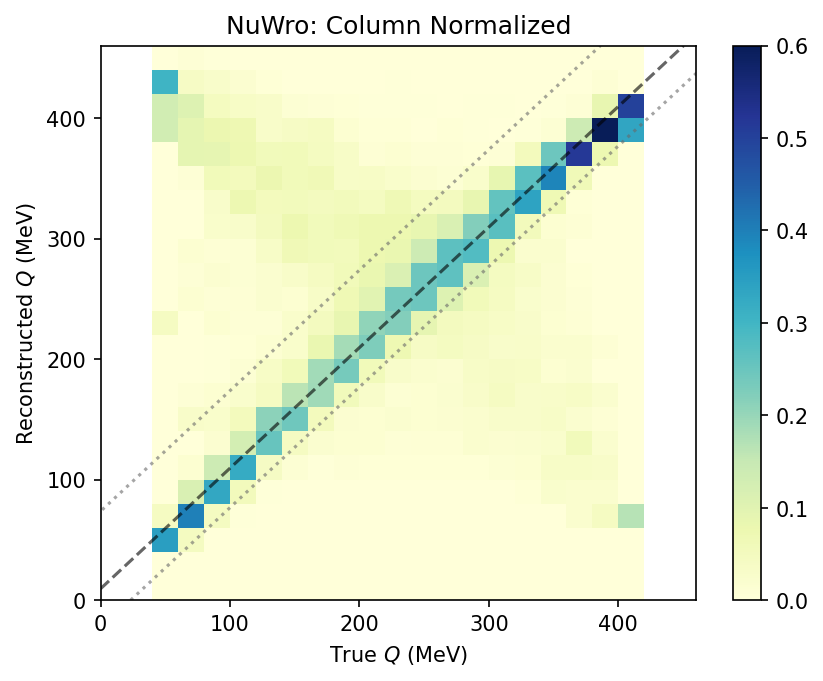

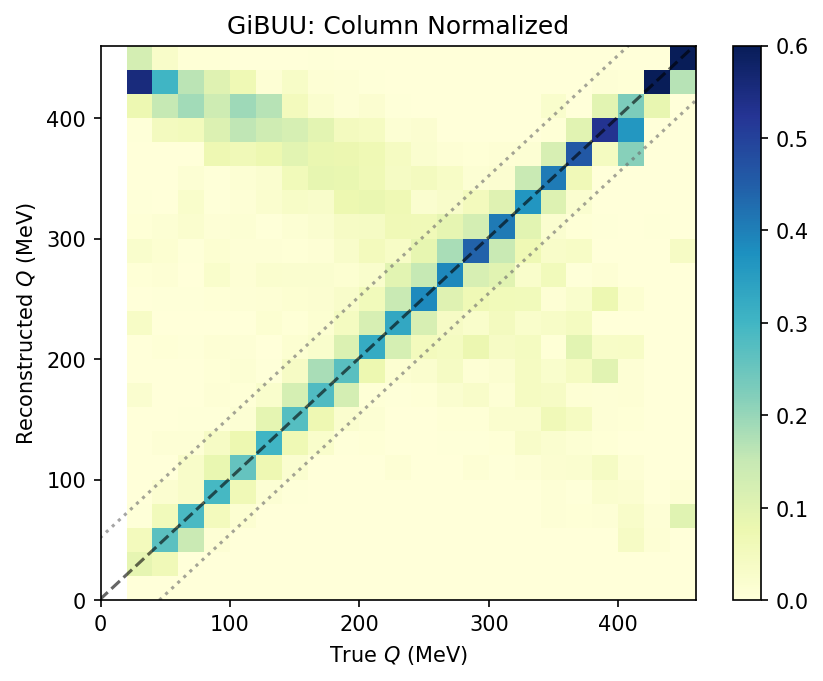

In [59]:
this_query = kdar.presel_query + "and ssm_kine_energy>0 and is_KDAR==1"
plot_res_all([kdar_overlay_df,nuwro_df,gibuu_df],this_query,"true_sqrtQ2","ssm_sqrtQ2",
                 -200,200,50,
                 0,460,69,0,460,69,0.6,
                 0,460,23,0,460,23,0,0.6,
                 axis_label=r"$Q$ (MeV)",
)

GENIE
mean: -4.75219662807884
median: -2.9254631997972496
std: 38.91105387605594
q1: -23.420026135822255
q3: 9.102109833519108
IQR: 16.26106798467068
FWHM: 12.5633000006372
RMS: 22.64278097316908

NuWro
mean: -11.060244672908475
median: -4.968385445883328
std: 45.01731777198277
q1: -43.4572908730407
q3: 6.950023832761161
IQR: 25.20365735290093
FWHM: 22.004766309256812
RMS: 28.481587536597935

GiBUU
mean: -4.620169763889051
median: -1.0709735614024538
std: 42.62876361370107
q1: -30.398155900549263
q3: 13.422281853901211
IQR: 21.910218877225237
FWHM: 16.614794102844485
RMS: 24.89070631429412



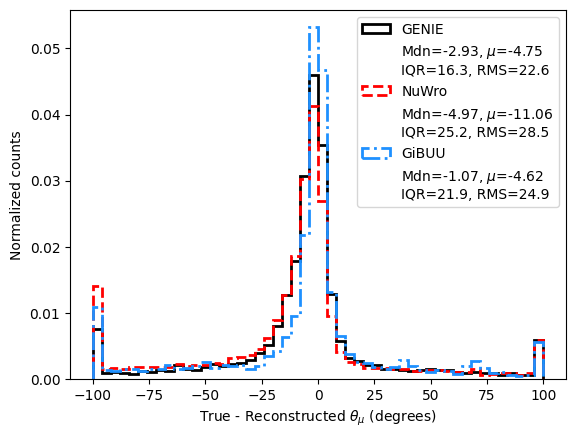

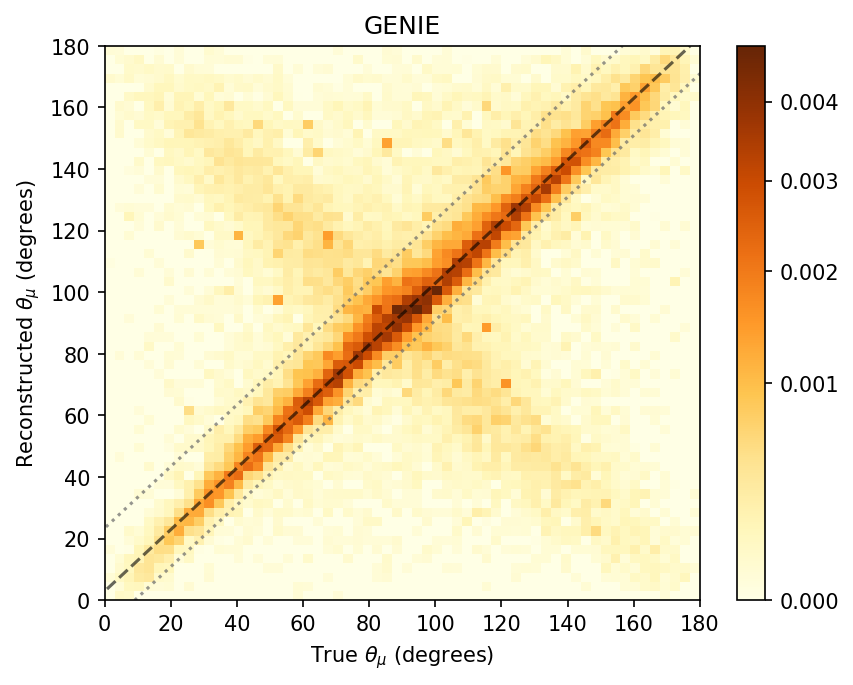

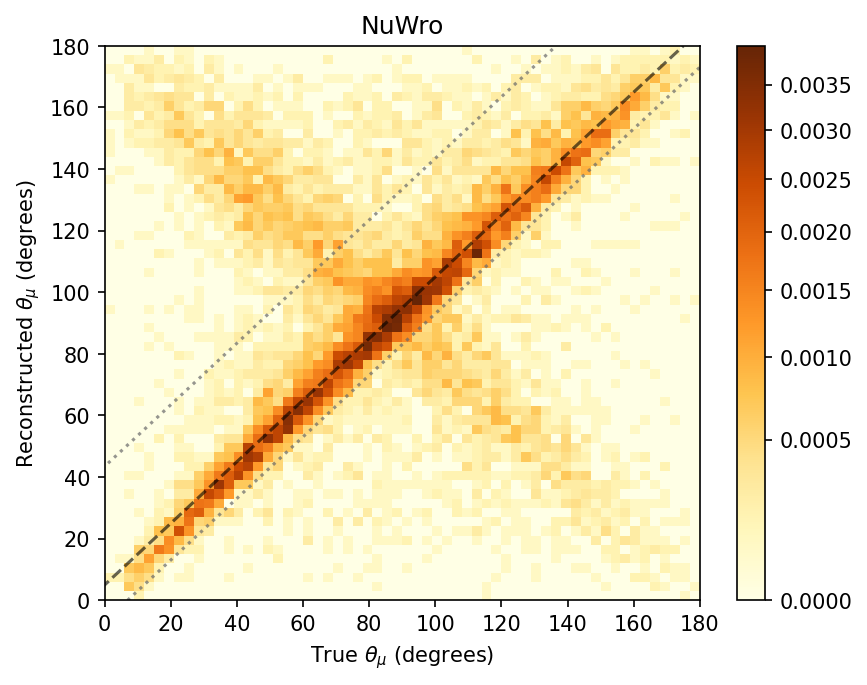

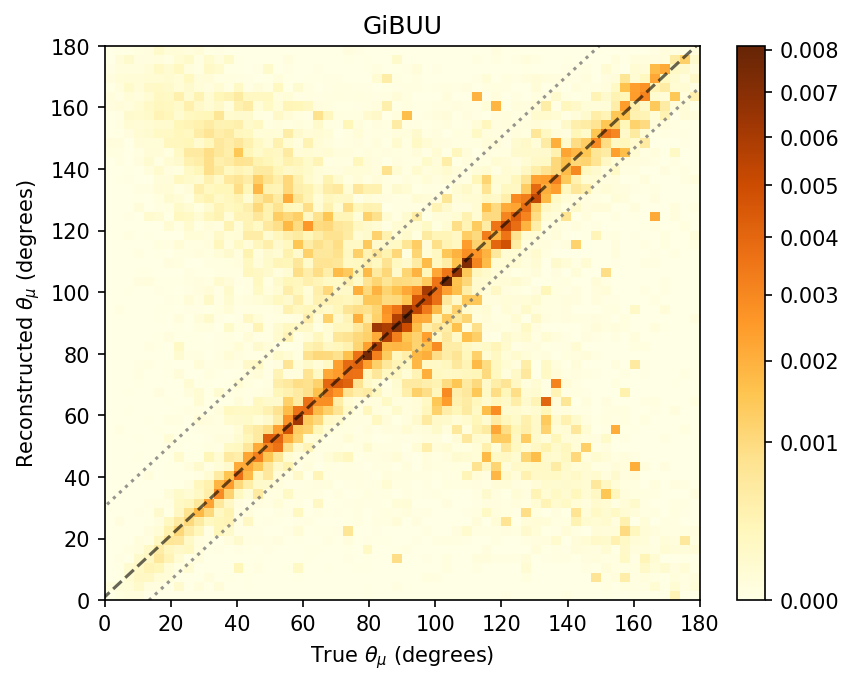

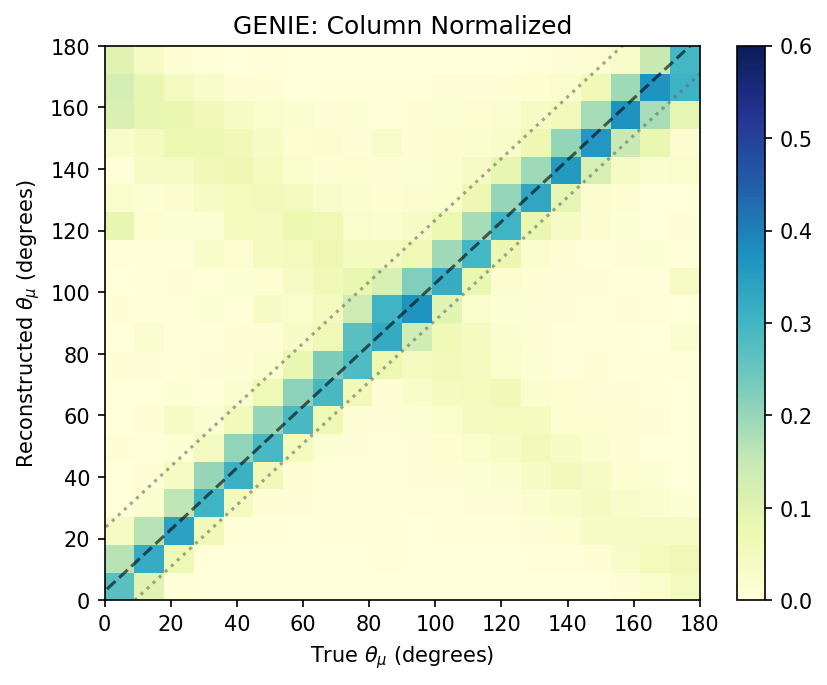

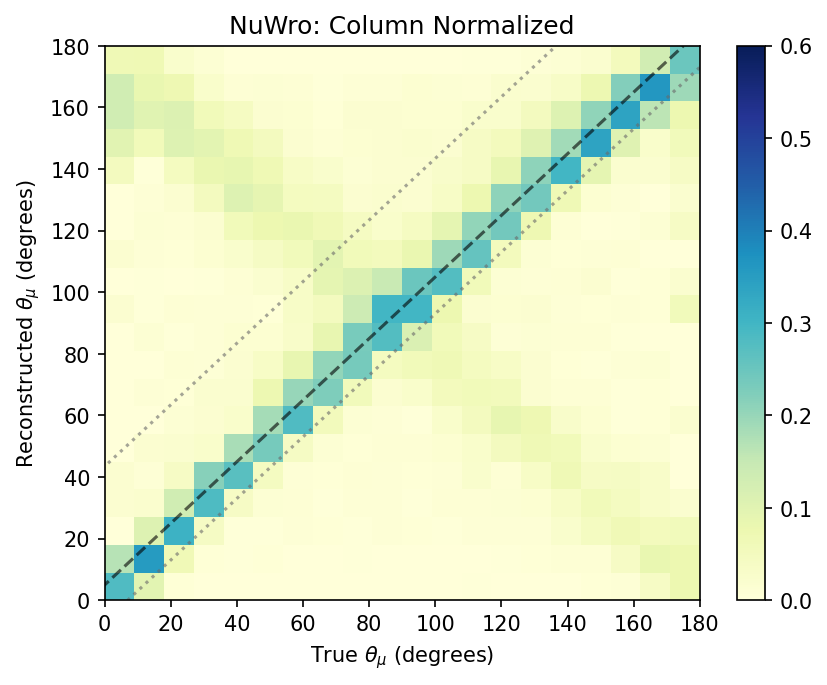

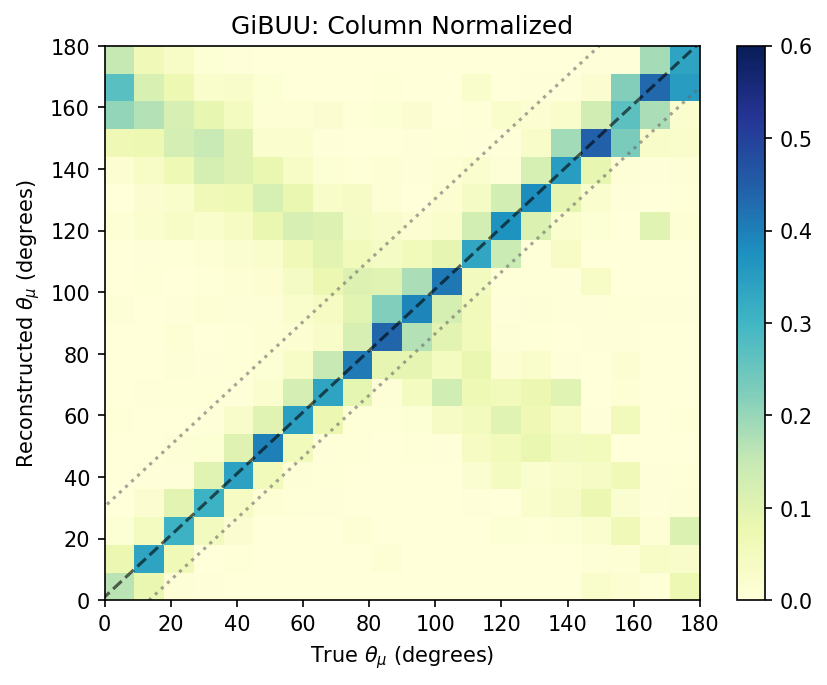

In [63]:
this_query = kdar.presel_query + "and ssm_kine_energy>0 and is_KDAR==1 and ssm_angle_to_absorber_deg>0 and ssm_angle_to_absorber_deg<180"
plot_res_all([kdar_overlay_df,nuwro_df,gibuu_df],this_query,"true_angle_deg","ssm_angle_to_absorber_deg",
                 -100,100,50,
                 0,180,60,0,180,60,0.6,
                 0,180,20,0,180,20,0,0.6,
                 axis_label=r"$\theta_\mu$ (degrees)",
)

GENIE
mean: 4.483598035750237
median: 5.9661143569946375
std: 22.20989283186419
q1: -9.963294193267817
q3: 19.979675128936776
IQR: 14.971484661102297
FWHM: 11.163048972384953
RMS: 15.64050751708242

NuWro
mean: 3.1377429200222706
median: 5.370124176025399
std: 26.107078331771564
q1: -14.203544303894034
q3: 22.622100189208993
IQR: 18.412822246551514
FWHM: 13.35571121059536
RMS: 18.22508095495589

GiBUU
mean: -2.264766284394353
median: 4.192039325714116
std: 24.66321583193874
q1: -18.63659875106811
q3: 14.348090961456307
IQR: 16.492344856262207
FWHM: 11.760001352535399
RMS: 16.461202708457638



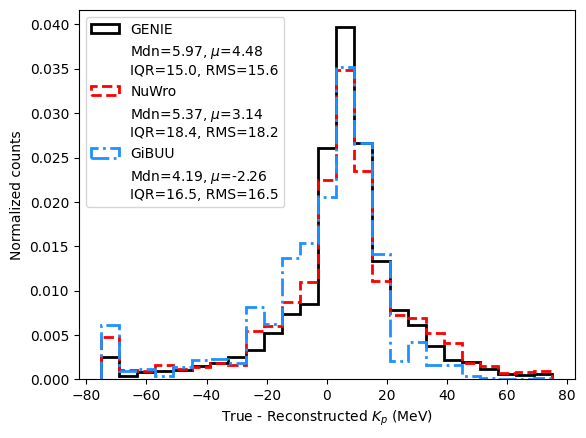

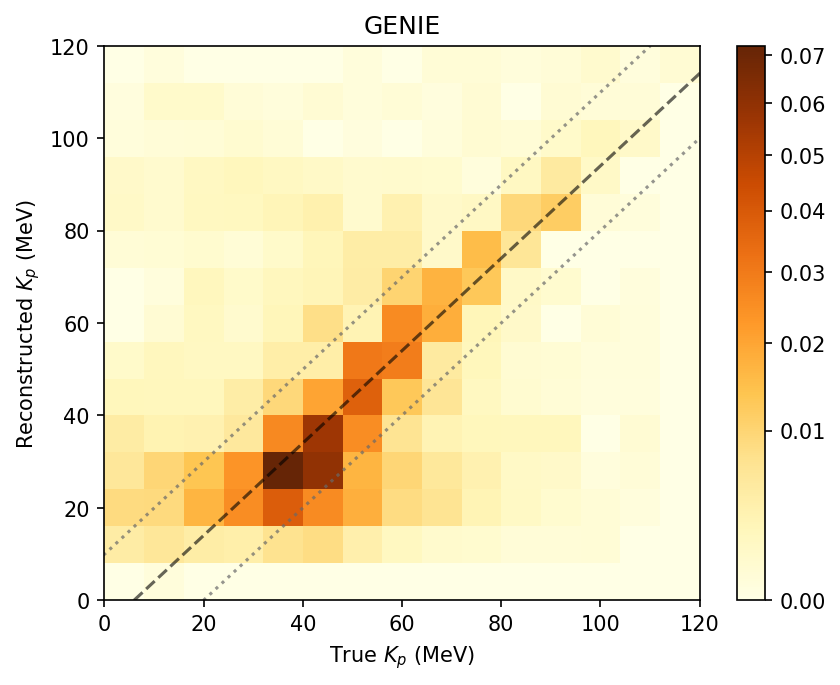

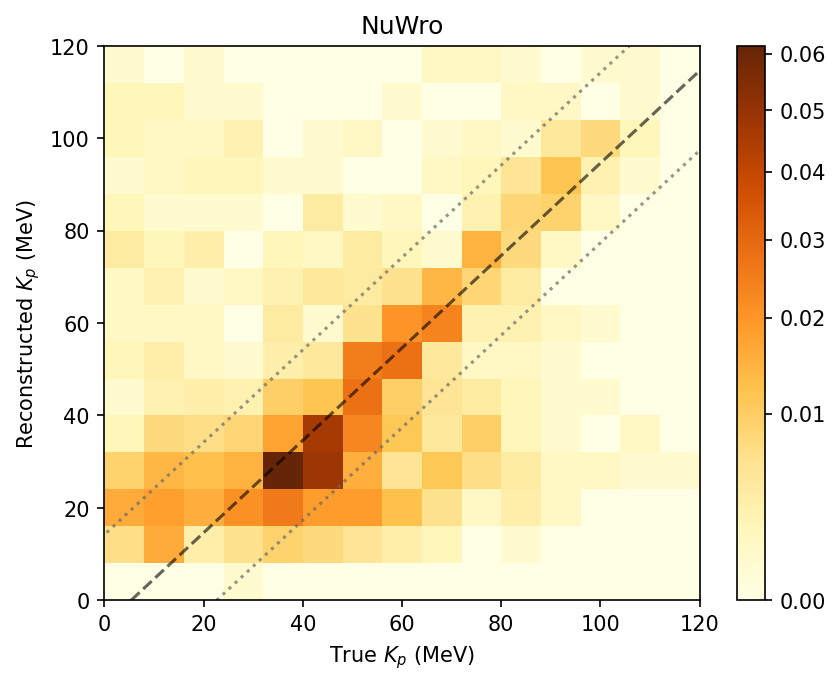

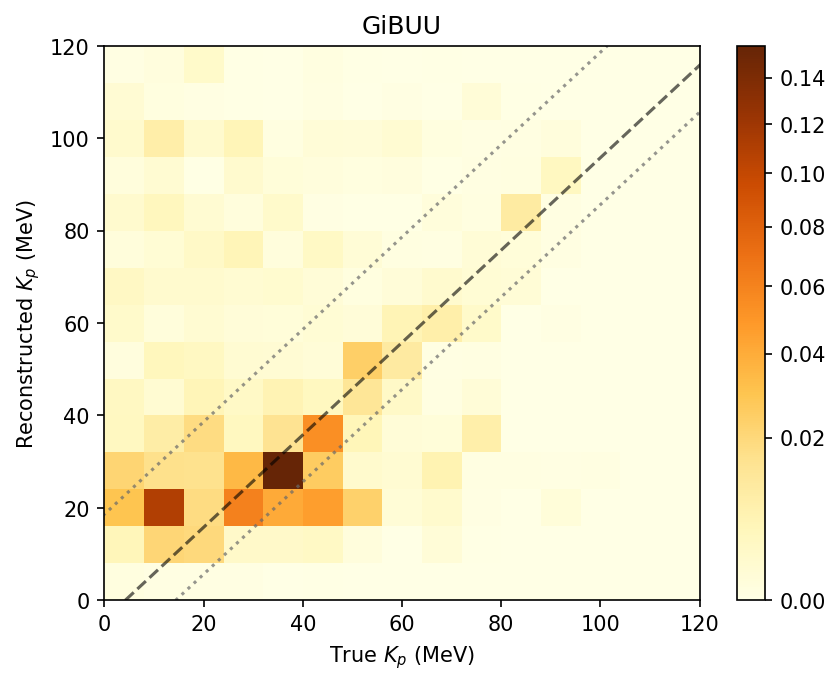

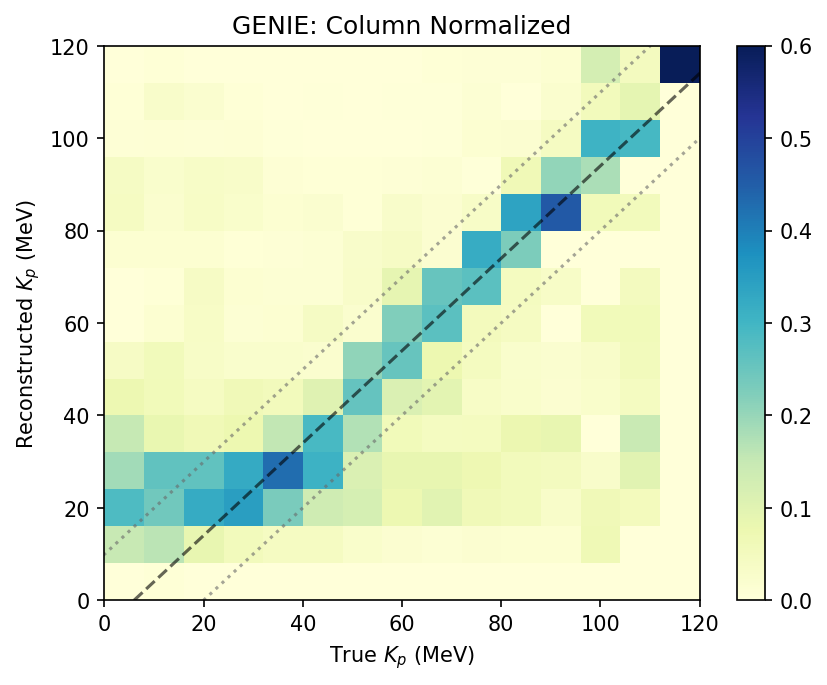

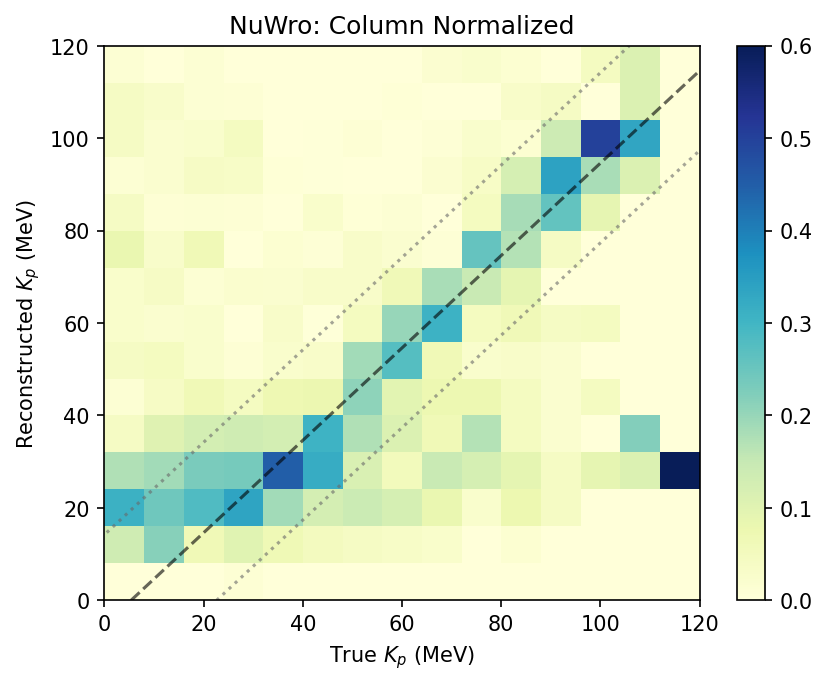

/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_28233/2642220664.py:77: RuntimeWarning: invalid value encountered in divide
  c = plt.pcolormesh(x, y, (dist).T/row_sum,cmap='YlGnBu',vmin=vmin3,vmax=vmax3)


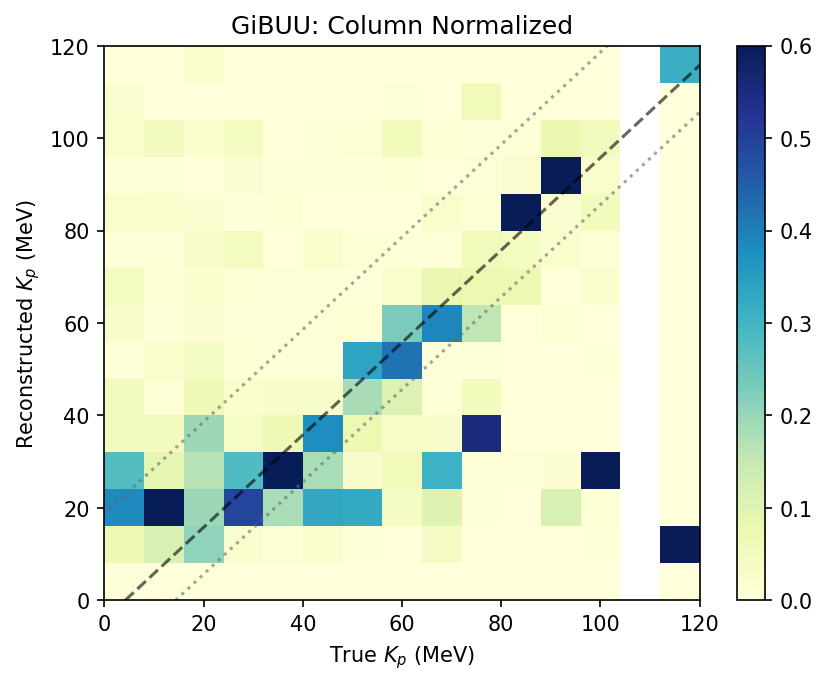

In [66]:
this_query = kdar.presel_query + "and ssm_kine_energy>0 and is_KDAR==1 and truth_prim_p_energy>0 and ssm_prim_track1_kine_energy_range>0"
plot_res_all([kdar_overlay_df,nuwro_df,gibuu_df],this_query,"truth_prim_p_energy","ssm_prim_track1_kine_energy_range",
                 -75,75,25,
                 0,120,15,0,120,15,0.6,
                 0,120,15,0,120,15,0,0.6,
                 axis_label=r"$K_p$ (MeV)",
)

GENIE
mean: 18.713854161420752
median: 18.415566757202157
std: 20.979646394860335
q1: 2.660367801666265
q3: 36.24654848861695
IQR: 16.793090343475342
FWHM: 18.172024062950463
RMS: 22.755656306994936

NuWro
mean: 19.255658302945783
median: 18.489491775512704
std: 23.7881282369341
q1: 1.6535352020263758
q3: 40.10372383880616
IQR: 19.225094318389893
FWHM: 20.06889910037151
RMS: 24.48661652440246

GiBUU
mean: 13.74197046510411
median: 16.298769309997567
std: 21.852772706039655
q1: 1.3910373001098684
q3: 32.6226499824524
IQR: 15.615806341171266
FWHM: 16.326146794696374
RMS: 20.71399929886261



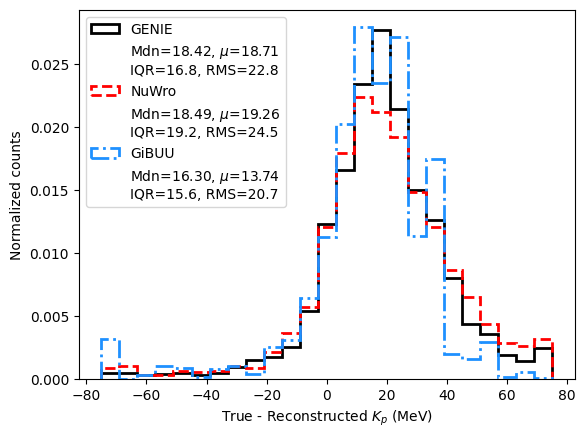

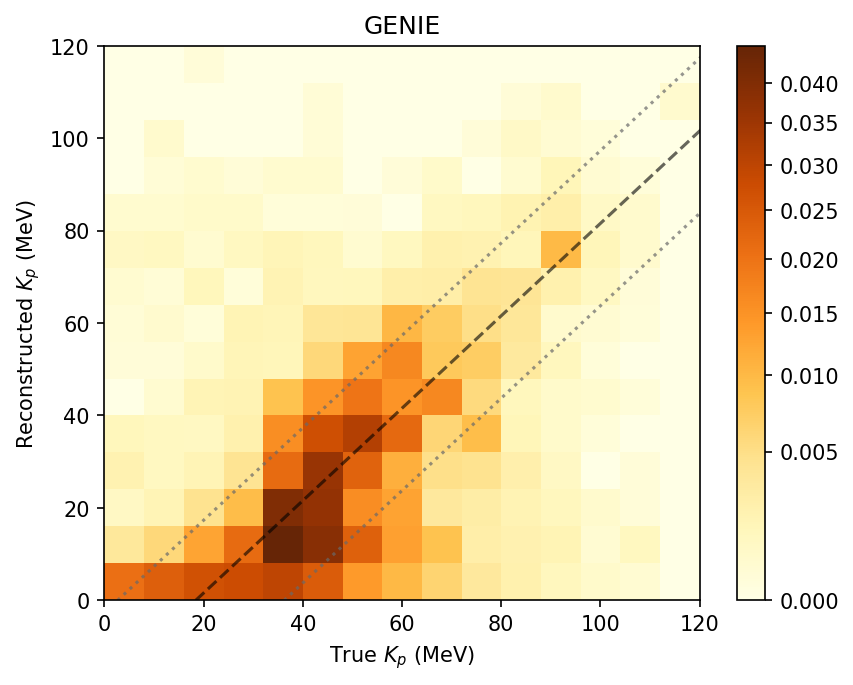

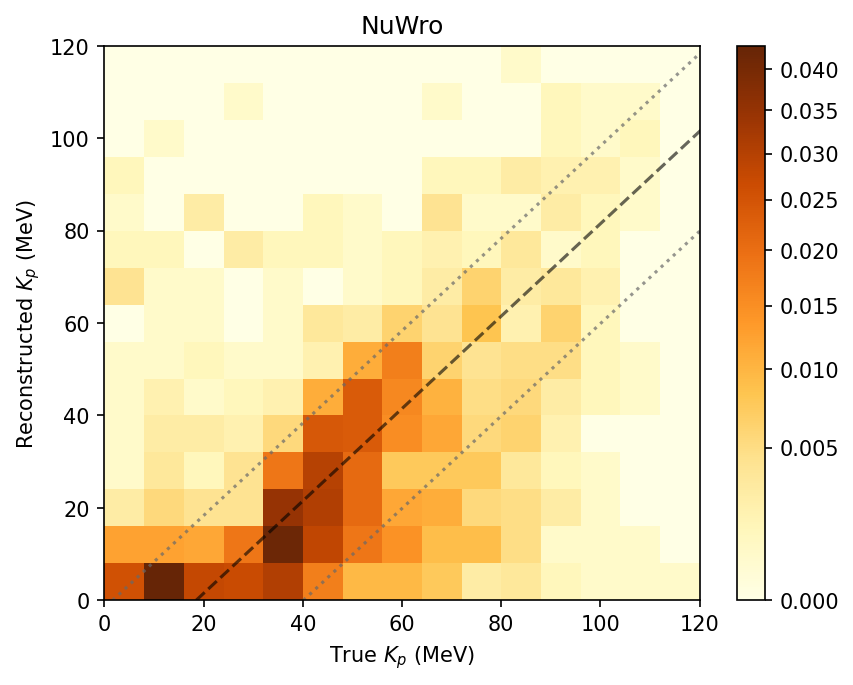

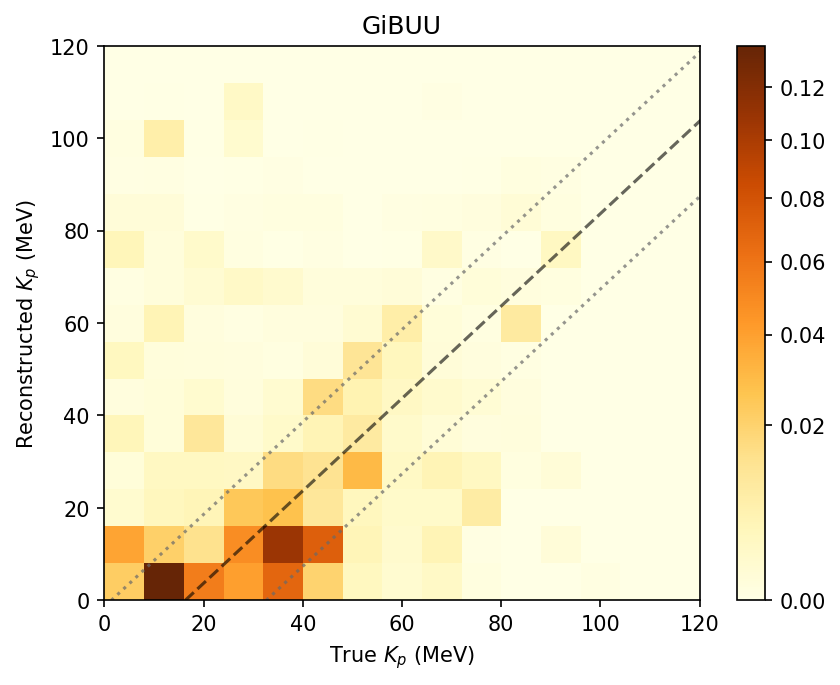

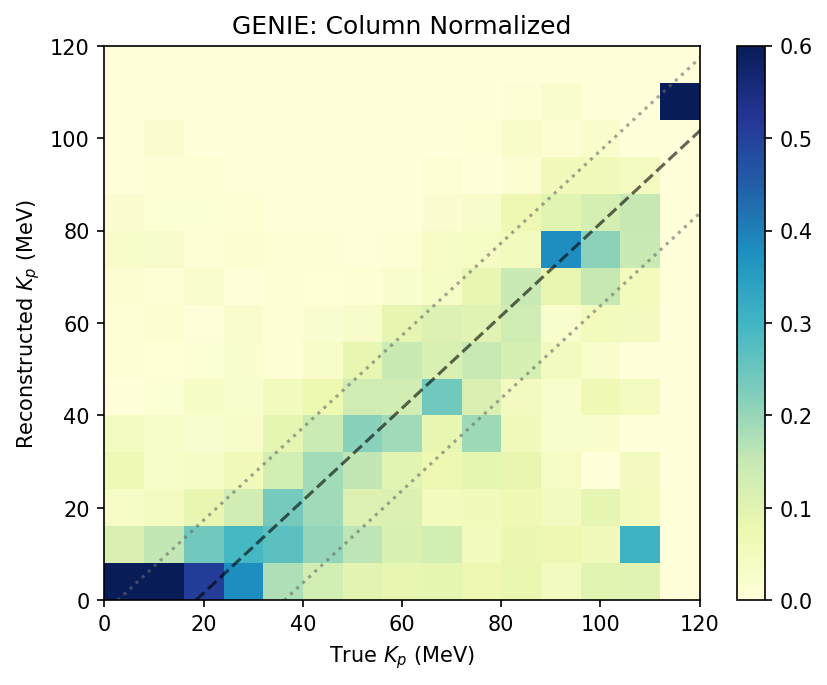

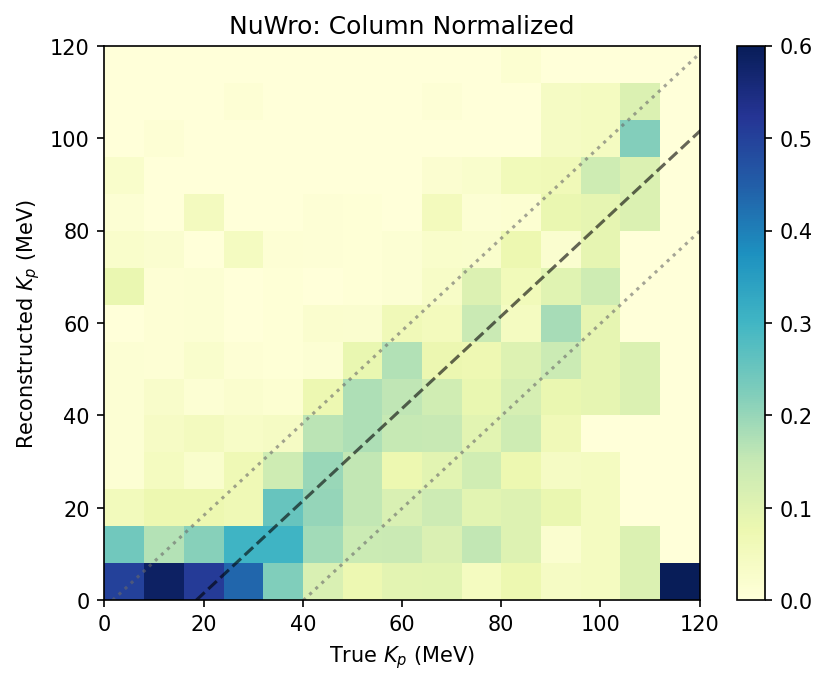

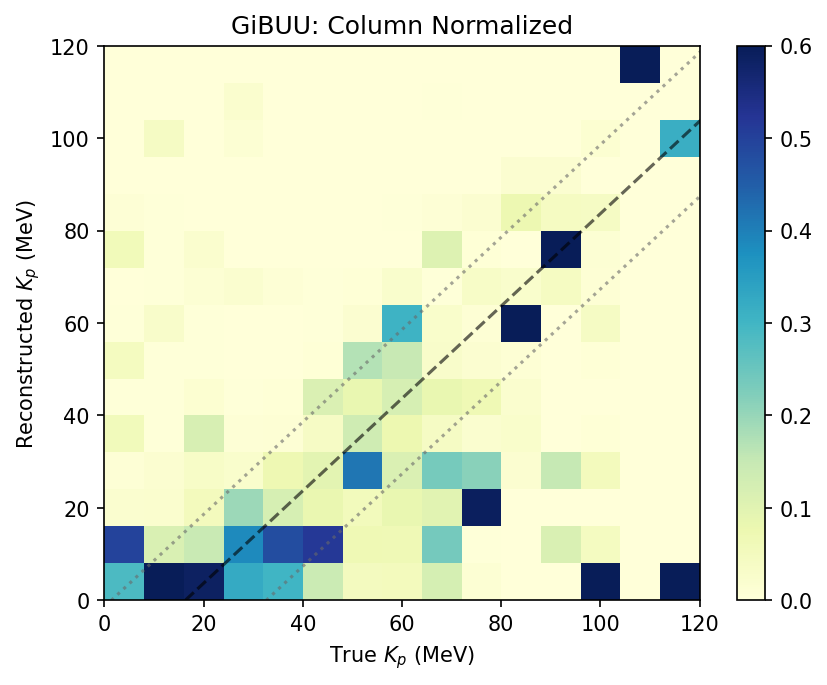

In [67]:
this_query = kdar.presel_query + "and ssm_kine_energy>0 and is_KDAR==1 and truth_prim_p_energy>0 and ssm_prim_track1_kine_energy_range>0"
plot_res_all([kdar_overlay_df,nuwro_df,gibuu_df],this_query,"truth_prim_p_energy","ssm_prim_track1_kine_energy_cal",
                 -75,75,25,
                 0,120,15,0,120,15,0.6,
                 0,120,15,0,120,15,0,0.6,
                 axis_label=r"$K_p$ (MeV)",
)


GENIE
mean: -20.365762002030042
median: -5.059271774290622
std: 46.65767506714137
q1: -72.15903786142388
q3: 7.264423258511172
IQR: 39.71173055996753
FWHM: 36.26188974103943
RMS: 32.726080140453995

NuWro
mean: -34.59761698675766
median: -11.516589832026684
std: 49.487450065217594
q1: -94.80771704872376
q3: 2.860300977489814
IQR: 48.83400901310679
FWHM: 47.4254270768137
RMS: 41.18523172095599

GiBUU
mean: -22.27843669911418
median: -8.174499740528447
std: 49.49257386426768
q1: -75.5034007876505
q3: 9.096134182842192
IQR: 42.29976748524635
FWHM: 38.02467352776633
RMS: 37.3749792064901



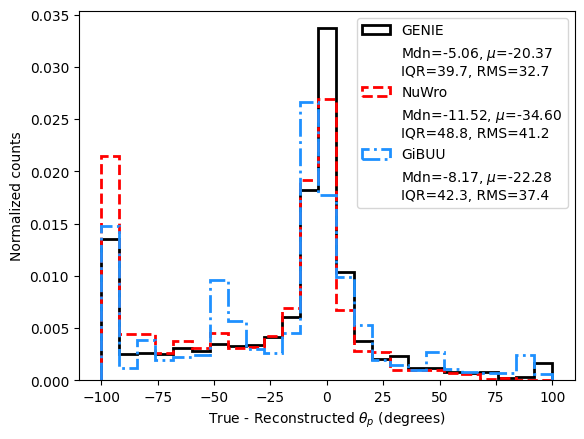

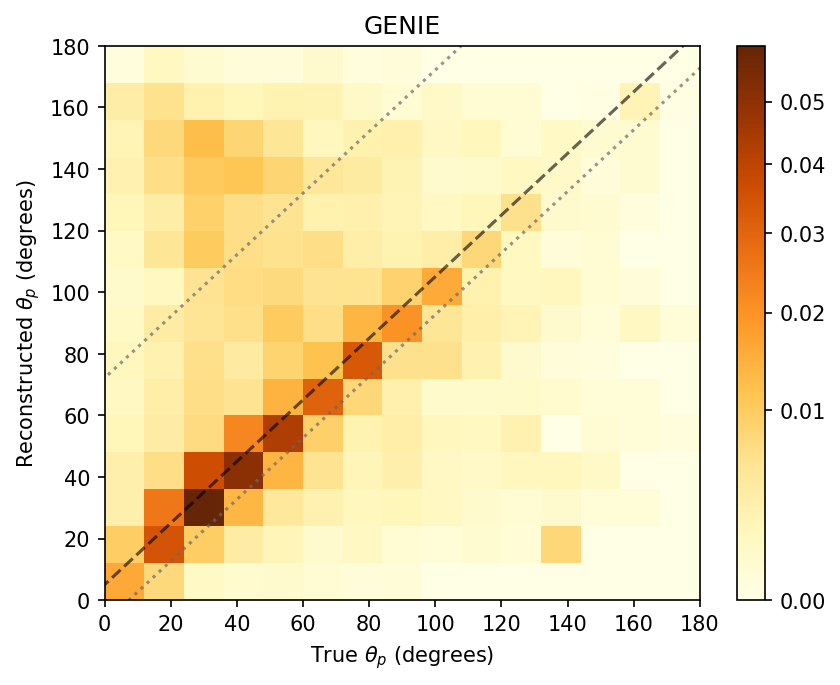

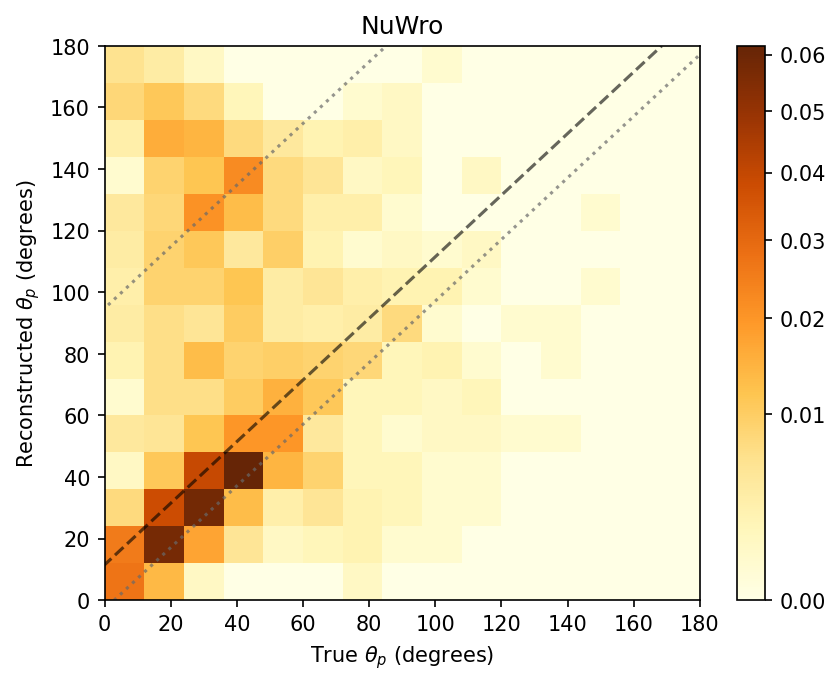

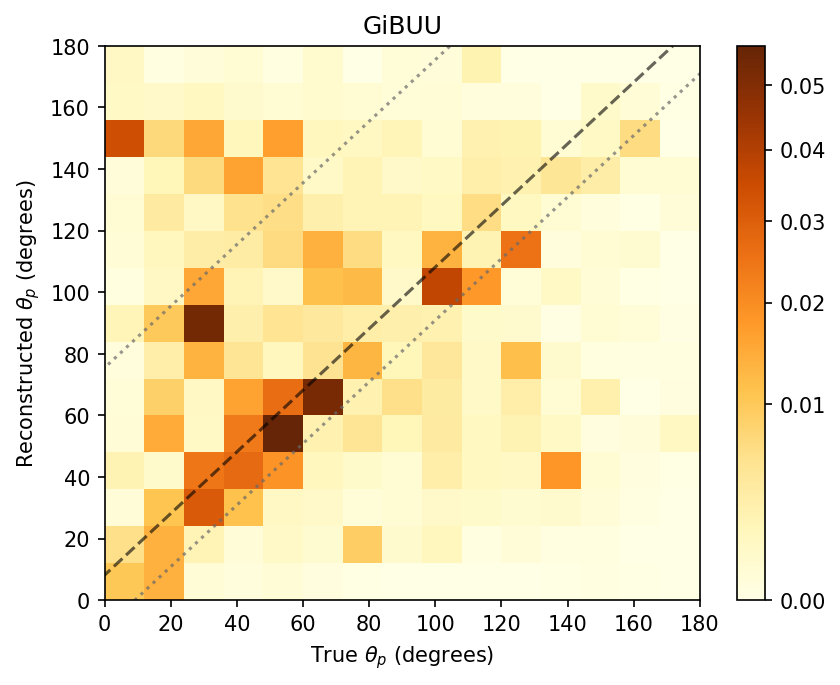

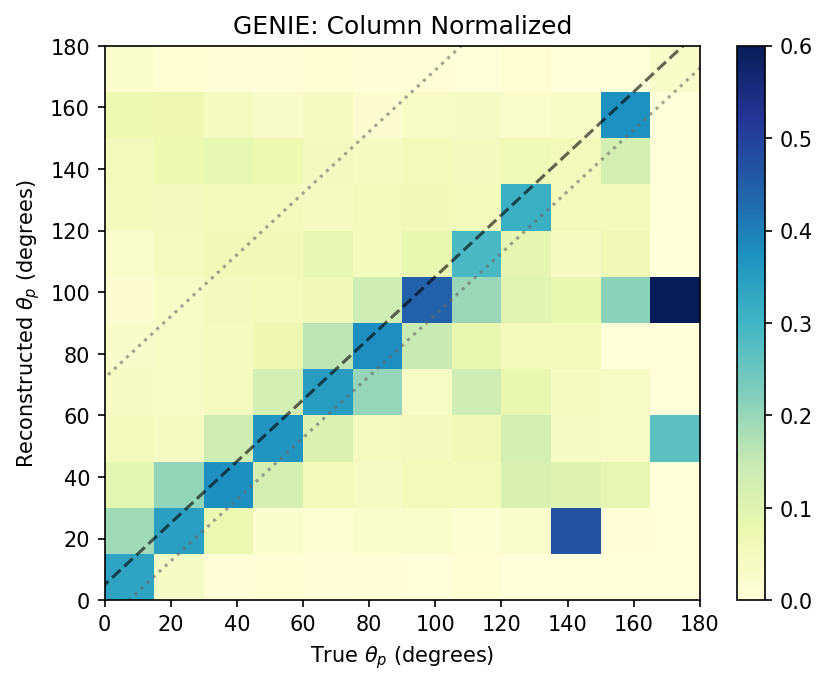

/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_28233/2642220664.py:77: RuntimeWarning: invalid value encountered in divide
  c = plt.pcolormesh(x, y, (dist).T/row_sum,cmap='YlGnBu',vmin=vmin3,vmax=vmax3)


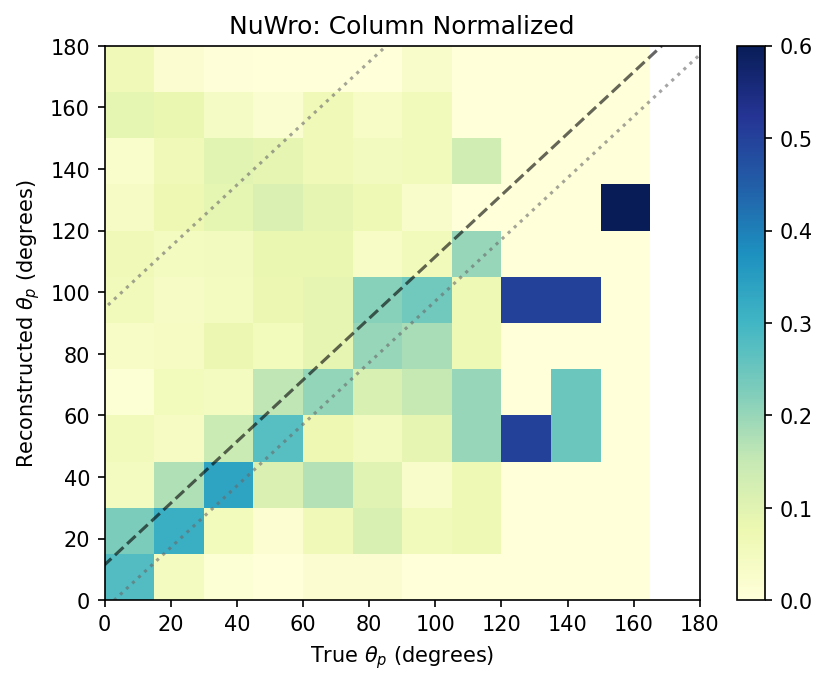

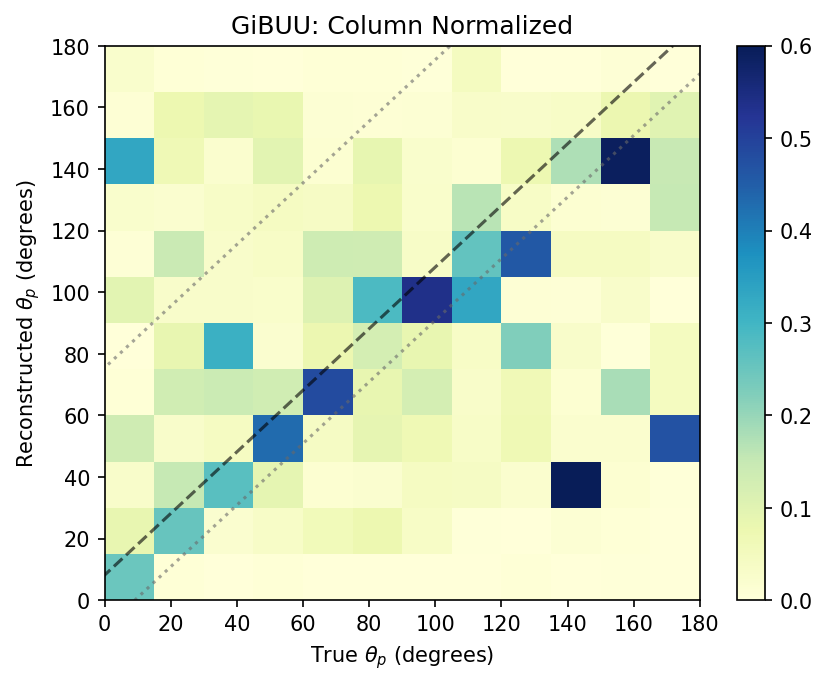

In [71]:

this_query = kdar.presel_query + "and ssm_kine_energy>0 and is_KDAR==1 and truth_prim_p_energy>0 and ssm_prim_track1_kine_energy_range>0"
plot_res_all([kdar_overlay_df,nuwro_df,gibuu_df],this_query,"true_angle_P_deg","ssm_angle_P_deg",
                 -100,100,25,
                 0,180,15,0,180,15,0.6,
                 0,180,12,0,180,12,0,0.6,
                 axis_label=r"$\theta_p$ (degrees)",
)


GENIE
mean: 40.863003626869464
median: 28.526079967498788
std: 105.94394866873638
q1: 8.152076080322274
q3: 54.429611995697044
IQR: 23.138767957687385
FWHM: 27.518352995871183
RMS: 42.71838449974185

NuWro
mean: 38.879407606181516
median: 24.52046377944947
std: 115.41660676422491
q1: 2.892059326171875
q3: 54.025510147094735
IQR: 25.56672541046143
FWHM: 27.05143135676897
RMS: 41.74200708908472

GiBUU
mean: 25.16254503126137
median: 9.18779070663453
std: 107.56334823061283
q1: -0.7275238037109375
q3: 33.56107552337647
IQR: 17.144299663543705
FWHM: 16.784480042369093
RMS: 28.073919449964524



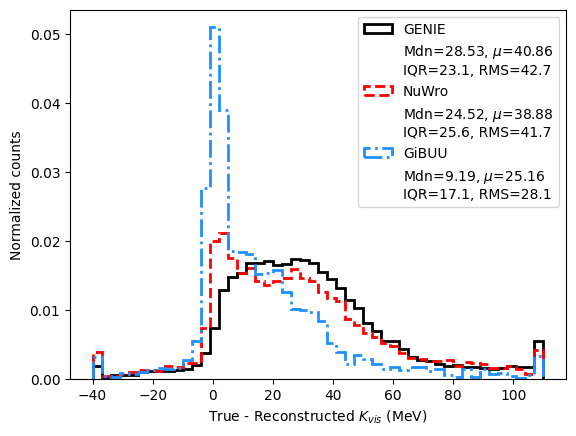

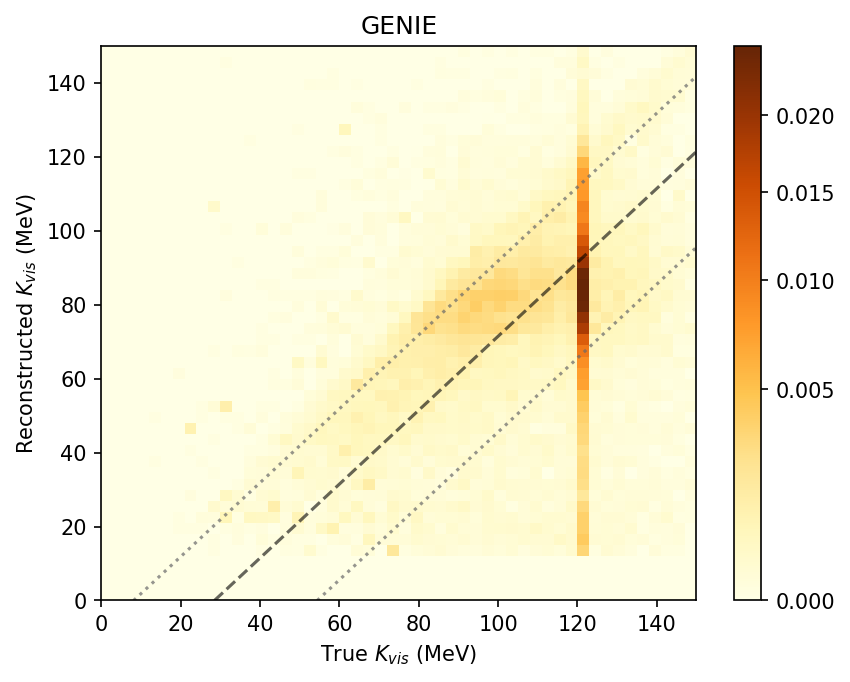

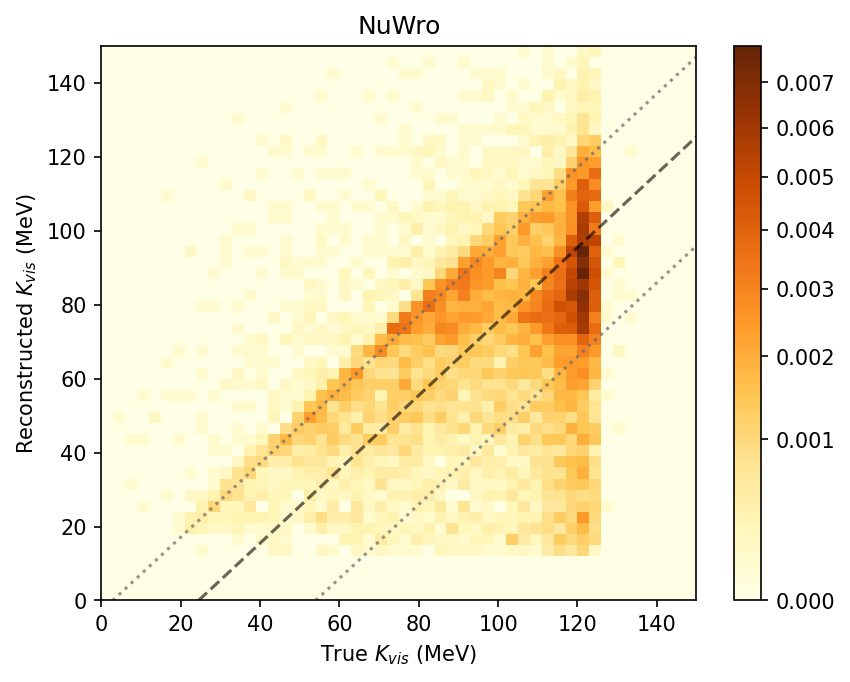

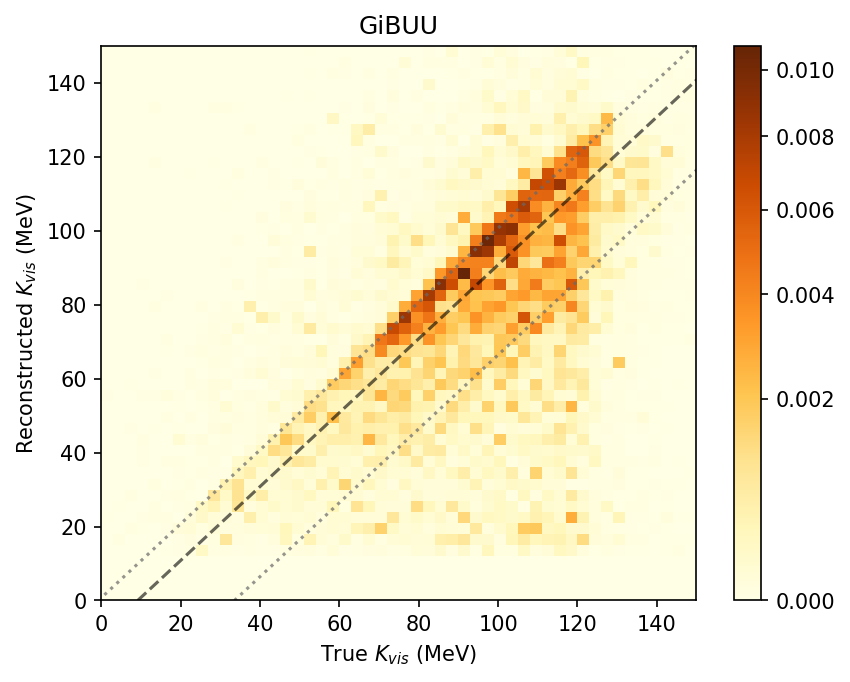

/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_28233/2642220664.py:77: RuntimeWarning: invalid value encountered in divide
  c = plt.pcolormesh(x, y, (dist).T/row_sum,cmap='YlGnBu',vmin=vmin3,vmax=vmax3)


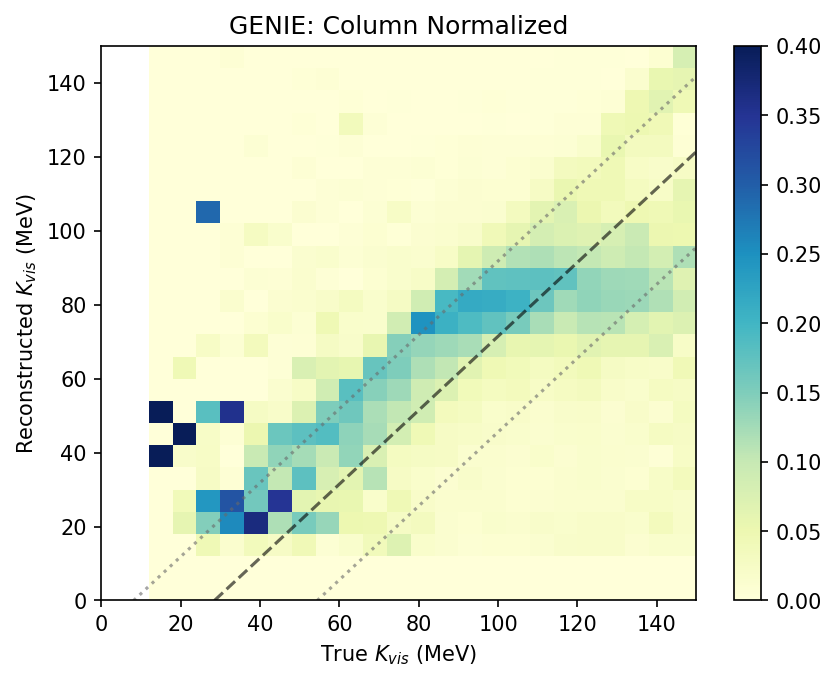

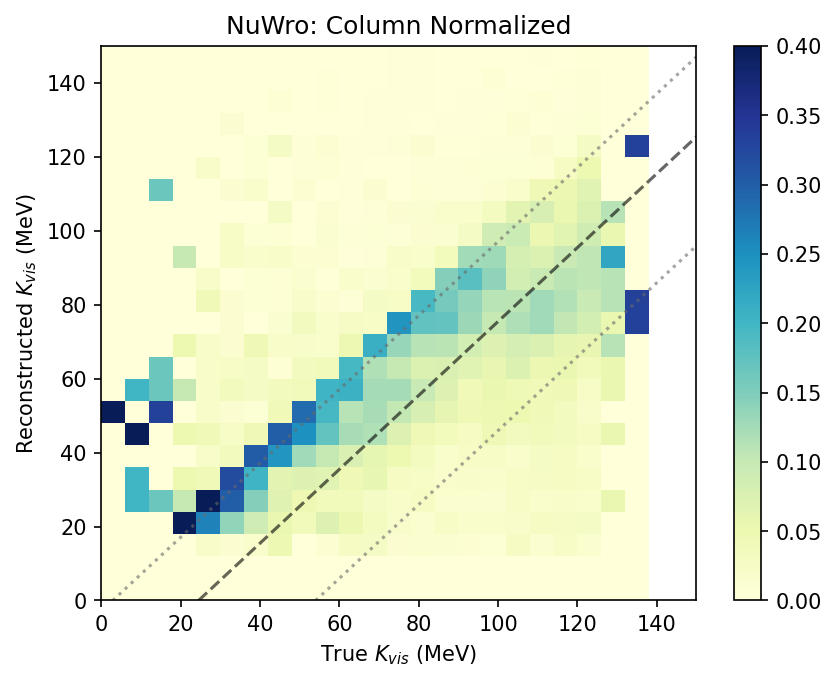

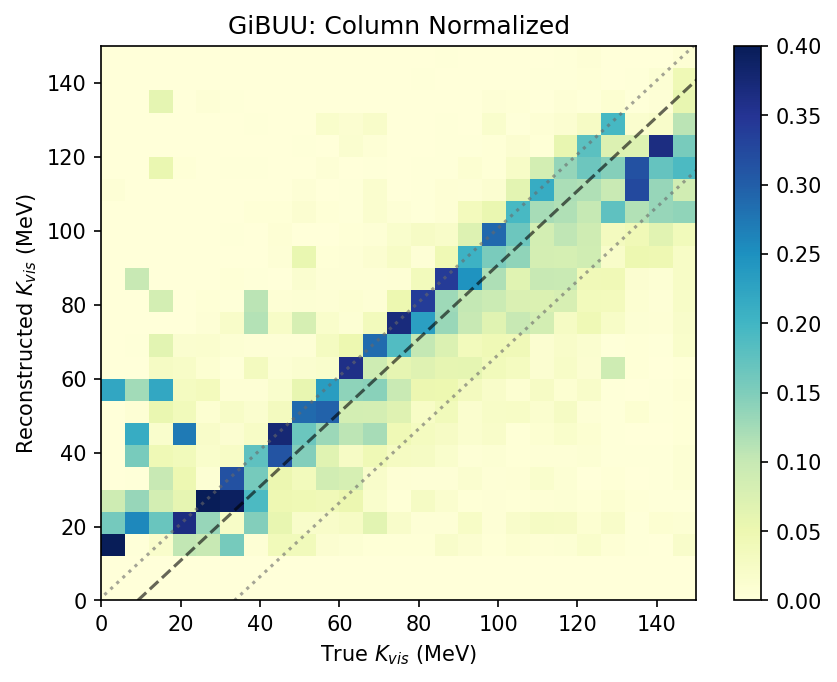

In [76]:
this_query = kdar.presel_query + "and ssm_kine_energy>0 and is_KDAR==1"
plot_res_all([kdar_overlay_df,nuwro_df,gibuu_df],this_query,"true_KE","ssm_KE",
                 -40,110,50,
                 0,150,50,0,150,50,0.6,
                 0,150,25,0,150,25,0,0.4,
                 axis_label=r"$K_{vis}$ (MeV)",
)

GENIE
Using weights
mean: 17.619902045219003
median: 6.715984180450448
std: 100.8882900582457
q1: -7.514347717285162
q3: 27.258488014221214
IQR: 17.386417865753188
FWHM: 14.137632319784936
RMS: 26.027499075232257

NuWro
Using weights
mean: 17.627433288481765
median: 7.2846849708557215
std: 106.66365773756245
q1: -14.078949138641349
q3: 31.739746406555184
IQR: 22.909347772598267
FWHM: 17.361079393292936
RMS: 29.665409380099128

GiBUU
Using weights
mean: 11.585227328931612
median: 5.2057688980102625
std: 87.29376358609129
q1: -15.579980537414542
q3: 26.576752498626718
IQR: 21.07836651802063
FWHM: 15.403405199171686
RMS: 24.55376980410632



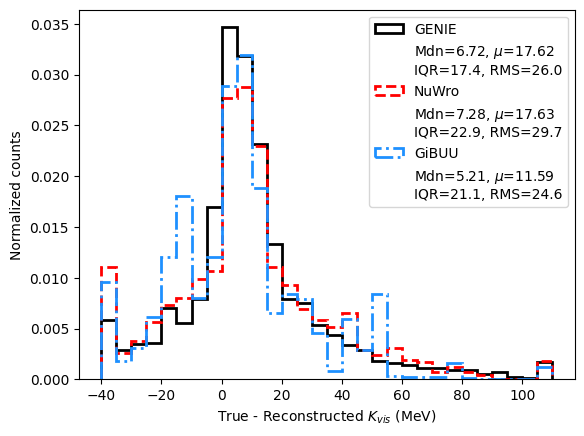

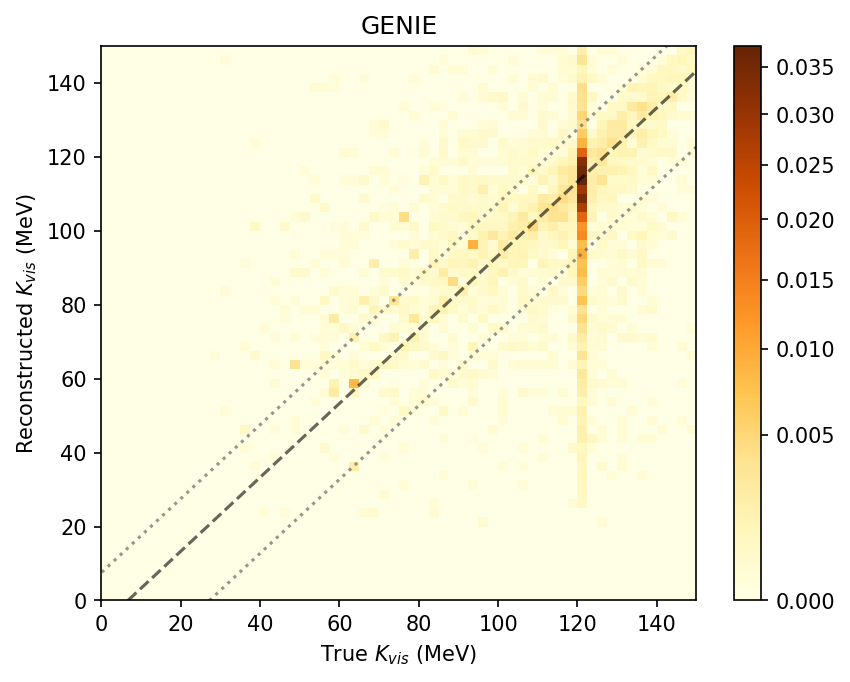

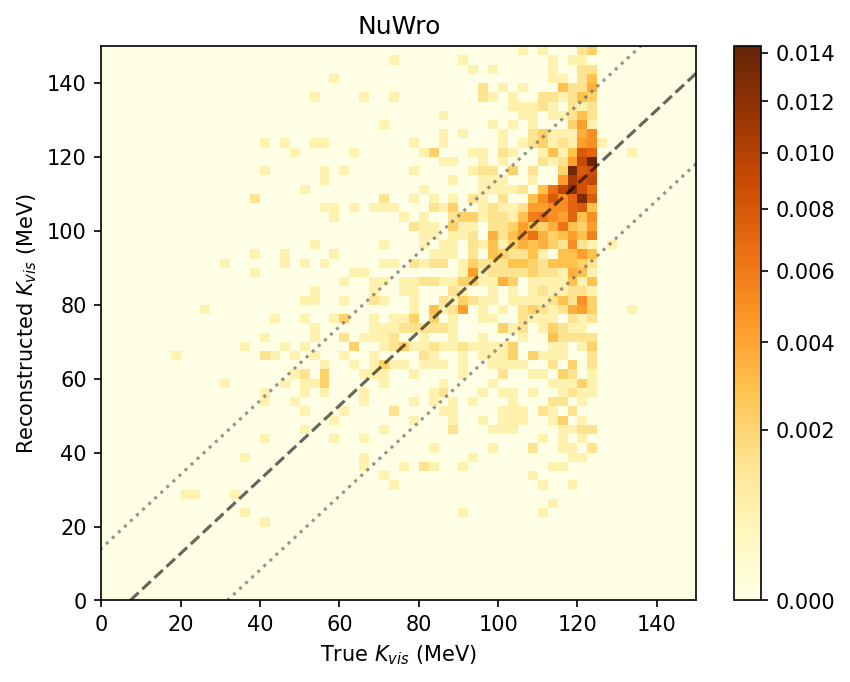

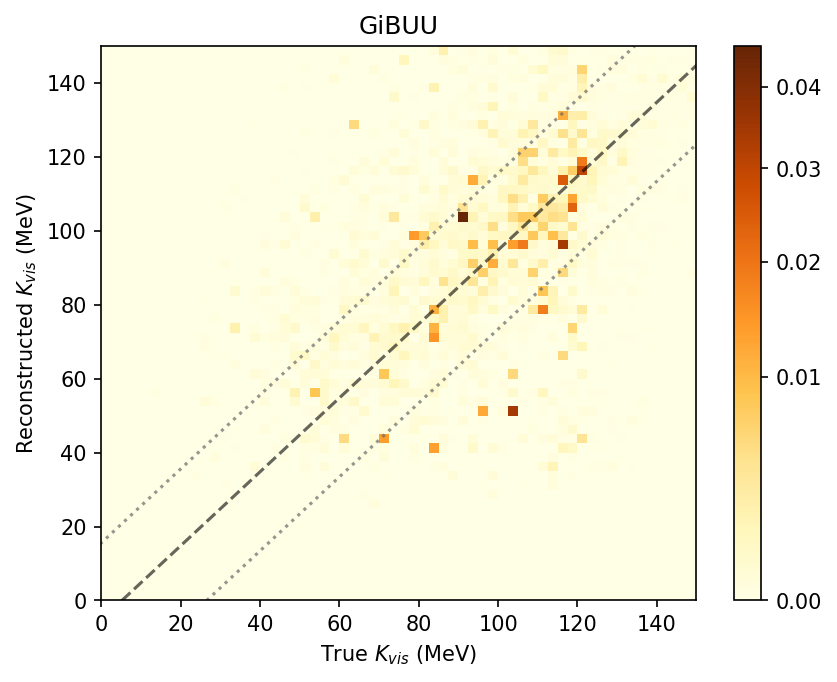

/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_28233/2642220664.py:77: RuntimeWarning: invalid value encountered in divide
  c = plt.pcolormesh(x, y, (dist).T/row_sum,cmap='YlGnBu',vmin=vmin3,vmax=vmax3)


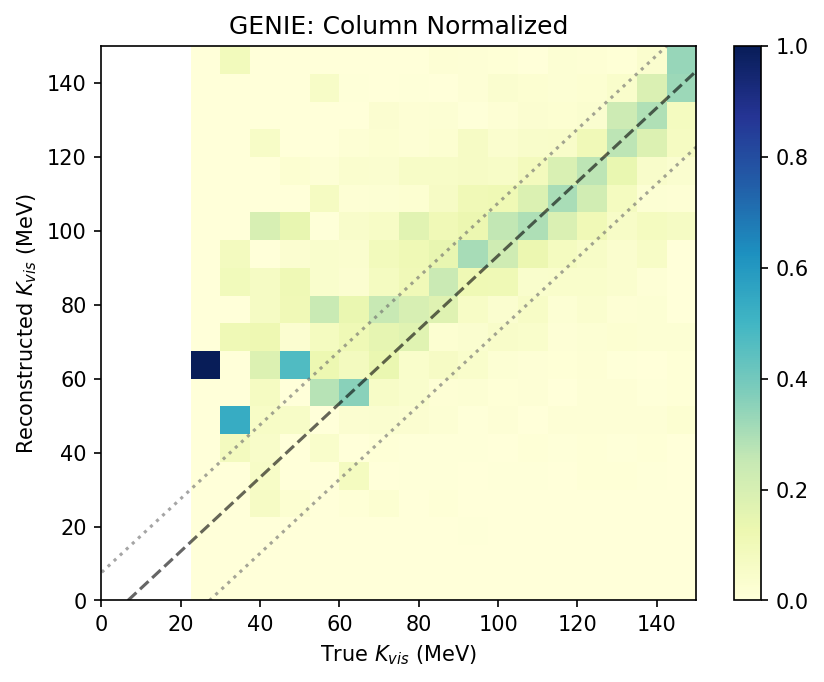

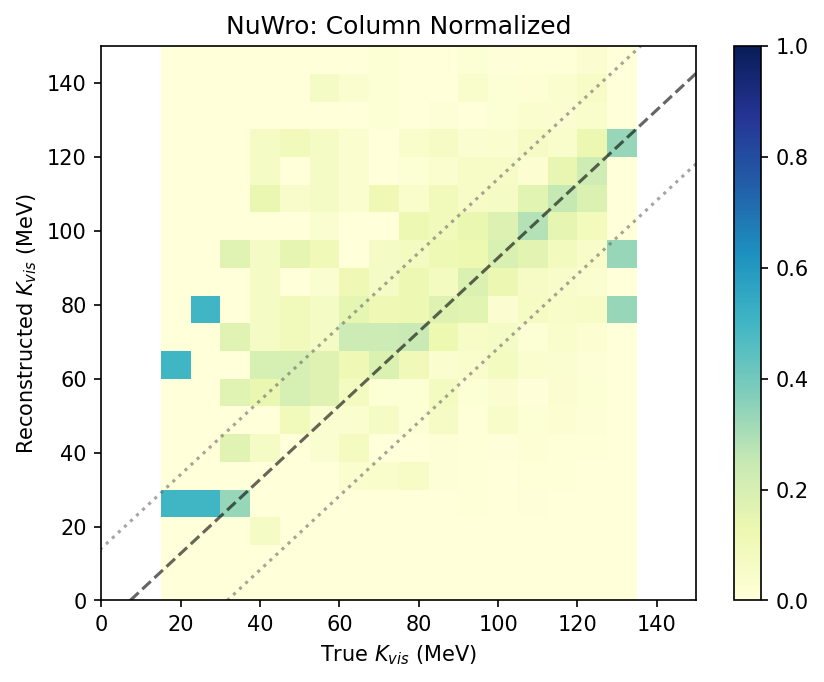

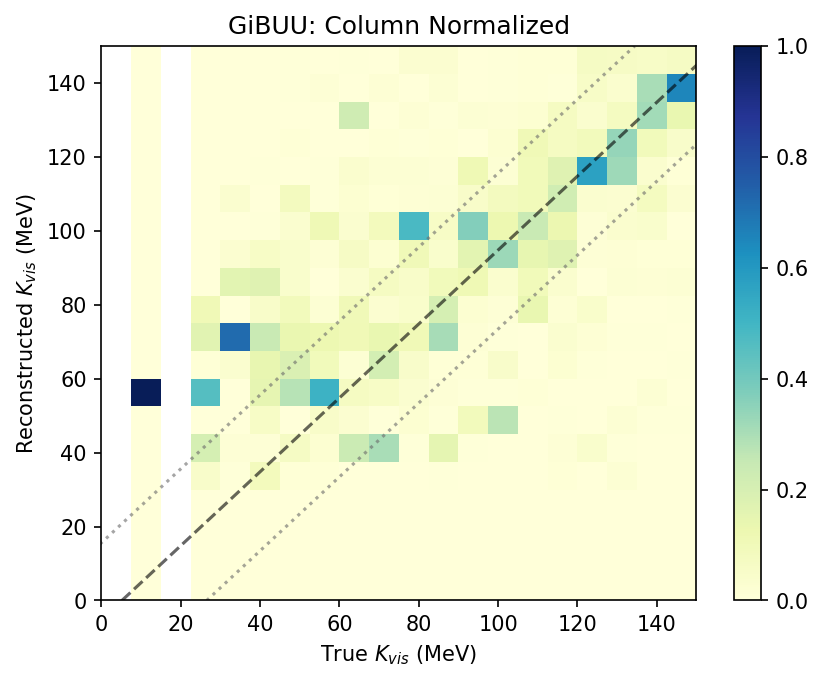

In [86]:
this_query = kdar.presel_query + "and ssm_kine_energy>0 and is_KDAR==1 and ssm_prim_track1_kine_energy_range>0 and truth_prim_p_energy>0 "
plot_res_all([kdar_overlay_df,nuwro_df,gibuu_df],this_query,"true_KE","ssm_KE",
                 -40,110,30,
                 0,150,60,0,150,60,0.6,
                 0,150,20,0,150,20,0,1,
                 axis_label=r"$K_{vis}$ (MeV)",
)

GENIE
Using weights
mean: 44.8143990810877
median: 31.761798694610604
std: 105.51844091440907
q1: 13.081868961334237
q3: 56.929866626739525
IQR: 21.923998832702644
FWHM: 29.206784355950035
RMS: 45.551086263376455

NuWro
Using weights
mean: 45.587229174322914
median: 30.133924320220956
std: 115.49202493620892
q1: 9.628267601013192
q3: 58.983106925964364
IQR: 24.677419662475586
FWHM: 29.881894349406906
RMS: 46.33674354821268

GiBUU
Using weights
mean: 30.812557590513432
median: 20.783702209472665
std: 82.46905874750351
q1: 8.505676105499276
q3: 39.33005221176148
IQR: 15.412188053131104
FWHM: 20.11963924248858
RMS: 31.361377503620634



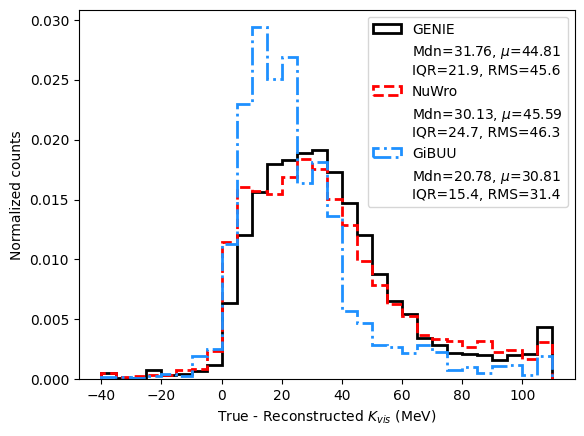

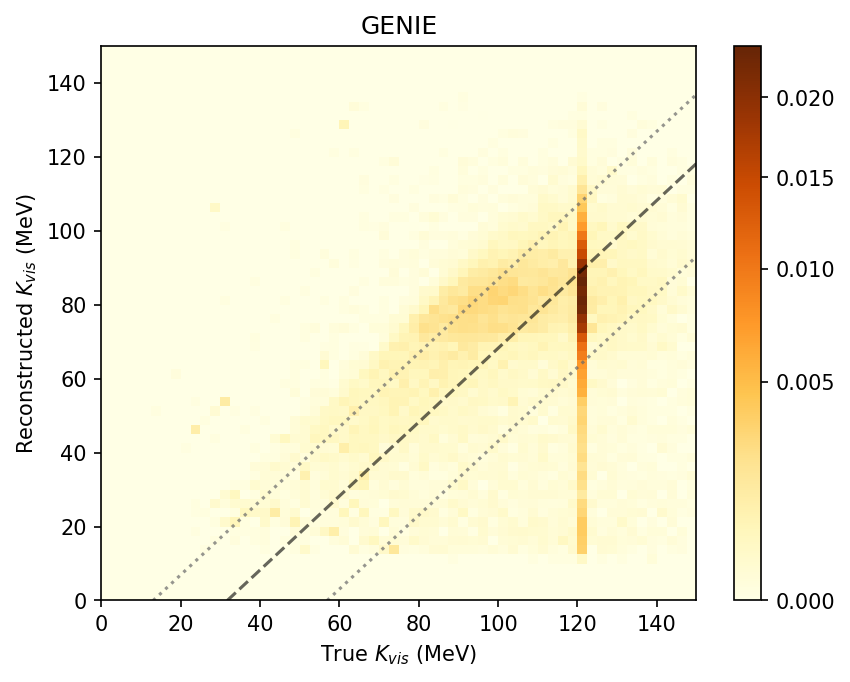

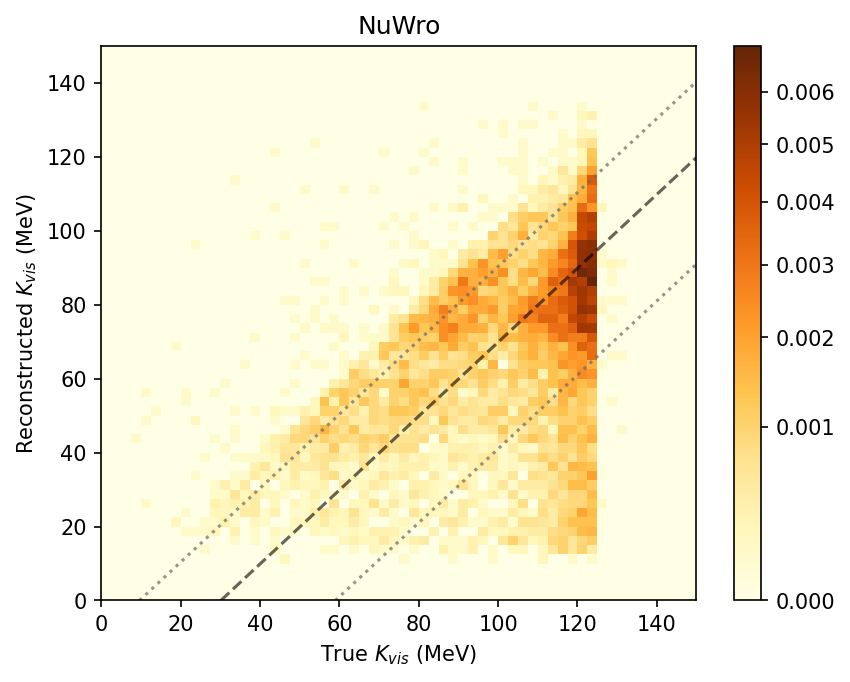

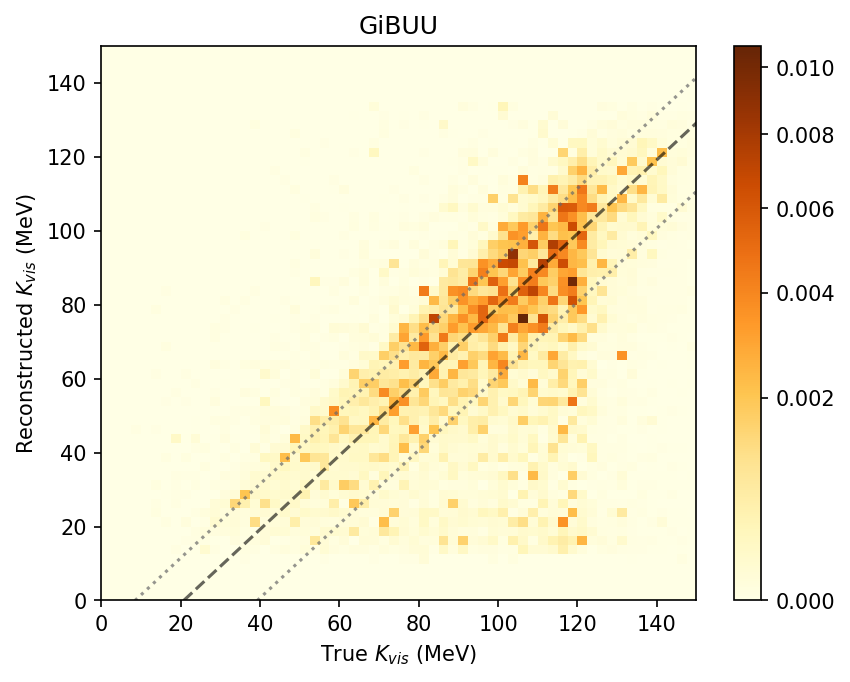

/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_28233/2642220664.py:77: RuntimeWarning: invalid value encountered in divide
  c = plt.pcolormesh(x, y, (dist).T/row_sum,cmap='YlGnBu',vmin=vmin3,vmax=vmax3)


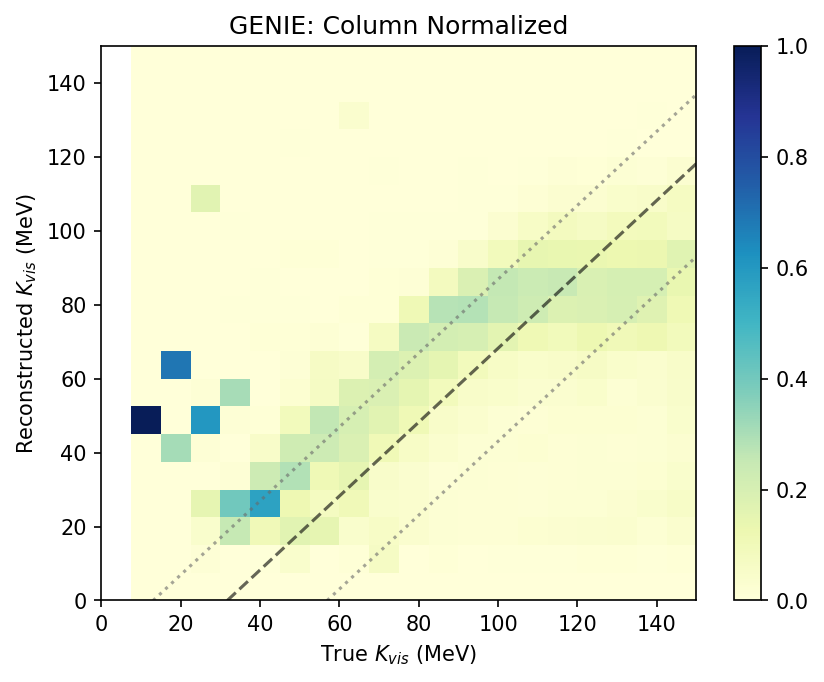

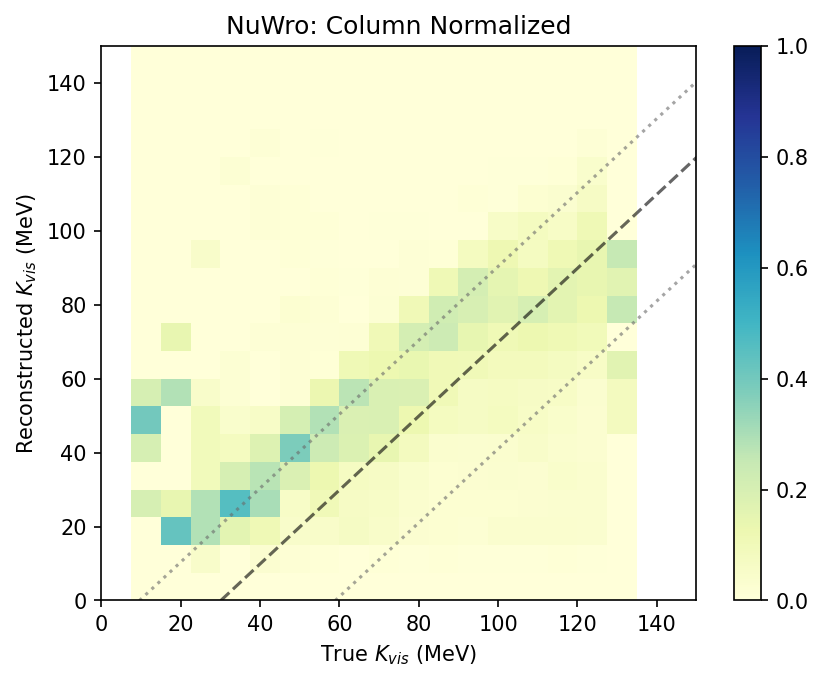

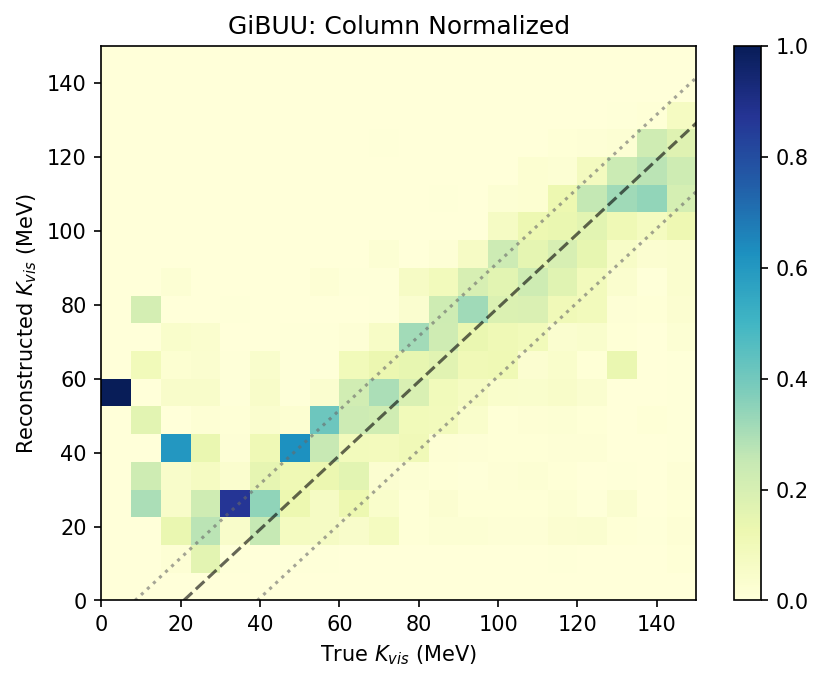

In [90]:
this_query = kdar.presel_query + "and ssm_kine_energy>0 and is_KDAR==1 and ssm_prim_track1_kine_energy_range<0 and truth_prim_p_energy>0"
plot_res_all([kdar_overlay_df,nuwro_df,gibuu_df],this_query,"true_KE","ssm_KE",
                 -40,110,30,
                 0,150,60,0,150,60,0.6,
                 0,150,20,0,150,20,0,1,
                 axis_label=r"$K_{vis}$ (MeV)",
)

GENIE
Using weights
mean: 29.290819903067533
median: 1.4064977912902918
std: 159.25858822781038
q1: -1.677490234375
q3: 7.4337158203125
IQR: 4.55560302734375
FWHM: 3.8103183719863827
RMS: 32.14875943501099

NuWro
Using weights
mean: 15.451115161714686
median: 1.43023681640625
std: 114.96306744303719
q1: -1.52630615234375
q3: 6.2375030517578125
IQR: 3.8819046020507812
FWHM: 3.2107652822719075
RMS: 19.24617618374199

GiBUU
Using weights
mean: 19.665957303754258
median: 1.3540191650390625
std: 123.53997591258613
q1: -2.0092315673828125
q3: 8.601364135742188
IQR: 5.3052978515625
FWHM: 4.416460021527409
RMS: 21.820105053609566



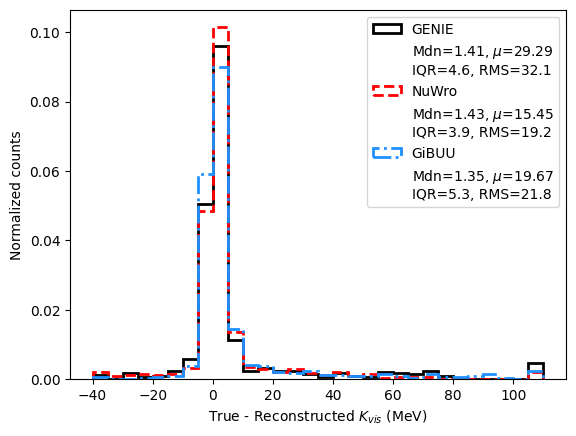

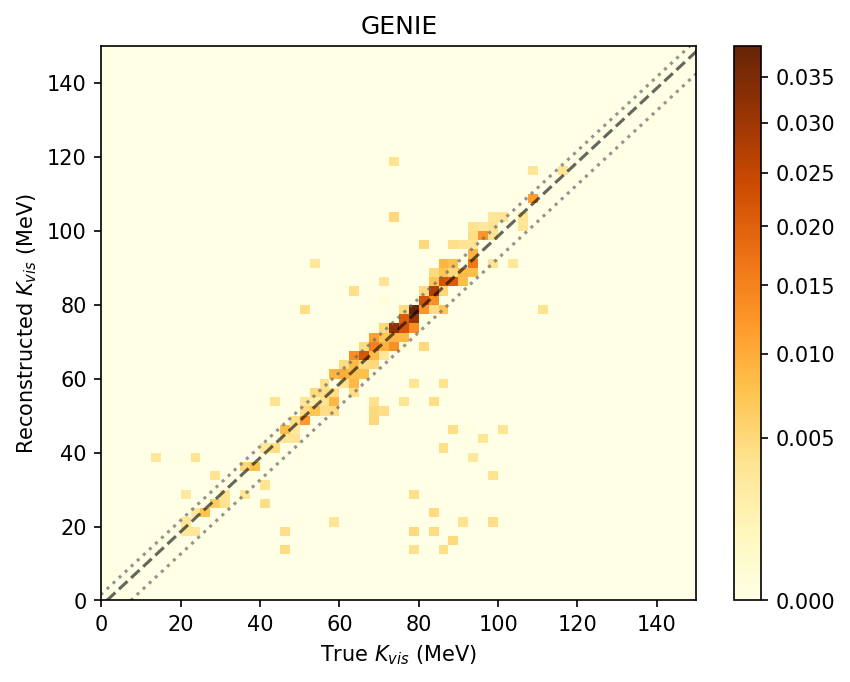

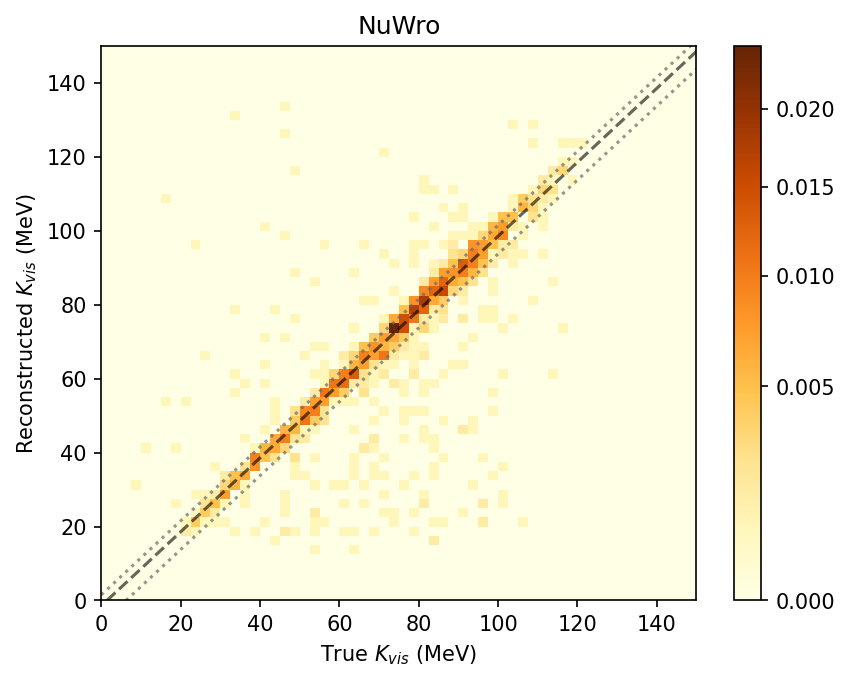

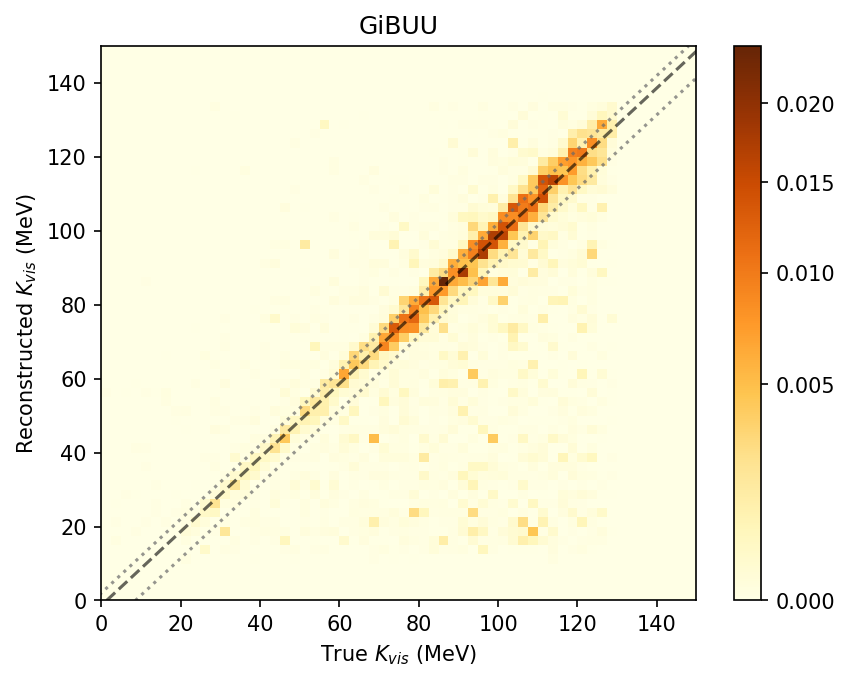

/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_28233/2642220664.py:77: RuntimeWarning: invalid value encountered in divide
  c = plt.pcolormesh(x, y, (dist).T/row_sum,cmap='YlGnBu',vmin=vmin3,vmax=vmax3)


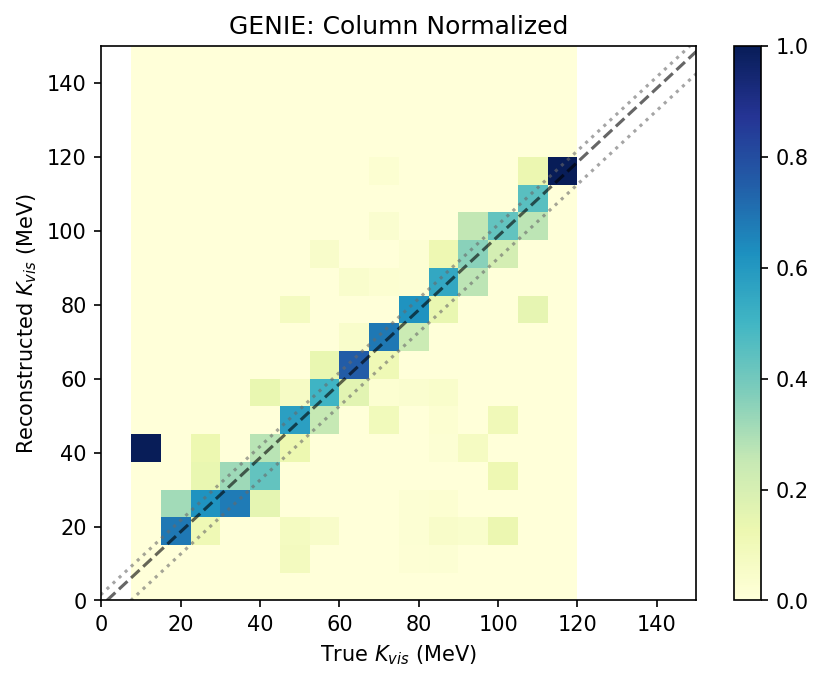

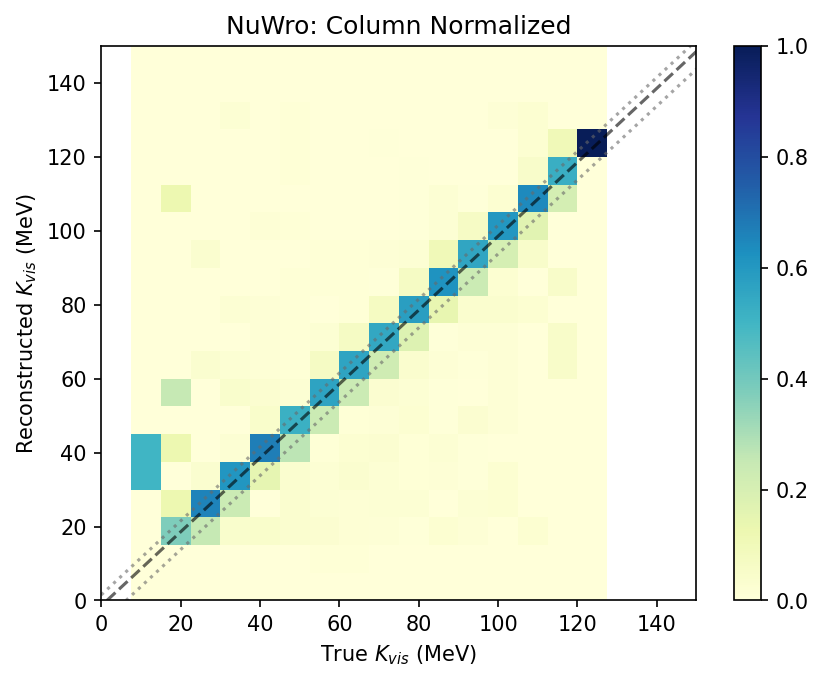

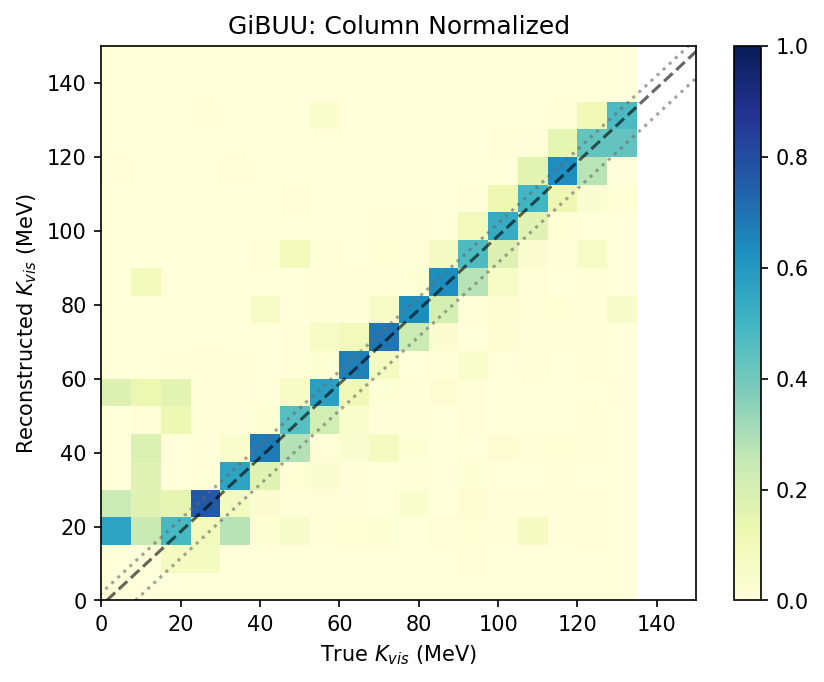

In [89]:
this_query = kdar.presel_query + "and ssm_kine_energy>0 and is_KDAR==1 and ssm_prim_track1_kine_energy_range<0 and truth_prim_p_energy<1"
plot_res_all([kdar_overlay_df,nuwro_df,gibuu_df],this_query,"true_KE","ssm_KE",
                 -40,110,30,
                 0,150,60,0,150,60,0.6,
                 0,150,20,0,150,20,0,1,
                 axis_label=r"$K_{vis}$ (MeV)",
)

GENIE
mean: 30.623717944345366
median: 5.7000268249511805
std: 107.67484488272403
q1: -2.3072967529296875
q3: 52.596967533111595
IQR: 27.45213214302064
FWHM: 26.323775432037078
RMS: 35.42019510672844

NuWro
mean: 30.065953279905525
median: 3.1334075927734375
std: 116.48157648356094
q1: -2.3641357421875
q3: 52.47417815017701
IQR: 27.419156946182255
FWHM: 26.26370361517965
RMS: 35.403280080569786

GiBUU
mean: 17.214512031715408
median: 0.9258041381835938
std: 107.7776664352215
q1: -2.7437591552734375
q3: 24.117889404296875
IQR: 13.430824279785156
FWHM: 12.136729415497841
RMS: 22.11466639126559



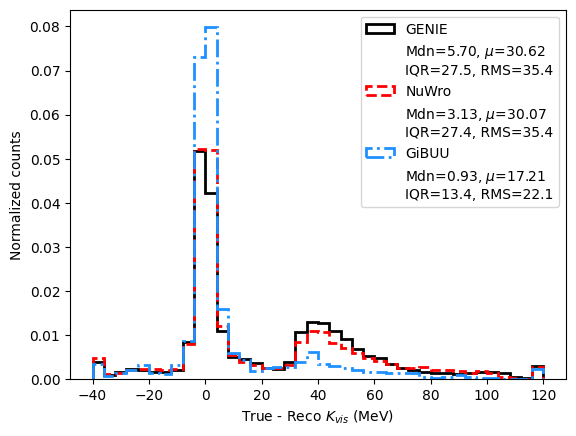

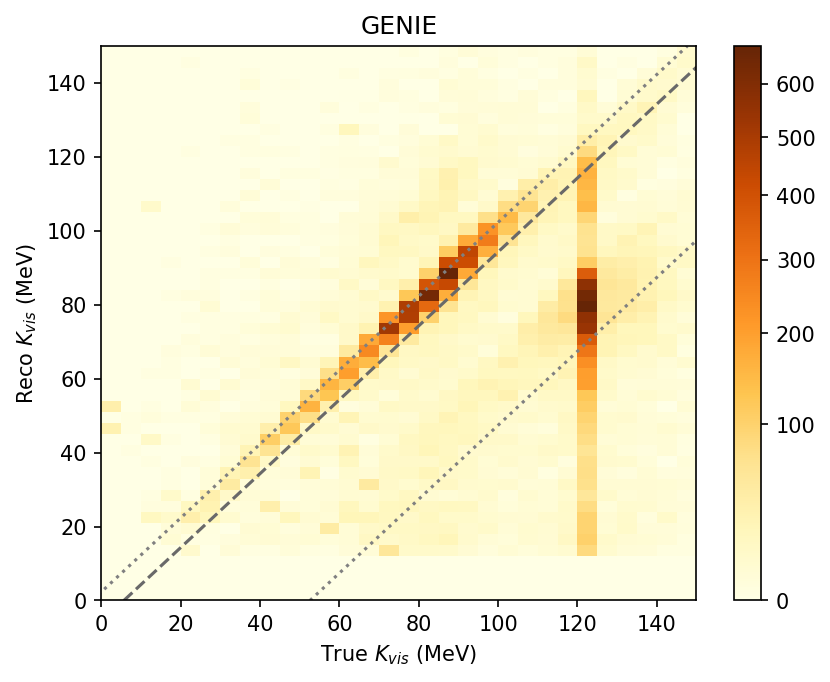

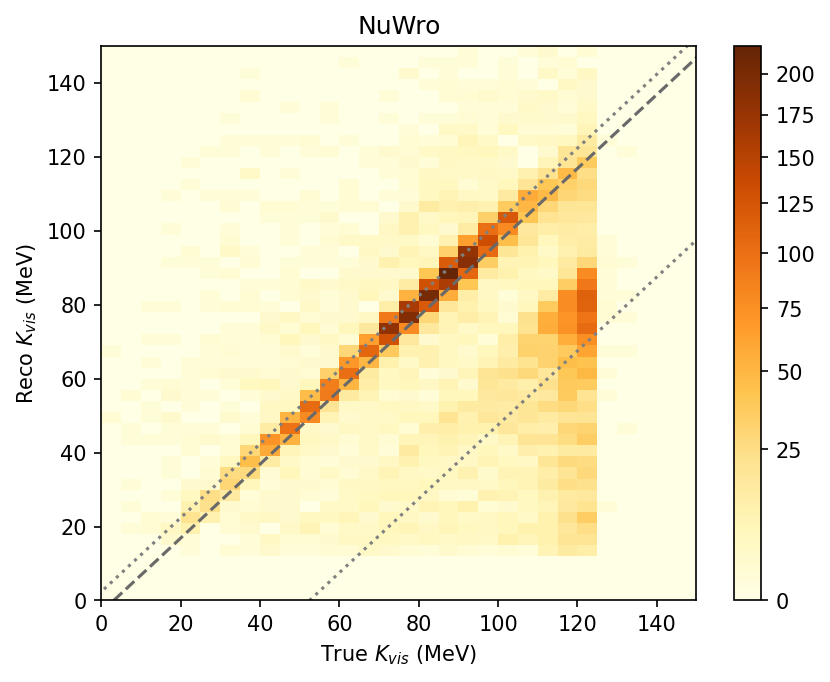

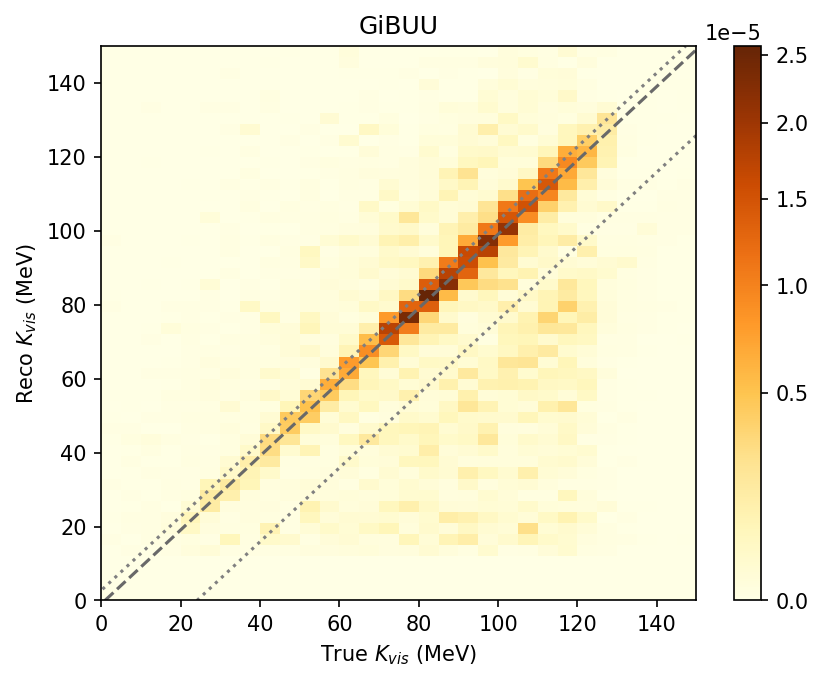

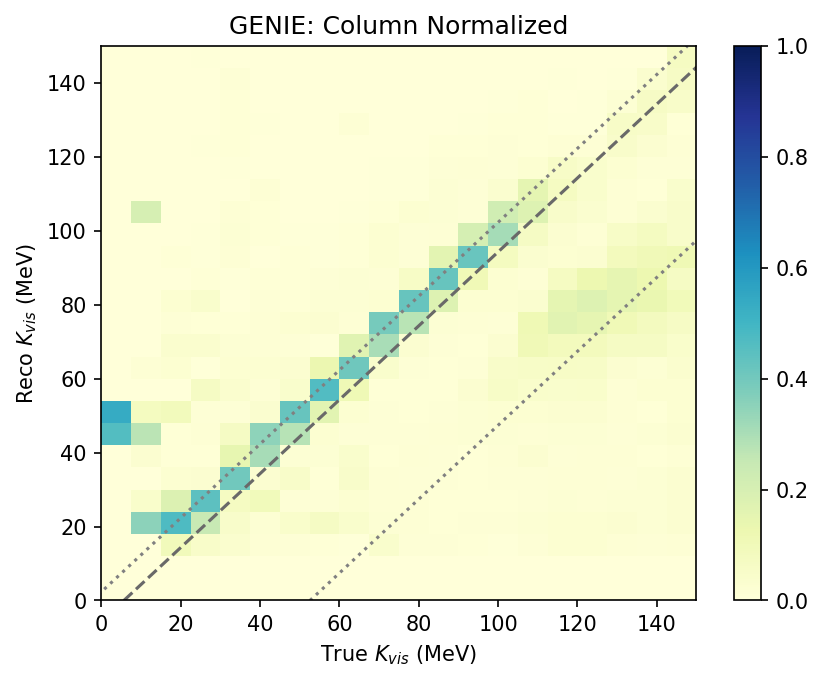

/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_28233/1993924345.py:75: RuntimeWarning: invalid value encountered in divide
  c = plt.pcolormesh(x, y, (dist).T/row_sum,cmap='YlGnBu',vmin=vmin3,vmax=vmax3)


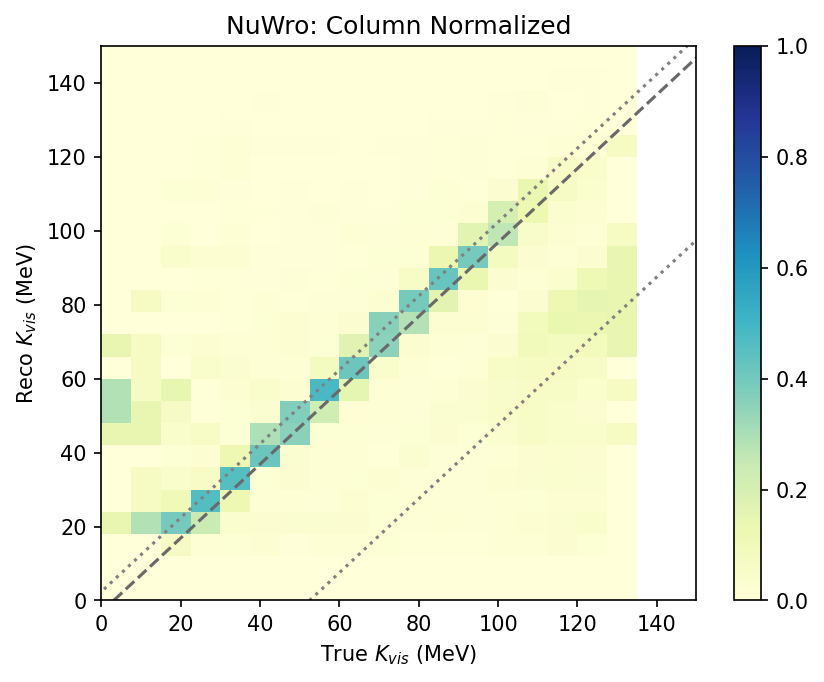

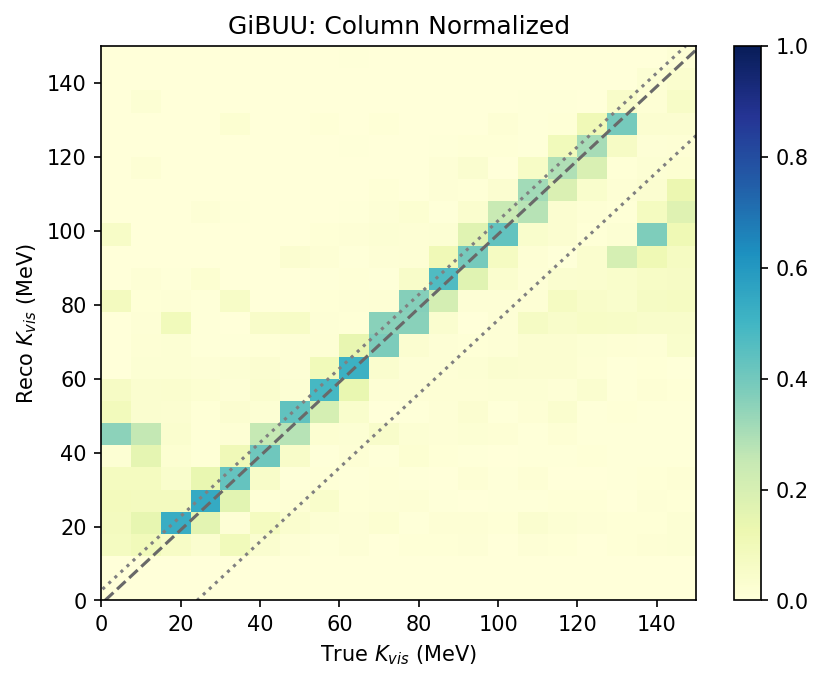

In [28]:
this_query = kdar.presel_query + "and ssm_kine_energy>0 and is_KDAR==1"
plot_res_all([kdar_overlay_df,nuwro_df,gibuu_df],this_query,"true_KE_th35","ssm_KE",
                 -40,120,40,
                 0,150,30,0,150,50,0.6,
                 0,150,20,0,150,25,0,1,
                 axis_label=r"$K_{vis}$ (MeV)",
)

GENIE
Using weights
mean: 12.134797882276795
median: 4.9475286750793686
std: 102.1385716153896
q1: -24.182464599609375
q3: 26.343773200988778
IQR: 25.263118900299077
FWHM: 17.880058588945502
RMS: 29.44021129194533

NuWro
Using weights
mean: 12.199554615665349
median: 5.226218059539804
std: 107.87669294381571
q1: -26.196701049804688
q3: 31.077227905273446
IQR: 28.636964477539067
FWHM: 20.322778108375985
RMS: 32.89468331265648

GiBUU
Using weights
mean: 1.3958219581767024
median: -9.717226192474357
std: 88.85410092416653
q1: -29.031494140625
q3: 26.576752498626718
IQR: 27.80412331962586
FWHM: 19.67963049329436
RMS: 30.68984388682158



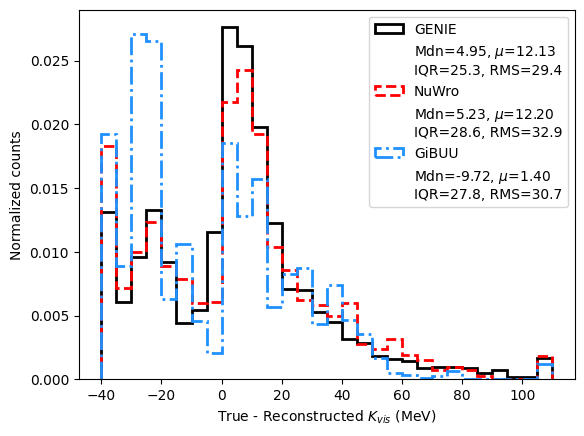

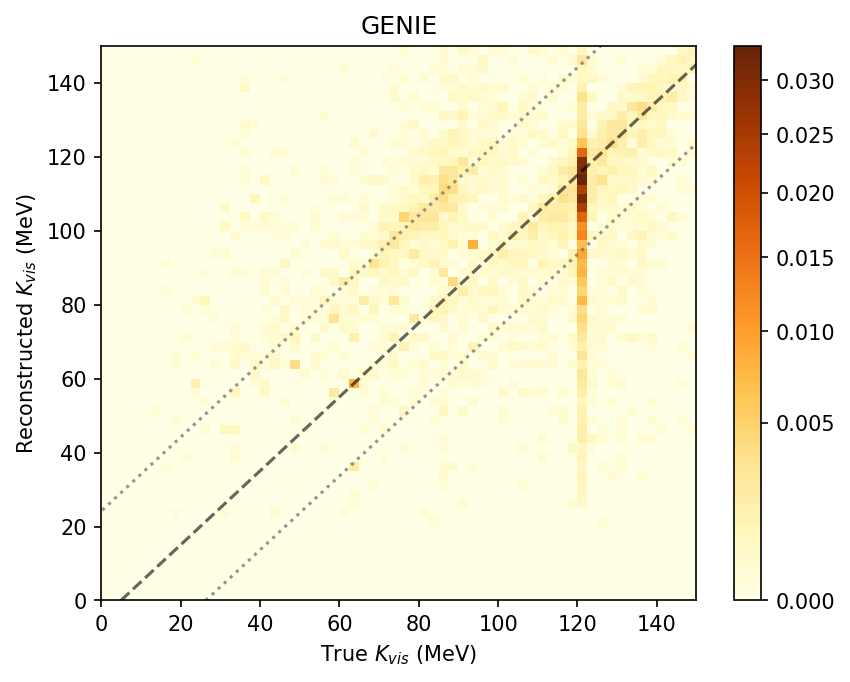

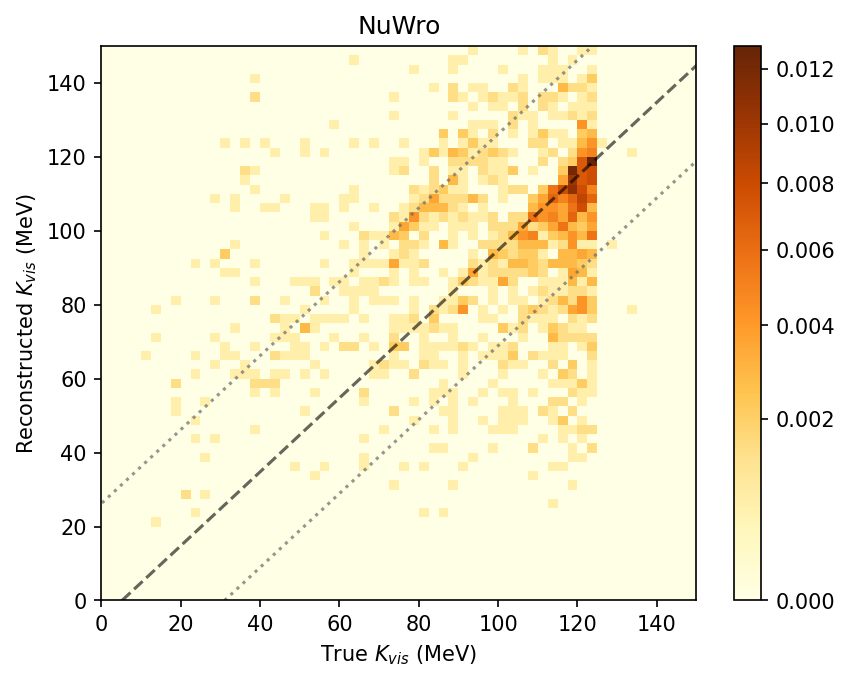

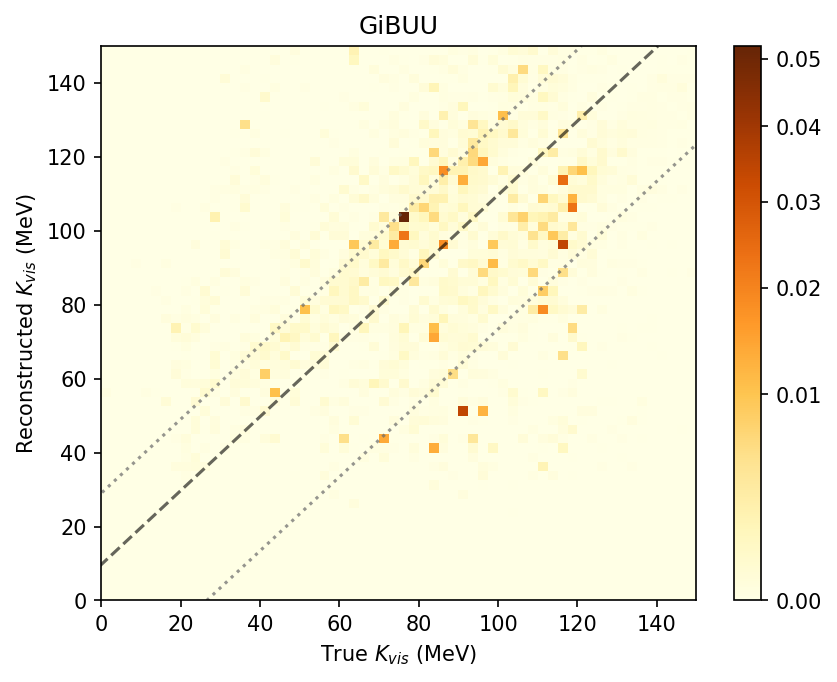

/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_28233/2642220664.py:77: RuntimeWarning: invalid value encountered in divide
  c = plt.pcolormesh(x, y, (dist).T/row_sum,cmap='YlGnBu',vmin=vmin3,vmax=vmax3)


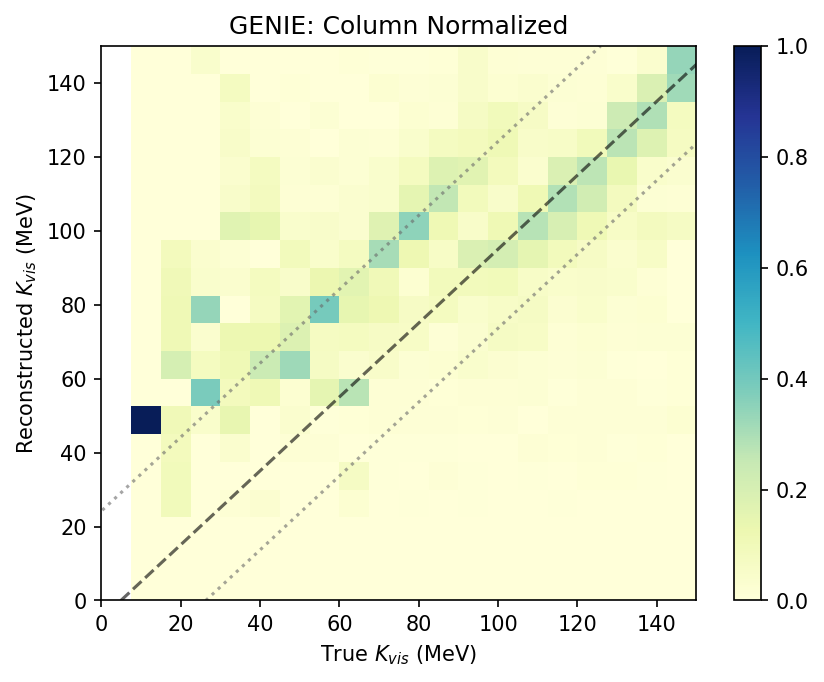

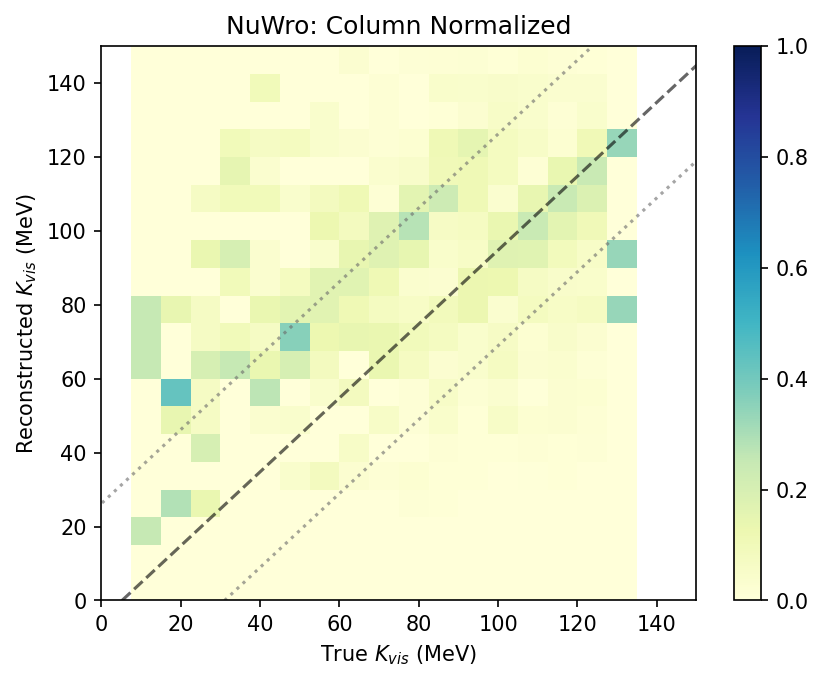

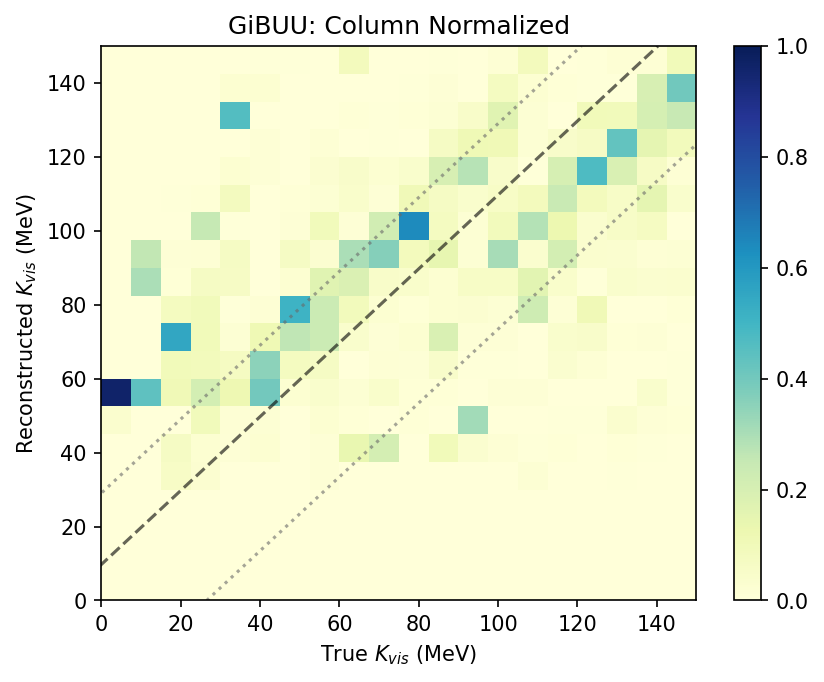

In [91]:
this_query = kdar.presel_query + "and ssm_kine_energy>0 and is_KDAR==1 and ssm_prim_track1_kine_energy_range>0 and truth_prim_p_energy>0 "
plot_res_all([kdar_overlay_df,nuwro_df,gibuu_df],this_query,"true_KE_th35","ssm_KE",
                 -40,110,30,
                 0,150,60,0,150,60,0.6,
                 0,150,20,0,150,20,0,1,
                 axis_label=r"$K_{vis}$ (MeV)",
)

GENIE
Using weights
mean: 33.69424355791039
median: 6.4909210205078125
std: 107.54780538918874
q1: -1.849395751953125
q3: 54.948701217651376
IQR: 28.39904848480225
FWHM: 27.489907375953745
RMS: 36.40950876621204

NuWro
Using weights
mean: 35.070545255235196
median: 4.1031646728515625
std: 117.06549719937365
q1: -1.827728271484375
q3: 57.43621762084962
IQR: 29.631972946166997
FWHM: 28.73264556747246
RMS: 37.6168864714695

GiBUU
Using weights
mean: 16.13406221768252
median: 0.67242431640625
std: 83.10348975385095
q1: -2.3900604248046875
q3: 37.08791001129151
IQR: 19.7389852180481
FWHM: 18.58242084498058
RMS: 19.092049722622647



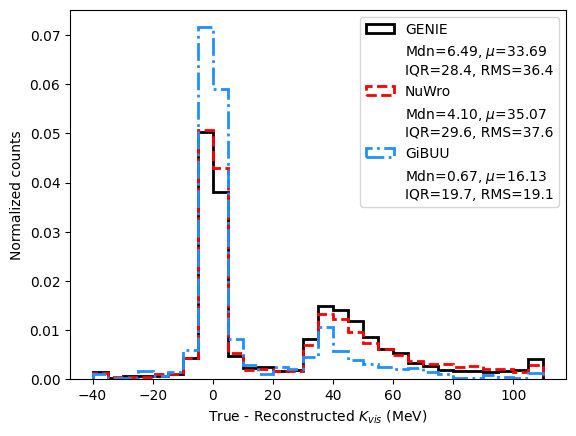

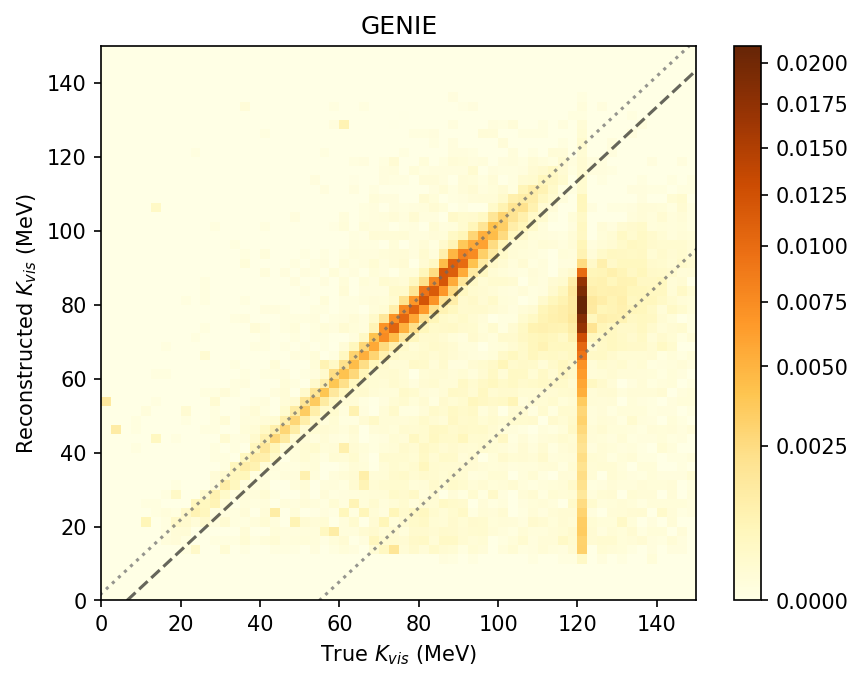

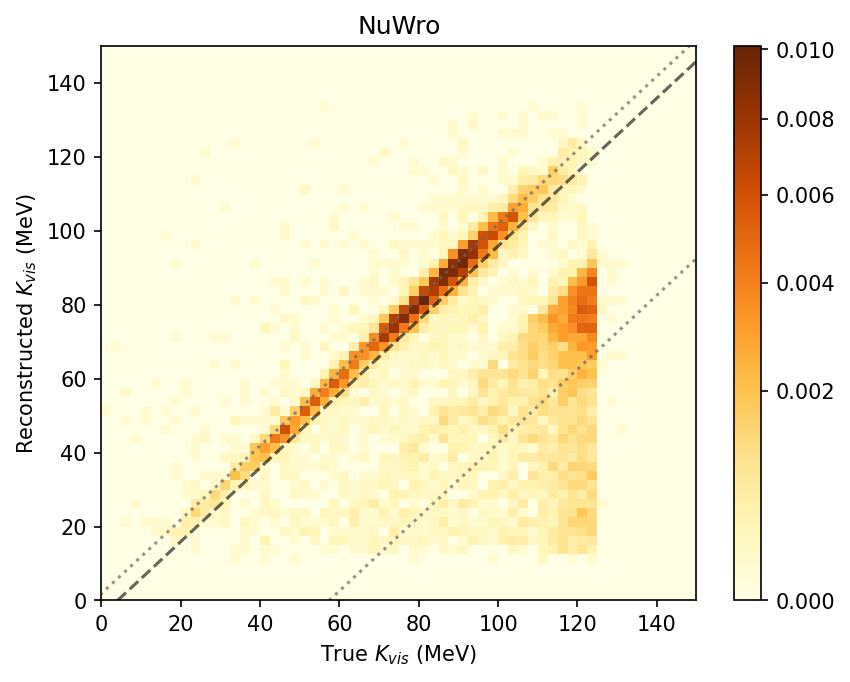

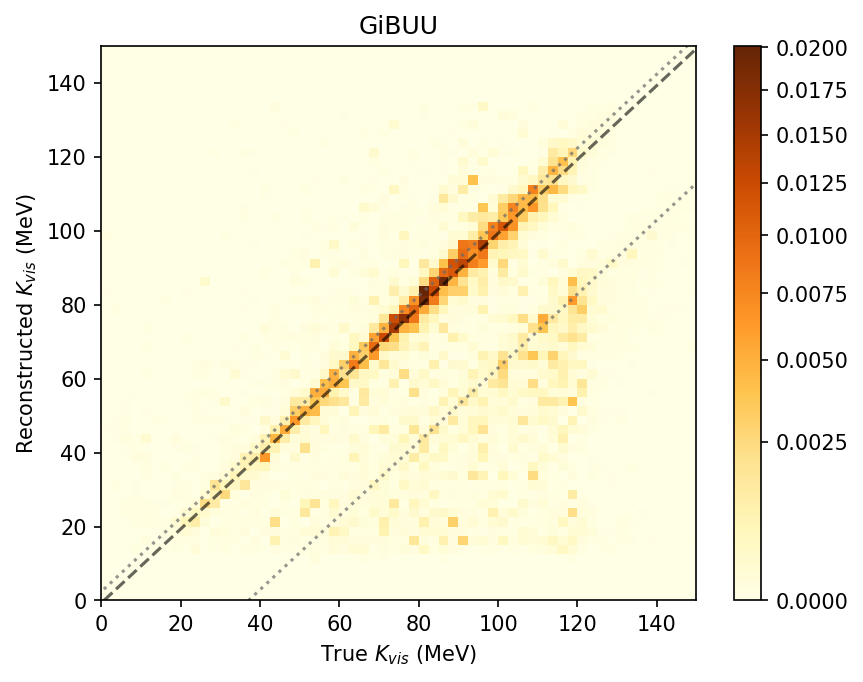

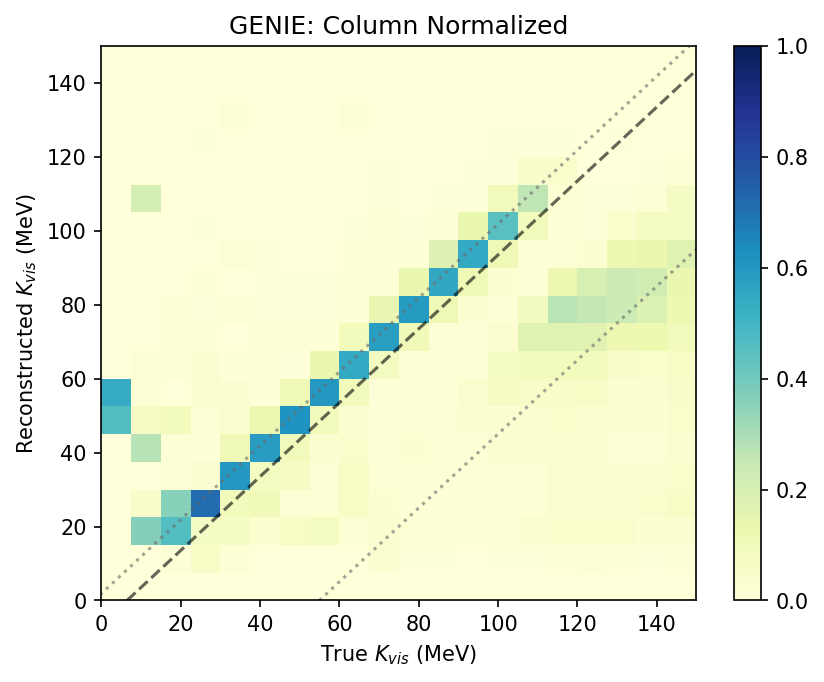

/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_28233/2642220664.py:77: RuntimeWarning: invalid value encountered in divide
  c = plt.pcolormesh(x, y, (dist).T/row_sum,cmap='YlGnBu',vmin=vmin3,vmax=vmax3)


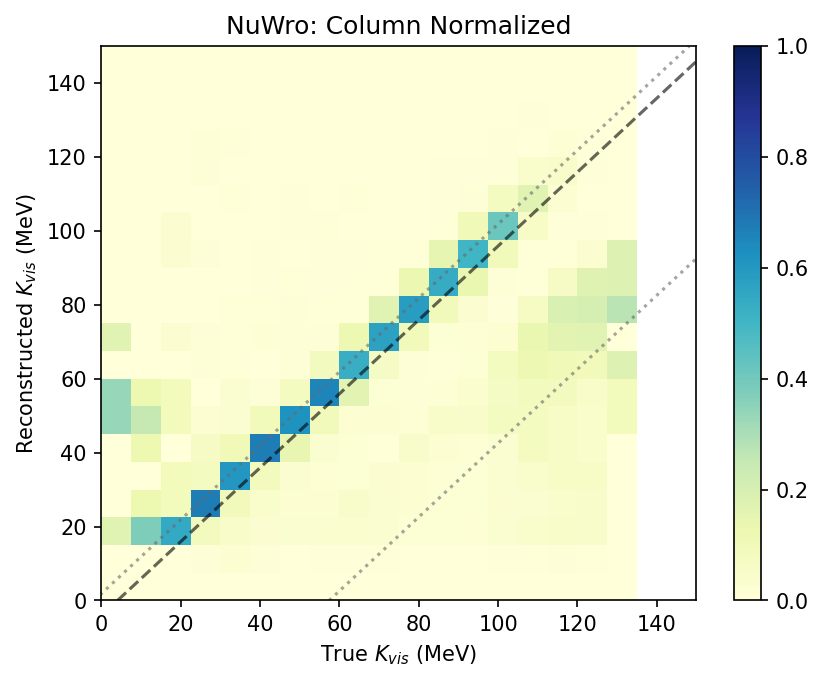

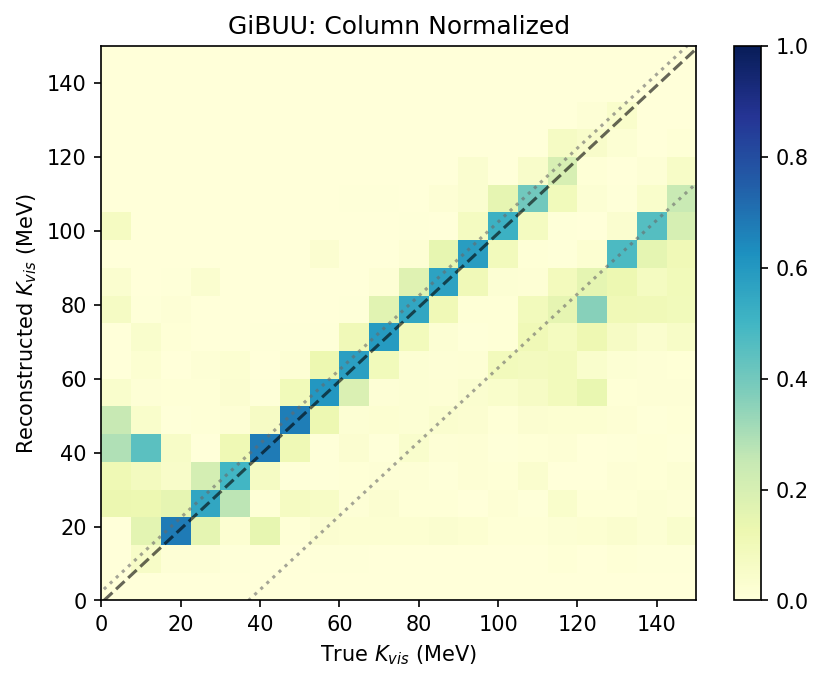

In [92]:
this_query = kdar.presel_query + "and ssm_kine_energy>0 and is_KDAR==1 and ssm_prim_track1_kine_energy_range<0 and truth_prim_p_energy>0"
plot_res_all([kdar_overlay_df,nuwro_df,gibuu_df],this_query,"true_KE_th35","ssm_KE",
                 -40,110,30,
                 0,150,60,0,150,60,0.6,
                 0,150,20,0,150,20,0,1,
                 axis_label=r"$K_{vis}$ (MeV)",
)

GENIE
Using weights
mean: 29.196880415725055
median: 1.20501708984375
std: 159.2712639407778
q1: -1.7869949340820312
q3: 7.4337158203125
IQR: 4.610355377197266
FWHM: 3.822743837598826
RMS: 32.10708006571635

NuWro
Using weights
mean: 15.385335689922156
median: 1.359832763671875
std: 114.95689533676897
q1: -1.544891357421875
q3: 6.0521087646484375
IQR: 3.7985000610351562
FWHM: 3.123087807177827
RMS: 19.21762530817107

GiBUU
Using weights
mean: 19.665555764540013
median: 1.3540191650390625
std: 123.53988470019878
q1: -2.0092315673828125
q3: 8.601364135742188
IQR: 5.3052978515625
FWHM: 4.416460021527409
RMS: 21.819797172586266



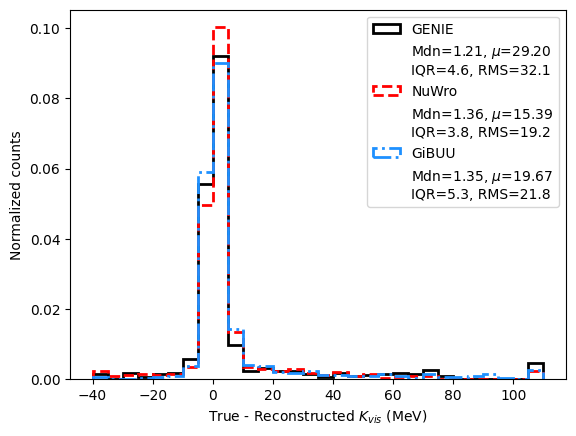

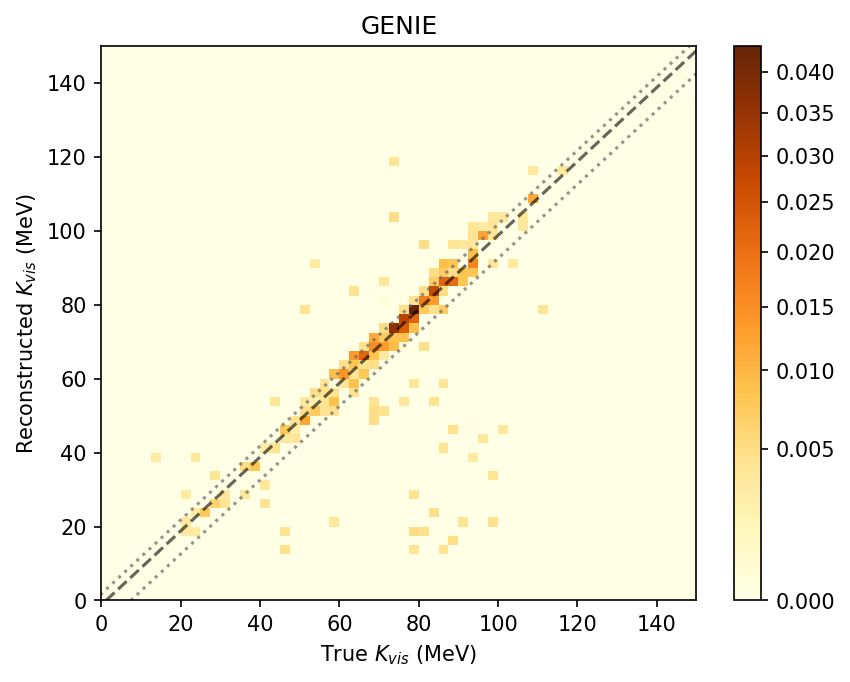

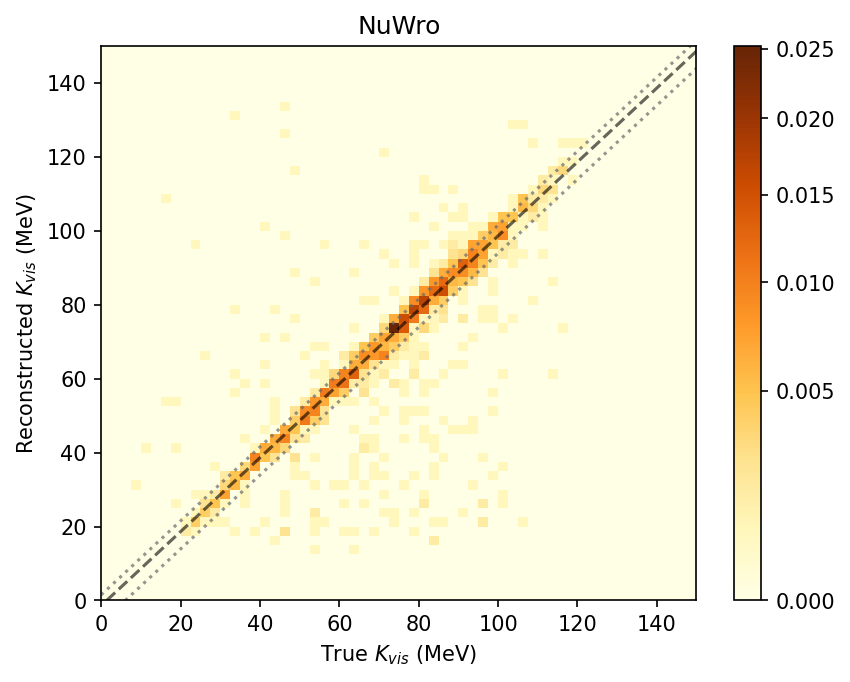

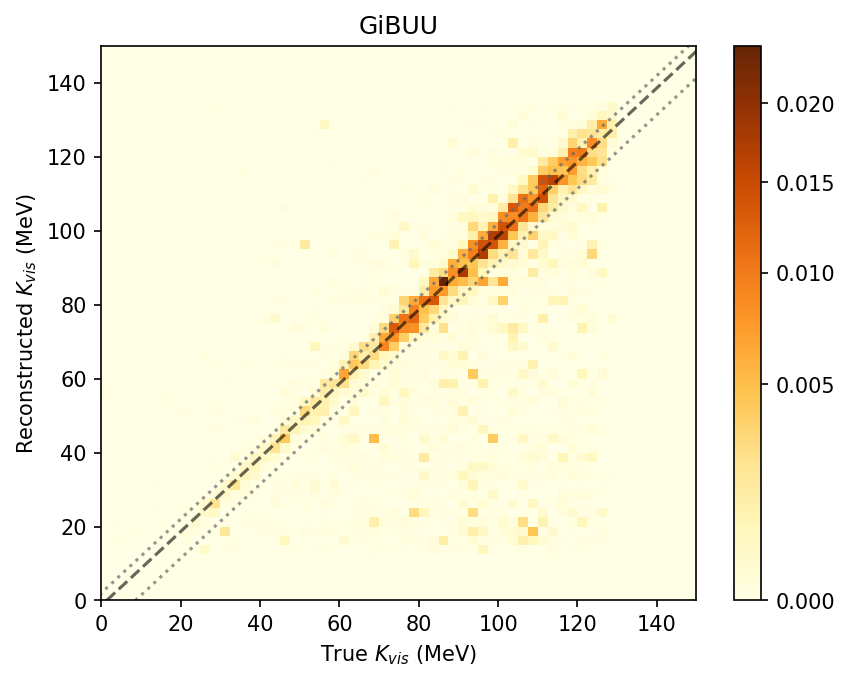

/var/folders/44/h4qhfb4d6r54v8lb5v_tptbc0000gp/T/ipykernel_28233/2642220664.py:77: RuntimeWarning: invalid value encountered in divide
  c = plt.pcolormesh(x, y, (dist).T/row_sum,cmap='YlGnBu',vmin=vmin3,vmax=vmax3)


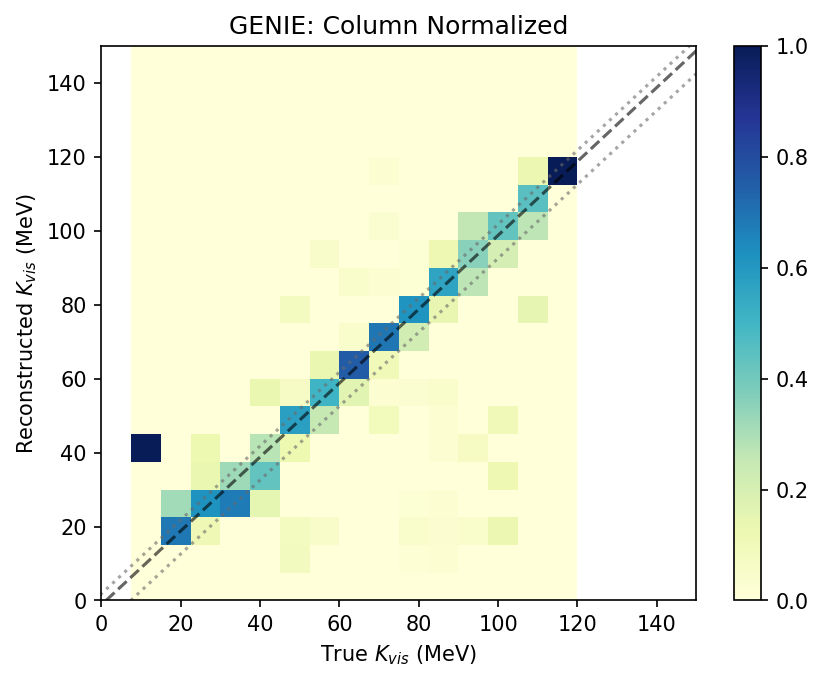

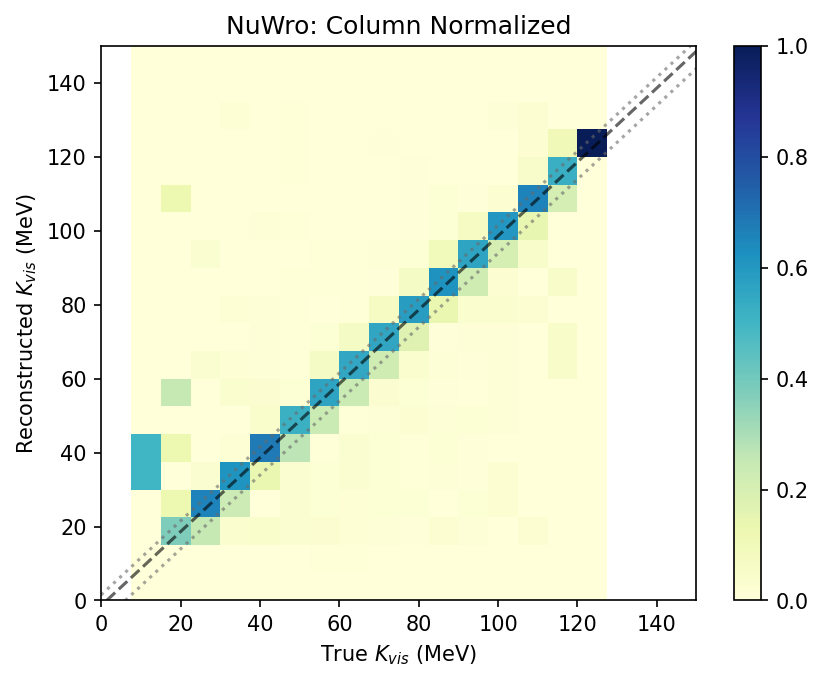

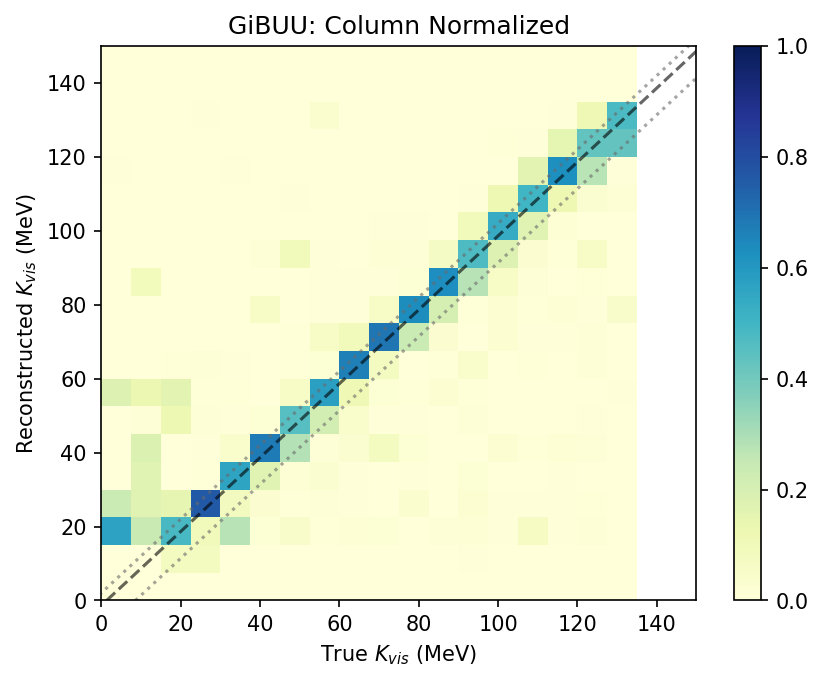

In [93]:
this_query = kdar.presel_query + "and ssm_kine_energy>0 and is_KDAR==1 and ssm_prim_track1_kine_energy_range<0 and truth_prim_p_energy<1"
plot_res_all([kdar_overlay_df,nuwro_df,gibuu_df],this_query,"true_KE_th35","ssm_KE",
                 -40,110,30,
                 0,150,60,0,150,60,0.6,
                 0,150,20,0,150,20,0,1,
                 axis_label=r"$K_{vis}$ (MeV)",
)

genie
mean: -3.584943543361149
median: -2.8779057156708916
std: 40.70188716647935
q1: -22.344899755422915
q3: 9.211684721955919
IQR: 15.778292238689417
FWHM: 12.084594330144219
RMS: 23.159775139921052

genie,computed with weights
mean: -9.79552796344755
median: -3.9174844503760227
std: 48.9010534640988
q1: -51.134983944375335
q3: 18.389251277210946
IQR: 34.76211761079314
FWHM: 27.17053158077666
RMS: 32.09936074176706


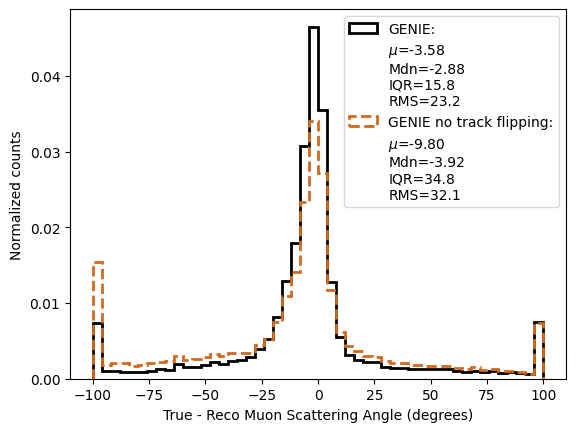

In [13]:
true_genie = kdar_overlay_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["true_angle"].to_numpy()*180/3.14
reco_genie = np.nan_to_num(np.arccos(kdar_overlay_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["ssm_cosMu"].to_numpy())*180/3.14,nan=0)
ssm_vtxX = kdar_overlay_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["ssm_vtxX"].to_numpy()
ssm_vtxY = kdar_overlay_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["ssm_vtxY"].to_numpy()
ssm_vtxZ = kdar_overlay_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["ssm_vtxZ"].to_numpy()
reco_nuvtxX = kdar_overlay_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["reco_nuvtxX"].to_numpy()
reco_nuvtxY = kdar_overlay_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["reco_nuvtxY"].to_numpy()
reco_nuvtxZ = kdar_overlay_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["reco_nuvtxZ"].to_numpy()
reco_genie_og = []
for i in range(len(reco_genie)):
    if abs(ssm_vtxX[i]-reco_nuvtxX[i])>1 or abs(ssm_vtxY[i]-reco_nuvtxY[i])>1 or abs(ssm_vtxZ[i]-reco_nuvtxZ[i])>1:
        reco_genie_og.append(180-reco_genie[i])
    else: reco_genie_og.append(reco_genie[i])

genie_weights = kdar_overlay_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["net_weight"].to_numpy()

print("genie")
diff_genie = true_genie-reco_genie
genie_mean,genie_q,genie_std,genie_iqr,genie_rms = get_stats(diff_genie,weights=genie_weights)
print("")

print("genie,computed with weights")
diff_genie_og = true_genie-np.array(reco_genie_og)
genie_og_mean,genie_og_q,genie_og_std,genie_og_iqr,genie_og_rms = get_stats(diff_genie_og,weights=genie_weights)

xmin = -100
xmax = 100
nbins = 50
plt.figure()
plt.hist(np.clip(diff_genie,xmin,xmax),bins=nbins,range=(xmin,xmax),label=f'GENIE:',histtype='step',color='black',lw=2,density=True,weights=genie_weights)
plt.plot([],[],lw=0,label=f'$\mu$={genie_mean:.2f}'+'\n'+f'Mdn={genie_q[1]:.2f}'+'\n'+f'IQR={genie_iqr:.1f}'+'\n'+f'RMS={genie_rms:.1f}')
plt.hist(np.clip(diff_genie_og,xmin,xmax),bins=nbins,range=(xmin,xmax),label=f'GENIE no track flipping:',color='chocolate',lw=2,density=True,histtype='step',weights=genie_weights,ls='--')
plt.plot([],[],lw=0,label=f'$\mu$={genie_og_mean:.2f}'+'\n'+f'Mdn={genie_og_q[1]:.2f}'+'\n'+f'IQR={genie_og_iqr:.1f}'+'\n'+f'RMS={genie_og_rms:.1f}')
plt.legend()
plt.ylabel("Normalized counts")
plt.xlabel(r"True - Reco Muon Scattering Angle (degrees)")
plt.show()

nuwro
mean: -10.359257319821037
median: -4.884822601775035
std: 46.14631009284404
q1: -41.46561016417469
q3: 6.859607011230216
IQR: 24.162608587702454
FWHM: 21.01458442746267
RMS: 28.61702722676681

nuwro,computed with weights
mean: -19.560422731307074
median: -7.497208933886029
std: 53.61798123398624
q1: -75.00541915158158
q3: 12.182642512154132
IQR: 43.594030831867855
FWHM: 37.99417613491371
RMS: 38.40445661604892


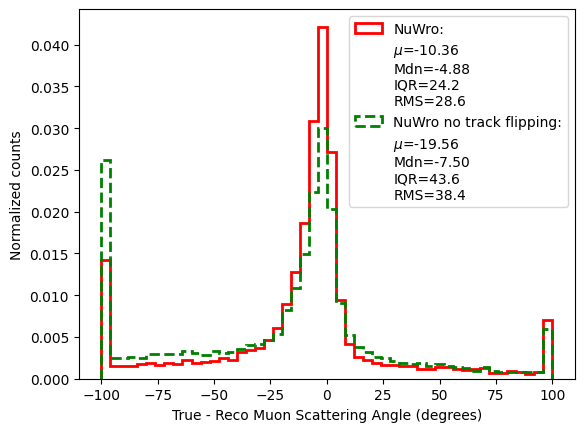

In [14]:
true_nuwro = nuwro_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["true_angle"].to_numpy()*180/3.14
reco_nuwro = np.nan_to_num(np.arccos(nuwro_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["ssm_cosMu"].to_numpy())*180/3.14,nan=0)
ssm_vtxX = nuwro_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["ssm_vtxX"].to_numpy()
ssm_vtxY = nuwro_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["ssm_vtxY"].to_numpy()
ssm_vtxZ = nuwro_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["ssm_vtxZ"].to_numpy()
reco_nuvtxX = nuwro_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["reco_nuvtxX"].to_numpy()
reco_nuvtxY = nuwro_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["reco_nuvtxY"].to_numpy()
reco_nuvtxZ = nuwro_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["reco_nuvtxZ"].to_numpy()
reco_nuwro_og = []
for i in range(len(reco_nuwro)):
    if abs(ssm_vtxX[i]-reco_nuvtxX[i])>1 or abs(ssm_vtxY[i]-reco_nuvtxY[i])>1 or abs(ssm_vtxZ[i]-reco_nuvtxZ[i])>1:
        reco_nuwro_og.append(180-reco_nuwro[i])
    else: reco_nuwro_og.append(reco_nuwro[i])

nuwro_weights = nuwro_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["net_weight"].to_numpy()

print("nuwro")
diff_nuwro = true_nuwro-reco_nuwro
nuwro_mean,nuwro_q,nuwro_std,nuwro_iqr,nuwro_rms = get_stats(diff_nuwro,weights=nuwro_weights)
print("")

print("nuwro,computed with weights")
diff_nuwro_og = true_nuwro-np.array(reco_nuwro_og)
nuwro_og_mean,nuwro_og_q,nuwro_og_std,nuwro_og_iqr,nuwro_og_rms = get_stats(diff_nuwro_og,weights=nuwro_weights)

xmin = -100
xmax = 100
nbins = 50
plt.figure()
plt.hist(np.clip(diff_nuwro,xmin,xmax),bins=nbins,range=(xmin,xmax),label=f'NuWro:',histtype='step',color='red',lw=2,density=True,weights=nuwro_weights)
plt.plot([],[],lw=0,label=f'$\mu$={nuwro_mean:.2f}'+'\n'+f'Mdn={nuwro_q[1]:.2f}'+'\n'+f'IQR={nuwro_iqr:.1f}'+'\n'+f'RMS={nuwro_rms:.1f}')
plt.hist(np.clip(diff_nuwro_og,xmin,xmax),bins=nbins,range=(xmin,xmax),label=f'NuWro no track flipping:',color='green',lw=2,density=True,histtype='step',weights=nuwro_weights,ls='--')
plt.plot([],[],lw=0,label=f'$\mu$={nuwro_og_mean:.2f}'+'\n'+f'Mdn={nuwro_og_q[1]:.2f}'+'\n'+f'IQR={nuwro_og_iqr:.1f}'+'\n'+f'RMS={nuwro_og_rms:.1f}')
plt.legend()
plt.ylabel("Normalized counts")
plt.xlabel(r"True - Reco Muon Scattering Angle (degrees)")
plt.show()

gibuu
mean: -4.028585880403864
median: -1.045340096981377
std: 44.574087939065144
q1: -31.934412238538727
q3: 13.637207328485474
IQR: 22.7858097835121
FWHM: 17.36217230605829
RMS: 25.71082688409305

gibuu,computed with weights
mean: -12.251769362926915
median: -2.2525598297717693
std: 48.85384067068779
q1: -61.292803998533714
q3: 15.041002293728368
IQR: 38.16690314613104
FWHM: 31.55566340612495
RMS: 32.204421156178476


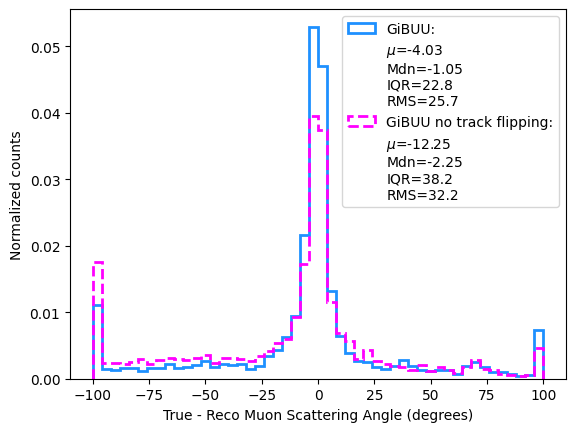

In [14]:
true_gibuu = gibuu_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["true_angle"].to_numpy()*180/3.14
reco_gibuu = np.nan_to_num(np.arccos(gibuu_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["ssm_cosMu"].to_numpy())*180/3.14,nan=0)
ssm_vtxX = gibuu_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["ssm_vtxX"].to_numpy()
ssm_vtxY = gibuu_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["ssm_vtxY"].to_numpy()
ssm_vtxZ = gibuu_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["ssm_vtxZ"].to_numpy()
reco_nuvtxX = gibuu_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["reco_nuvtxX"].to_numpy()
reco_nuvtxY = gibuu_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["reco_nuvtxY"].to_numpy()
reco_nuvtxZ = gibuu_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["reco_nuvtxZ"].to_numpy()
reco_gibuu_og = []
for i in range(len(reco_gibuu)):
    if abs(ssm_vtxX[i]-reco_nuvtxX[i])>1 or abs(ssm_vtxY[i]-reco_nuvtxY[i])>1 or abs(ssm_vtxZ[i]-reco_nuvtxZ[i])>1:
        reco_gibuu_og.append(180-reco_gibuu[i])
    else: reco_gibuu_og.append(reco_gibuu[i])

gibuu_weights = gibuu_df.query(kdar.presel_query).query("ssm_kine_energy>0 and kine_reco_Enu>0").query("is_KDAR==1")["net_weight"].to_numpy()

print("gibuu")
diff_gibuu = true_gibuu-reco_gibuu
gibuu_mean,gibuu_q,gibuu_std,gibuu_iqr,gibuu_rms = get_stats(diff_gibuu,weights=gibuu_weights)
print("")

print("gibuu,computed with weights")
diff_gibuu_og = true_gibuu-np.array(reco_gibuu_og)
gibuu_og_mean,gibuu_og_q,gibuu_og_std,gibuu_og_iqr,gibuu_og_rms = get_stats(diff_gibuu_og,weights=gibuu_weights)

xmin = -100
xmax = 100
nbins = 50
plt.figure()
plt.hist(np.clip(diff_gibuu,xmin,xmax),bins=nbins,range=(xmin,xmax),label=f'GiBUU:',histtype='step',color='dodgerblue',lw=2,density=True,weights=gibuu_weights)
plt.plot([],[],lw=0,label=f'$\mu$={gibuu_mean:.2f}'+'\n'+f'Mdn={gibuu_q[1]:.2f}'+'\n'+f'IQR={gibuu_iqr:.1f}'+'\n'+f'RMS={gibuu_rms:.1f}')
plt.hist(np.clip(diff_gibuu_og,xmin,xmax),bins=nbins,range=(xmin,xmax),label=f'GiBUU no track flipping:',color='magenta',lw=2,density=True,histtype='step',weights=gibuu_weights,ls='--')
plt.plot([],[],lw=0,label=f'$\mu$={gibuu_og_mean:.2f}'+'\n'+f'Mdn={gibuu_og_q[1]:.2f}'+'\n'+f'IQR={gibuu_og_iqr:.1f}'+'\n'+f'RMS={gibuu_og_rms:.1f}')
plt.legend()
plt.ylabel("Normalized counts")
plt.xlabel(r"True - Reco Muon Scattering Angle (degrees)")
plt.show()

genie
mean: 4.483598035750237
median: 5.9661143569946375
std: 22.20989283186419
q1: -9.963294193267817
q3: 19.979675128936776
IQR: 14.971484661102297
FWHM: 11.163048972384953
RMS: 15.64050751708242

genie,computed with weights
mean: 18.713854161420752
median: 18.415566757202157
std: 20.979646394860335
q1: 2.660367801666265
q3: 36.24654848861695
IQR: 16.793090343475342
FWHM: 18.172024062950463
RMS: 22.755656306994936


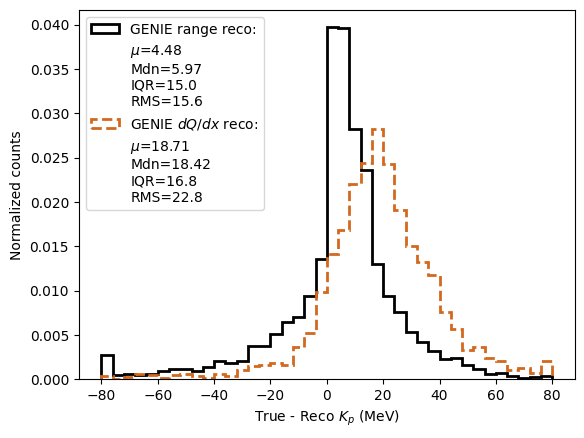

In [16]:
true_genie = kdar_overlay_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["truth_prim_p_energy"].to_numpy()
reco_genie = kdar_overlay_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["ssm_prim_track1_kine_energy_range"].to_numpy()
reco_genie_og = kdar_overlay_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["ssm_prim_track1_kine_energy_cal"].to_numpy()

genie_weights = kdar_overlay_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["net_weight"].to_numpy()

print("genie")
diff_genie = true_genie-reco_genie
genie_mean,genie_q,genie_std,genie_iqr,genie_rms = get_stats(diff_genie,weights=genie_weights)
print("")

print("genie,computed with weights")
diff_genie_og = true_genie-np.array(reco_genie_og)
genie_og_mean,genie_og_q,genie_og_std,genie_og_iqr,genie_og_rms = get_stats(diff_genie_og,weights=genie_weights)

xmin = -80
xmax = 80
nbins = 40
plt.figure()
plt.hist(np.clip(diff_genie,xmin,xmax),bins=nbins,range=(xmin,xmax),label=f'GENIE range reco:',histtype='step',color='black',lw=2,density=True,weights=genie_weights)
plt.plot([],[],lw=0,label=f'$\mu$={genie_mean:.2f}'+'\n'+f'Mdn={genie_q[1]:.2f}'+'\n'+f'IQR={genie_iqr:.1f}'+'\n'+f'RMS={genie_rms:.1f}')
plt.hist(np.clip(diff_genie_og,xmin,xmax),bins=nbins,range=(xmin,xmax),label=f'GENIE $dQ/dx$ reco:',color='chocolate',lw=2,density=True,histtype='step',weights=genie_weights,ls='--')
plt.plot([],[],lw=0,label=f'$\mu$={genie_og_mean:.2f}'+'\n'+f'Mdn={genie_og_q[1]:.2f}'+'\n'+f'IQR={genie_og_iqr:.1f}'+'\n'+f'RMS={genie_og_rms:.1f}')
plt.legend()
plt.ylabel("Normalized counts")
plt.xlabel(r"True - Reco $K_p$ (MeV)")
plt.show()

nuwro
mean: 3.1377429200222706
median: 5.370124176025399
std: 26.107078331771564
q1: -14.203544303894034
q3: 22.622100189208993
IQR: 18.412822246551514
FWHM: 13.35571121059536
RMS: 18.22508095495589

nuwro,computed with weights
mean: 19.255658302945783
median: 18.489491775512704
std: 23.7881282369341
q1: 1.6535352020263758
q3: 40.10372383880616
IQR: 19.225094318389893
FWHM: 20.06889910037151
RMS: 24.48661652440246


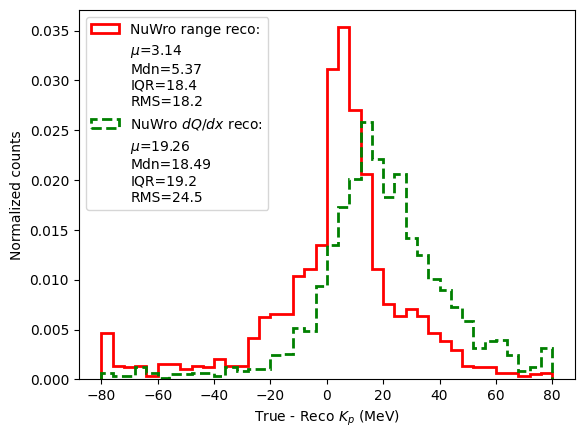

In [17]:
true_nuwro = nuwro_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["truth_prim_p_energy"].to_numpy()
reco_nuwro = nuwro_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["ssm_prim_track1_kine_energy_range"].to_numpy()
reco_nuwro_og = nuwro_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["ssm_prim_track1_kine_energy_cal"].to_numpy()

nuwro_weights = nuwro_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["net_weight"].to_numpy()

print("nuwro")
diff_nuwro = true_nuwro-reco_nuwro
nuwro_mean,nuwro_q,nuwro_std,nuwro_iqr,nuwro_rms = get_stats(diff_nuwro,weights=nuwro_weights)
print("")

print("nuwro,computed with weights")
diff_nuwro_og = true_nuwro-np.array(reco_nuwro_og)
nuwro_og_mean,nuwro_og_q,nuwro_og_std,nuwro_og_iqr,nuwro_og_rms = get_stats(diff_nuwro_og,weights=nuwro_weights)

xmin = -80
xmax = 80
nbins = 40
plt.figure()
plt.hist(np.clip(diff_nuwro,xmin,xmax),bins=nbins,range=(xmin,xmax),label=f'NuWro range reco:',histtype='step',color='red',lw=2,density=True,weights=nuwro_weights)
plt.plot([],[],lw=0,label=f'$\mu$={nuwro_mean:.2f}'+'\n'+f'Mdn={nuwro_q[1]:.2f}'+'\n'+f'IQR={nuwro_iqr:.1f}'+'\n'+f'RMS={nuwro_rms:.1f}')
plt.hist(np.clip(diff_nuwro_og,xmin,xmax),bins=nbins,range=(xmin,xmax),label=f'NuWro $dQ/dx$ reco:',color='green',lw=2,density=True,histtype='step',weights=nuwro_weights,ls='--')
plt.plot([],[],lw=0,label=f'$\mu$={nuwro_og_mean:.2f}'+'\n'+f'Mdn={nuwro_og_q[1]:.2f}'+'\n'+f'IQR={nuwro_og_iqr:.1f}'+'\n'+f'RMS={nuwro_og_rms:.1f}')
plt.legend()
plt.ylabel("Normalized counts")
plt.xlabel(r"True - Reco $K_p$ (MeV)")
plt.show()

gibuu
mean: -2.264766284394353
median: 4.192039325714116
std: 24.66321583193874
q1: -18.63659875106811
q3: 14.348090961456307
IQR: 16.492344856262207
FWHM: 11.760001352535399
RMS: 16.461202708457638

gibuu,computed with weights
mean: 13.74197046510411
median: 16.298769309997567
std: 21.852772706039655
q1: 1.3910373001098684
q3: 32.6226499824524
IQR: 15.615806341171266
FWHM: 16.326146794696374
RMS: 20.71399929886261


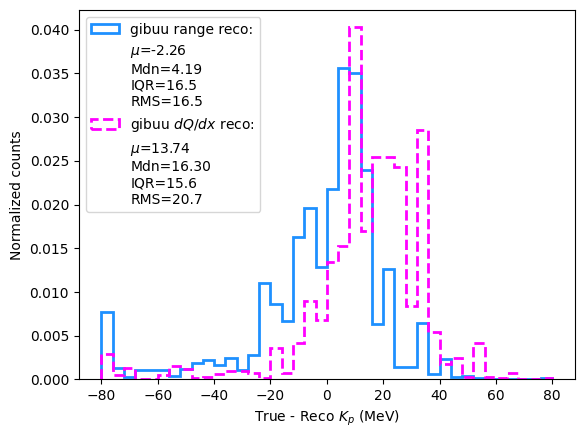

In [13]:
true_gibuu = gibuu_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["truth_prim_p_energy"].to_numpy()
reco_gibuu = gibuu_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["ssm_prim_track1_kine_energy_range"].to_numpy()
reco_gibuu_og = gibuu_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["ssm_prim_track1_kine_energy_cal"].to_numpy()

gibuu_weights = gibuu_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["net_weight"].to_numpy()

print("gibuu")
diff_gibuu = true_gibuu-reco_gibuu
gibuu_mean,gibuu_q,gibuu_std,gibuu_iqr,gibuu_rms = get_stats(diff_gibuu,weights=gibuu_weights)
print("")

print("gibuu,computed with weights")
diff_gibuu_og = true_gibuu-np.array(reco_gibuu_og)
gibuu_og_mean,gibuu_og_q,gibuu_og_std,gibuu_og_iqr,gibuu_og_rms = get_stats(diff_gibuu_og,weights=gibuu_weights)

xmin = -80
xmax = 80
nbins = 40
plt.figure()
plt.hist(np.clip(diff_gibuu,xmin,xmax),bins=nbins,range=(xmin,xmax),label=f'gibuu range reco:',histtype='step',color='dodgerblue',lw=2,density=True,weights=gibuu_weights)
plt.plot([],[],lw=0,label=f'$\mu$={gibuu_mean:.2f}'+'\n'+f'Mdn={gibuu_q[1]:.2f}'+'\n'+f'IQR={gibuu_iqr:.1f}'+'\n'+f'RMS={gibuu_rms:.1f}')
plt.hist(np.clip(diff_gibuu_og,xmin,xmax),bins=nbins,range=(xmin,xmax),label=f'gibuu $dQ/dx$ reco:',color='magenta',lw=2,density=True,histtype='step',weights=gibuu_weights,ls='--')
plt.plot([],[],lw=0,label=f'$\mu$={gibuu_og_mean:.2f}'+'\n'+f'Mdn={gibuu_og_q[1]:.2f}'+'\n'+f'IQR={gibuu_og_iqr:.1f}'+'\n'+f'RMS={gibuu_og_rms:.1f}')
plt.legend()
plt.ylabel("Normalized counts")
plt.xlabel(r"True - Reco $K_p$ (MeV)")
plt.show()

genie
mean: 4.483598035750237
median: 5.9661143569946375
std: 22.20989283186419
q1: -9.963294193267817
q3: 19.979675128936776
IQR: 14.971484661102297
FWHM: 11.163048972384953
RMS: 15.64050751708242

genie,computed with weights
mean: 13.819488947534538
median: 15.703272178649907
std: 25.32645694652895
q1: -0.8592659683227453
q3: 34.01235945510865
IQR: 17.4358127117157
FWHM: 17.011605845038826
RMS: 22.351626774157452


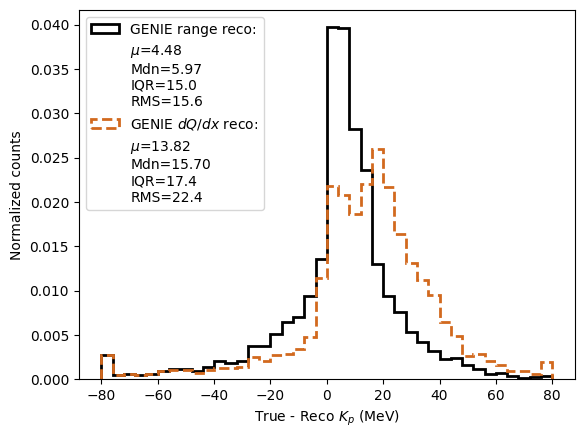

In [19]:
true_genie = kdar_overlay_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["truth_prim_p_energy"].to_numpy()
reco_genie = kdar_overlay_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["ssm_prim_track1_kine_energy_range"].to_numpy()
reco_genie_og_temp1 = kdar_overlay_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["ssm_prim_track1_kine_energy_cal"].to_numpy()
reco_genie_og_temp2 = kdar_overlay_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["ssm_prim_track1_kine_energy_range"].to_numpy()
reco_genie_length = kdar_overlay_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["ssm_prim_track1_length"].to_numpy()
reco_genie_og = []
for i in range(len(reco_genie_length)):
    if reco_genie_length[i]>4: reco_genie_og.append(reco_genie_og_temp2[i])
    else: reco_genie_og.append(reco_genie_og_temp1[i])
reco_genie_og = np.array(reco_genie_og)        

genie_weights = kdar_overlay_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["net_weight"].to_numpy()

print("genie")
diff_genie = true_genie-reco_genie
genie_mean,genie_q,genie_std,genie_iqr,genie_rms = get_stats(diff_genie,weights=genie_weights)
print("")

print("genie,computed with weights")
diff_genie_og = true_genie-np.array(reco_genie_og)
genie_og_mean,genie_og_q,genie_og_std,genie_og_iqr,genie_og_rms = get_stats(diff_genie_og,weights=genie_weights)

xmin = -80
xmax = 80
nbins = 40
plt.figure()
plt.hist(np.clip(diff_genie,xmin,xmax),bins=nbins,range=(xmin,xmax),label=f'GENIE range reco:',histtype='step',color='black',lw=2,density=True,weights=genie_weights)
plt.plot([],[],lw=0,label=f'$\mu$={genie_mean:.2f}'+'\n'+f'Mdn={genie_q[1]:.2f}'+'\n'+f'IQR={genie_iqr:.1f}'+'\n'+f'RMS={genie_rms:.1f}')
plt.hist(np.clip(diff_genie_og,xmin,xmax),bins=nbins,range=(xmin,xmax),label=f'GENIE $dQ/dx$ reco:',color='chocolate',lw=2,density=True,histtype='step',weights=genie_weights,ls='--')
plt.plot([],[],lw=0,label=f'$\mu$={genie_og_mean:.2f}'+'\n'+f'Mdn={genie_og_q[1]:.2f}'+'\n'+f'IQR={genie_og_iqr:.1f}'+'\n'+f'RMS={genie_og_rms:.1f}')
plt.legend()
plt.ylabel("Normalized counts")
plt.xlabel(r"True - Reco $K_p$ (MeV)")
plt.show()

nuwro
mean: 3.1377429200222706
median: 5.370124176025399
std: 26.107078331771564
q1: -14.203544303894034
q3: 22.622100189208993
IQR: 18.412822246551514
FWHM: 13.35571121059536
RMS: 18.22508095495589

nuwro,computed with weights
mean: 12.58637501130607
median: 14.48361475753785
std: 28.951727479266836
q1: -3.519085571289054
q3: 35.12221796798707
IQR: 19.32065176963806
FWHM: 17.64903792171721
RMS: 24.029493582082925


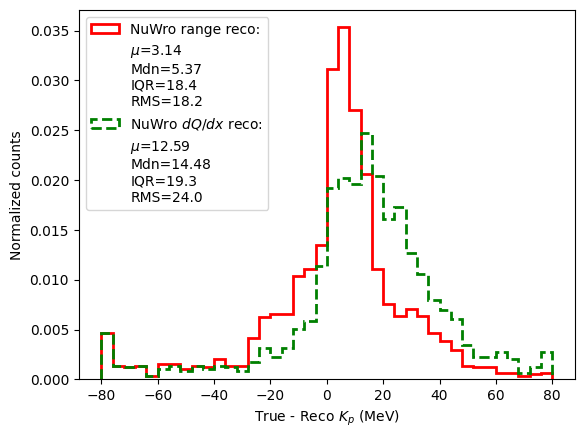

In [20]:
true_nuwro = nuwro_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["truth_prim_p_energy"].to_numpy()
reco_nuwro = nuwro_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["ssm_prim_track1_kine_energy_range"].to_numpy()
reco_nuwro_og_temp1 = nuwro_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["ssm_prim_track1_kine_energy_cal"].to_numpy()
reco_nuwro_og_temp2 = nuwro_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["ssm_prim_track1_kine_energy_range"].to_numpy()
reco_nuwro_length = nuwro_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["ssm_prim_track1_length"].to_numpy()
reco_nuwro_og = []
for i in range(len(reco_nuwro_length)):
    if reco_nuwro_length[i]>4: reco_nuwro_og.append(reco_nuwro_og_temp2[i])
    else: reco_nuwro_og.append(reco_nuwro_og_temp1[i])
reco_nuwro_og = np.array(reco_nuwro_og)        

nuwro_weights = nuwro_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["net_weight"].to_numpy()

print("nuwro")
diff_nuwro = true_nuwro-reco_nuwro
nuwro_mean,nuwro_q,nuwro_std,nuwro_iqr,nuwro_rms = get_stats(diff_nuwro,weights=nuwro_weights)
print("")

print("nuwro,computed with weights")
diff_nuwro_og = true_nuwro-np.array(reco_nuwro_og)
nuwro_og_mean,nuwro_og_q,nuwro_og_std,nuwro_og_iqr,nuwro_og_rms = get_stats(diff_nuwro_og,weights=nuwro_weights)

xmin = -80
xmax = 80
nbins = 40
plt.figure()
plt.hist(np.clip(diff_nuwro,xmin,xmax),bins=nbins,range=(xmin,xmax),label=f'NuWro range reco:',histtype='step',color='red',lw=2,density=True,weights=nuwro_weights)
plt.plot([],[],lw=0,label=f'$\mu$={nuwro_mean:.2f}'+'\n'+f'Mdn={nuwro_q[1]:.2f}'+'\n'+f'IQR={nuwro_iqr:.1f}'+'\n'+f'RMS={nuwro_rms:.1f}')
plt.hist(np.clip(diff_nuwro_og,xmin,xmax),bins=nbins,range=(xmin,xmax),label=f'NuWro $dQ/dx$ reco:',color='green',lw=2,density=True,histtype='step',weights=nuwro_weights,ls='--')
plt.plot([],[],lw=0,label=f'$\mu$={nuwro_og_mean:.2f}'+'\n'+f'Mdn={nuwro_og_q[1]:.2f}'+'\n'+f'IQR={nuwro_og_iqr:.1f}'+'\n'+f'RMS={nuwro_og_rms:.1f}')
plt.legend()
plt.ylabel("Normalized counts")
plt.xlabel(r"True - Reco $K_p$ (MeV)")
plt.show()

gibuu
mean: -2.264766284394353
median: 4.192039325714116
std: 24.66321583193874
q1: -18.63659875106811
q3: 14.348090961456307
IQR: 16.492344856262207
FWHM: 11.760001352535399
RMS: 16.461202708457638

gibuu,computed with weights
mean: 9.920717578827558
median: 14.76628382492066
std: 27.2199531497305
q1: -2.3449427337646434
q3: 32.45555408287049
IQR: 17.400248408317566
FWHM: 16.2700779596378
RMS: 22.231586721457386


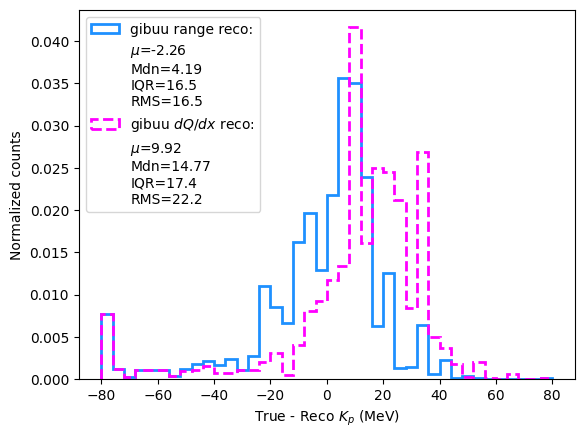

In [12]:
true_gibuu = gibuu_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["truth_prim_p_energy"].to_numpy()
reco_gibuu = gibuu_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["ssm_prim_track1_kine_energy_range"].to_numpy()
reco_gibuu_og_temp1 = gibuu_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["ssm_prim_track1_kine_energy_cal"].to_numpy()
reco_gibuu_og_temp2 = gibuu_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["ssm_prim_track1_kine_energy_range"].to_numpy()
reco_gibuu_length = gibuu_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["ssm_prim_track1_length"].to_numpy()
reco_gibuu_og = []
for i in range(len(reco_gibuu_length)):
    if reco_gibuu_length[i]>4: reco_gibuu_og.append(reco_gibuu_og_temp2[i])
    else: reco_gibuu_og.append(reco_gibuu_og_temp1[i])
reco_gibuu_og = np.array(reco_gibuu_og)  

gibuu_weights = gibuu_df.query(kdar.presel_query).query("ssm_prim_track1_kine_energy_range>0").query("truth_prim_p_energy>0").query("ssm_kine_energy>0").query("is_KDAR==1")["net_weight"].to_numpy()

print("gibuu")
diff_gibuu = true_gibuu-reco_gibuu
gibuu_mean,gibuu_q,gibuu_std,gibuu_iqr,gibuu_rms = get_stats(diff_gibuu,weights=gibuu_weights)
print("")

print("gibuu,computed with weights")
diff_gibuu_og = true_gibuu-np.array(reco_gibuu_og)
gibuu_og_mean,gibuu_og_q,gibuu_og_std,gibuu_og_iqr,gibuu_og_rms = get_stats(diff_gibuu_og,weights=gibuu_weights)

xmin = -80
xmax = 80
nbins = 40
plt.figure()
plt.hist(np.clip(diff_gibuu,xmin,xmax),bins=nbins,range=(xmin,xmax),label=f'gibuu range reco:',histtype='step',color='dodgerblue',lw=2,density=True,weights=gibuu_weights)
plt.plot([],[],lw=0,label=f'$\mu$={gibuu_mean:.2f}'+'\n'+f'Mdn={gibuu_q[1]:.2f}'+'\n'+f'IQR={gibuu_iqr:.1f}'+'\n'+f'RMS={gibuu_rms:.1f}')
plt.hist(np.clip(diff_gibuu_og,xmin,xmax),bins=nbins,range=(xmin,xmax),label=f'gibuu $dQ/dx$ reco:',color='magenta',lw=2,density=True,histtype='step',weights=gibuu_weights,ls='--')
plt.plot([],[],lw=0,label=f'$\mu$={gibuu_og_mean:.2f}'+'\n'+f'Mdn={gibuu_og_q[1]:.2f}'+'\n'+f'IQR={gibuu_og_iqr:.1f}'+'\n'+f'RMS={gibuu_og_rms:.1f}')
plt.legend()
plt.ylabel("Normalized counts")
plt.xlabel(r"True - Reco $K_p$ (MeV)")
plt.show()

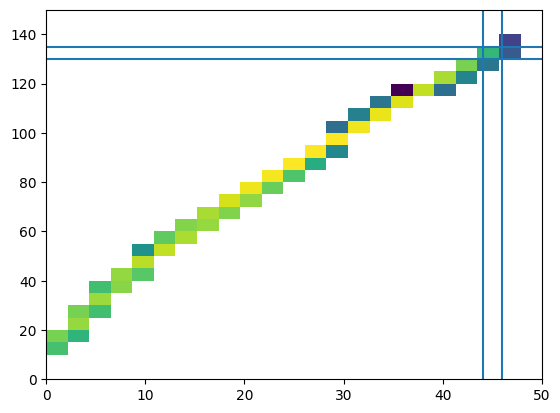

In [23]:
plt.hist2d(gibuu_df.query(kdar.presel_query).query(kdar.presel_query)["ssm_length"].to_numpy(),gibuu_df.query(kdar.presel_query)["ssm_kine_energy"].to_numpy(),bins=(23,30),range=((0,50),(0,150)),norm=mpl.colors.LogNorm())
plt.axvline(46)
plt.axhline(135)
plt.axvline(44)
plt.axhline(130)
plt.show()





